## Libraries

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import geopandas as gpd
# gpd.options.io_engine = "pyogrio"
import pandas as pd
from scipy import stats
from mpl_toolkits.basemap import Basemap
import itertools
import re
import glob
import netCDF4
import rasterio as rio

import xarray as xr
import rioxarray as rxr
from datetime import datetime, timedelta, date

from joblib import Parallel, delayed
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import io
import operator


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
pd.options.mode.chained_assignment = None  # default='warn'

import xarray as xr  
import cartopy.crs as ccrs 
from matplotlib import colors as mplcol
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import ast


import Global_Functions


## Preprocessing

### 1) Warping of peat maps: To review wrong edits

## Mosaic gridded tiles

### 1) BA

In [ ]:
zone = 'Siberia'
local_path = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/Landsat_BA/Siberia'
SYN = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/FireCCI_C3S/SYN/BA_Annual_2019.tif'
res = 1
aoi = gpd.read_file(f'{local_path}/../Regions/{zone}.shp')
bounds = aoi.total_bounds
Years = range(2023, 2000, -1)
layers = [f'BA_Area_{str(res).replace(".", "")}D', 
          f'PeatMap_Area_{str(res).replace(".", "")}D', 
          f'PeatFire_Area_{str(res).replace(".", "")}D',
          ]
layers = ['%s_%s' %(year, i) for i, year in itertools.product(Years, layers)]
patterns = [re.compile("Grid/*%s_TILE-[0-9]{2,}[A-Z][0-9]{2,}[A-Z]_%s" %(i[:-5], i[-4:])) for i in layers]
for n, p in zip(layers, patterns):
    print(n, p)
    Global_Functions.mosaic_gdal(n, f'{local_path}/PeatFire/Summaries', p, f'{local_path}/PeatFire/ByTile', '/vsimem', bounds=bounds)

### 2) BGCC Emissions

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
aoi = gpd.read_file(f'{local_path}/../Regions/Siberia.shp')
bounds = aoi.total_bounds
res = 0.25
Years = range(2023, 2000, -1)
layers = [
        f'BGCC-MgC_SUM_{str(res).replace(".", "")}D_ALL', 
        f'BGCC-MgC_SUM_{str(res).replace(".", "")}D_PEAT', 
        f'AGCC-MgC_SUM_{str(res).replace(".", "")}D_ALL', 
        f'AGCC-MgC_SUM_{str(res).replace(".", "")}D_PEAT', 
          ]
layers = ['%s_%s' %(year, i) for i, year in itertools.product(Years, layers)]
patterns = [re.compile(l) for l in layers]
for n, p in zip(layers, patterns):
    print(n, p)
    Global_Functions.mosaic_gdal(n, f'{local_path}/PeatFire/Summaries', p, f'{local_path}/PeatFire/ByTile/', '/vsimem', bounds=bounds)

### 3) GFED

#### GFED5 Beta

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
GFED5_BA = {'ALL': {}, 'PEAT': {}, 'EM': {}}
for year in range(2002, 2023):
    print(f'####### {year}')
    nc = netCDF4.Dataset(f"{local_path}/Data/GFED/GFED5_Beta_monthly_{year}.nc")
    lathandle = nc.variables['lat'][:]
    lonhandle = nc.variables['lon'][:]
    lats = np.round(lathandle[:], 5)
    lons = np.round(lonhandle[:], 5)
    xres = np.round(lons[1] - lons[0], 5)
    yres = np.round(lats[1] - lats[0], 5)
    xmin, ymin, xmax, ymax = 63, 58, 180, 74
    try:
        index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
    except:
        if xmax == 180:
            index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], None)
    index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
    area = nc.variables['grid_area'][index_lat, index_lon]
    layers = {'ALL': [nc.variables['C'][:, index_lat, index_lon], 
                      nc.variables['burned_area'][:, index_lat, index_lon]], 
              'PEAT': [nc.groups["carbon_emissions_partitioning"].variables['C_PEAT'][:, index_lat, index_lon],
                      nc.groups['burned_area_partitioning'].variables['BA_PEAT'][:, index_lat, index_lon]]
             }  
    for l, arr in layers.items():
        print(f'*** {l}')
        c_mean = np.sum(arr[0] / arr[1], 0)
        c_sum = np.sum(arr[0] * area * 1e-6, 0)
 
        Global_Functions.write_rasterio(c_sum, 
                                        f"{local_path}/PeatFire/Summaries/GFED5_{l}-C_SUM_025D_{year}.tif",
                                       refPath=ref, nodata=arr[0].fill_value)
        Global_Functions.write_rasterio(c_mean, 
                                        f"{local_path}/PeatFire/Summaries/GFED5_{l}-C_MEAN_025D_{year}.tif",
                                       refPath=ref, nodata=arr[0].fill_value)
        
        Global_Functions.write_rasterio(np.sum(arr[1] * area, 0), 
                                        f"{local_path}/PeatFire/Summaries/GFED5_{l}-BA_025D_{year}.tif",
                                       refPath=ref, nodata=arr[0].fill_value)
        if l == 'PEAT':
            GFED5_BA['PEAT'][str(year)] = np.sum(arr[1] * area)
        else:
            GFED5_BA['ALL'][str(year)] = np.sum(arr[1] * area)
            GFED5_BA['EM'][str(year)] = np.sum(c_sum)

####### 2002
*** ALL
*** PEAT
####### 2003
*** ALL
*** PEAT
####### 2004
*** ALL
*** PEAT
####### 2005
*** ALL
*** PEAT
####### 2006
*** ALL
*** PEAT
####### 2007
*** ALL
*** PEAT
####### 2008
*** ALL
*** PEAT
####### 2009
*** ALL
*** PEAT
####### 2010
*** ALL
*** PEAT
####### 2011
*** ALL
*** PEAT
####### 2012
*** ALL
*** PEAT
####### 2013
*** ALL
*** PEAT
####### 2014
*** ALL
*** PEAT
####### 2015
*** ALL
*** PEAT
####### 2016
*** ALL
*** PEAT
####### 2017
*** ALL
*** PEAT
####### 2018
*** ALL
*** PEAT
####### 2019
*** ALL
*** PEAT
####### 2020
*** ALL
*** PEAT
####### 2021
*** ALL
*** PEAT
####### 2022
*** ALL
*** PEAT


In [78]:
GFED5_BA = pd.DataFrame(GFED5_BA)
GFED5_BA['PEAT_Fraction'] = GFED5_BA['PEAT'] / GFED5_BA['ALL'] * 100
np.sort(GFED5_BA.PEAT_Fraction)

array([0.4628147 , 0.5477991 , 0.57344854, 0.77449924, 0.78276426,
       0.8201197 , 0.8551321 , 1.0777646 , 1.099642  , 1.2565339 ,
       1.3597776 , 1.4040825 , 1.4303455 , 1.4976484 , 2.834249  ,
       2.9063175 , 3.1592984 , 3.4707372 , 5.5031395 ], dtype=float32)

#### GFED4s

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
with rio.open(ref) as src:
    profile = src.profile
GFED4s_BA = {'ALL': {}, 'PEAT': {}}
for year in range(2001, 2017):
    print(f'####### {year}')
    nc = netCDF4.Dataset(glob.glob(f"{local_path}/Data/GFED/GFED4.1s_{year}.hdf5")[0])
    lathandle = nc.variables['lat'][:, 0]
    lonhandle = nc.variables['lon'][0, :]
    lats = np.round(lathandle[:], 5)
    lons = np.round(lonhandle[:], 5)
    xres = np.round(lons[1] - lons[0], 5)
    yres = np.round(lats[1] - lats[0], 5)
    xmin, ymin, xmax, ymax = 63, 58, 180, 74
    try:
        index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
    except:
        if xmax == 180:
            index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], int(lons.shape[0]))
    index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
    gt = profile['transform']
    profile['transform'] = rio.Affine(xres, gt[1], gt[2], gt[3], yres, gt[5])
    profile['width'] = index_lon.stop - index_lon.start
    profile['height'] = index_lat.stop - index_lat.start
    # print(profile)
    
    area = nc.groups['ancill'].variables['grid_cell_area'][index_lat, index_lon]
    layers = ['ALL', 'PEAT']
    
    c_sum = np.zeros((12, 64, 468))
    c_mean = np.zeros((12, 64, 468))
    BA = np.zeros((12, 64, 468))
    for l  in layers[:]:
        p = 1
        print(f'*** {l}')
        for m in range(12):
            doy = datetime.strptime("%s%02d" %(year, m+1), "%Y%m").strftime("%Y%j")
            # try: ## only until 2016
            burned_fraction = nc.groups['burned_area'].groups['%02d' %(m+1)].variables['burned_fraction'][index_lat, index_lon]
            # except:
            #     pass
            c_month = nc.groups['emissions'].groups['%02d' %(m+1)].variables['C'][index_lat, index_lon]
            print(burned_fraction.max())
            
            if l == 'PEAT':
                p = nc.groups['emissions'].groups['%02d' %(m+1)].groups['partitioning'].variables['DM_PEAT'][index_lat, index_lon]
                print(f'peat fraction: {np.sum(p * area) / np.sum(area)}')
                c_month = c_month * p 
                
            c_sum[m] = c_month * area * 1e-6
            # if year < 2017:
            c_mean[m] = c_month / burned_fraction
            BA[m] = burned_fraction * area * p
               
        Global_Functions.write_rasterio(c_sum.sum(0), 
                                        f"{local_path}/PeatFire/Summaries/GFED4s_{l}-C_SUM_025D_{year}.tif",
                                       profile=profile)
        Global_Functions.write_rasterio(c_mean.sum(0), 
                                        f"{local_path}/PeatFire/Summaries/GFED4s_{l}-C_MEAN_025D_{year}.tif",
                                       profile=profile)
        Global_Functions.write_rasterio(np.sum(BA, 0), 
                                        f"{local_path}/PeatFire/Summaries/GFED4s_{l}-BA_025D_{year}.tif",
                                       profile=profile)
        # if year < 2017:
        GFED4s_BA[l][str(year)] = np.sum(BA)

In [457]:
GFED4s_BA = pd.DataFrame(GFED4s_BA)
GFED4s_BA['PEAT_Fraction'] = GFED4s_BA['PEAT'] / GFED4s_BA['ALL'] * 100
GFED4s_BA

,ALL,PEAT,PEAT_Fraction
2001,3.232503e+10,8.877916e+08,2.746453
2002,4.466864e+10,7.571469e+08,1.695030
2003,3.310743e+10,1.876647e+09,5.668356
2004,3.844555e+09,1.348176e+08,3.506716
2005,1.515105e+10,3.493980e+08,2.306097
2006,1.782884e+10,2.022173e+08,1.134215
2007,4.730576e+09,2.717492e+08,5.744527
2008,1.692221e+10,2.408161e+08,1.423077
2009,1.657652e+10,5.000227e+08,3.016451
2010,2.244239e+10,1.539062e+09,6.857834


#### GFED 500m Van Wees

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
for year in range(2002, 2023):
    print(f'####### {year}')
    nc = netCDF4.Dataset(f"{local_path}/Data/GFED500/Model500m_2002-2022yr_025d_{year}.nc")
    lathandle = nc.groups['MOD_CMG025'].variables['lat'][:]
    lonhandle = nc.groups['MOD_CMG025'].variables['lon'][:]
    lats = np.round(lathandle[:], 5)
    lons = np.round(lonhandle[:], 5)
    xres = np.round(lons[1] - lons[0], 5)
    yres = np.round(lats[1] - lats[0], 5)
    xmin, ymin, xmax, ymax = 63, 58, 180, 74
    try:
        index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
    except:
        if xmax == 180:
            index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], None)
    index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
    area = nc.groups['MOD_CMG025'].variables['grid_cell_area'][index_lat, index_lon]
    bg = nc.groups['MOD_CMG025'].groups['emissions'].variables['C_BG_TOT'][:, index_lat, index_lon]
    ag = nc.groups['MOD_CMG025'].groups['emissions'].variables['C_AG_TOT'][:, index_lat, index_lon]
    ba = nc.groups['MOD_CMG025'].groups['burned_area'].variables['BA_TOT'][:, index_lat, index_lon]
    layers = {'ALL': [bg + ag, ba], 
              'BG': [bg, ba]
             }  
    for l, arr in layers.items():
        print(f'*** {l}')
        c_mean = np.sum(arr[0] / arr[1], 0)
        c_sum = np.sum(arr[0] * area * 1e-6, 0)
 
        Global_Functions.write_rasterio(c_sum, 
                                        f"{local_path}/PeatFire/Summaries/GFED500_{l}-C_SUM_025D_{year}.tif",
                                       refPath=ref, nodata=arr[0].fill_value)
        Global_Functions.write_rasterio(c_mean, 
                                        f"{local_path}/PeatFire/Summaries/GFED500_{l}-C_MEAN_025D_{year}.tif",
                                       refPath=ref, nodata=arr[0].fill_value)
    print(np.sum(ba * area) * 1e-10)  
    Global_Functions.write_rasterio(np.sum(ba * area, 0), 
                                    f"{local_path}/PeatFire/Summaries/GFED500_ALL-BA_025D_{year}.tif",
                                   refPath=ref, nodata=arr[0].fill_value)
        

####### 2002
4.829696
####### 2003
3.9013490688
####### 2004
0.5458789376000001
####### 2005
1.5158219776000001
####### 2006
1.9455203328000001
####### 2007
0.5092520448
####### 2008
1.4379012096000001
####### 2009
1.9267471360000001
####### 2010
2.4945747968000003
####### 2011
1.9311075328
####### 2012
7.7398474752
####### 2013
4.3954950144
####### 2014
3.4481352704000003
####### 2015
0.4142281216
####### 2016
4.6843174912
####### 2017
2.6630252544
####### 2018
4.7542996992
####### 2019
6.650157056
####### 2020
7.5686076416
####### 2021
10.466177024
####### 2022
1.5569984512000001


### 4) GFAS

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
with rio.open(ref) as src:
    profile = src.profile
for year in range(2003, 2024):
    print(f'####### {year}')
    nc = netCDF4.Dataset(f"{local_path}/Data/GFAS/GFAS_{year}.nc")
    lathandle = nc.variables['latitude']
    lonhandle = nc.variables['longitude']
    lats = np.round(lathandle[:], 5)
    lons = np.round(lonhandle[:], 5)
    xres = np.round(lons[1] - lons[0], 5)
    yres = np.round(lats[1] - lats[0], 5)
    xmin, ymin, xmax, ymax = 63, 58, 180, 74
    try:
        index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
    except:
        if xmax == 180:
            index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], None)
    index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
    layers = {'ALL': nc.variables['cfire'][:, index_lat, index_lon]
             } 
    gt = profile['transform']
    profile['transform'] = rio.Affine(xres, gt[1], gt[2], gt[3], yres, gt[5])
    profile['width'] = index_lon.stop - index_lon.start
    profile['height'] = index_lat.stop - index_lat.start
    print(profile)
    area = Global_Functions.get_pixel_area(profile, path=False, profile=True)
    for l, arr in layers.items():
        print(f'*** {l}')
        c_mean = np.nansum(arr, 0) * 3600 * 24 * 1e3
        c_sum = c_mean * area * 1e-6
 
        Global_Functions.write_rasterio(c_sum, 
                                        f"{local_path}/PeatFire/Summaries/GFAS_{l}-C_SUM_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)
        Global_Functions.write_rasterio(c_mean, 
                                        f"{local_path}/PeatFire/Summaries/GFAS_{l}-C_MEAN_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)

### 5) SWE

In [ ]:
res = 0.05
xmin, ymin, xmax, ymax = 63, 58, 180, 74
left, top = -180, 90
index_lon = slice(int((xmin-left) / res), int((xmax-left) / res))
index_lat = slice(int((ymax-top) / -res), int((ymin-top) / -res))
mean, error = np.full((23,), np.nan), np.full((23,), np.nan)
# for f in sorted(glob.glob(f'{local_path}/Data/MOD10CM/MOD10CM*.hdf')):
for i, year in enumerate(range(2001, 2024)):
    for f in sorted(glob.glob(f'{local_path}/Data/MOD10CM/MOD10CM.A{year}*.hdf')):
        m = datetime.strptime(f.split('.')[1][1:], '%Y%j').timetuple().tm_mon
        # if m == 3:
        #     nc = netCDF4.Dataset(f)
        #     march[i] = nc.variables['Snow_Cover_Monthly_CMG'][index_lat, index_lon].mean()    
        if m == 4:
            nc = netCDF4.Dataset(f)
            mean[i] = nc.variables['Snow_Cover_Monthly_CMG'][index_lat, index_lon].mean()  
            # error[i] = np.std(nc.variables['Snow_Cover_Monthly_CMG'][index_lat, index_lon]) * 1.96 / np.sqrt(
            #             np.count_nonzero(nc.variables['Snow_Cover_Monthly_CMG'][index_lat, index_lon].mask == 0))
            error[i] = np.std(nc.variables['Snow_Cover_Monthly_CMG'][index_lat, index_lon])   
snow = pd.DataFrame(np.column_stack([mean, error]), columns=['Mean', 'Error'], index=range(2001, 2024))
snow

,Mean,Error
2001,99.010472,5.605960
2002,99.666010,2.550886
2003,99.505820,3.992528
2004,99.830238,2.156782
2005,98.264533,7.882855
2006,99.458354,4.154172
2007,97.553994,9.588607
2008,99.380970,5.250103
2009,96.754252,11.084509
2010,98.313285,6.760346


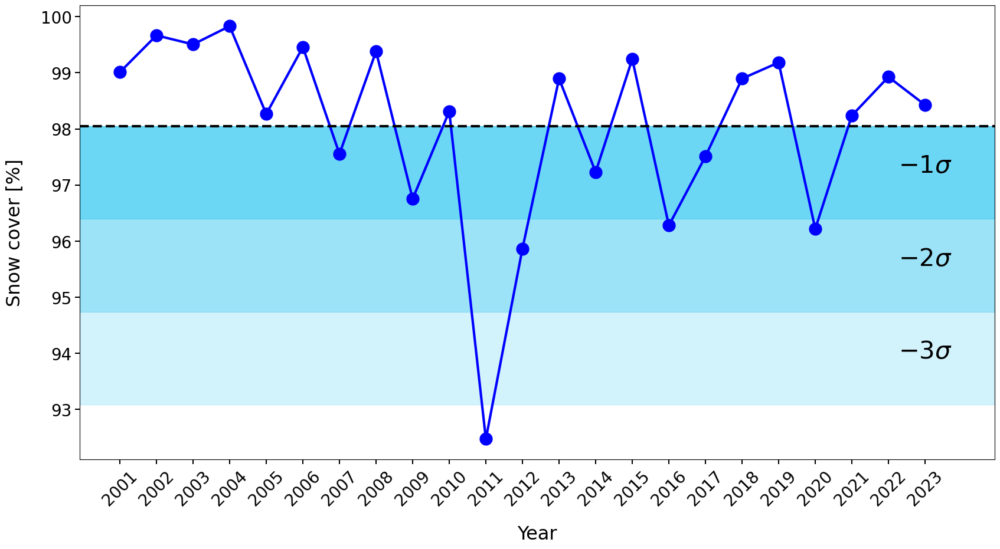

In [206]:
import matplotlib.dates as mdates
ax = plt.subplot(111)

snow.Mean.plot(ax=ax, figsize=(20, 10), marker='o', lw=3, ms=15, color='b')
ax.set_xlabel('Year', size=23, labelpad=20);
ax.set_ylabel('Snow cover [%]', size=23, labelpad=20);

confidence = [[r"$-1\sigma$", 1, 0.4],
             [r"$-2\sigma$", 2, 0.3],
             [r"$-3\sigma$", 3, 0.2]]
xlim = np.arange(ax.get_xlim()[0], 2025)
ax.plot(xlim, np.repeat(np.mean(snow.Mean), len(xlim)), color='k', lw=3, linestyle='--', label='Mean')
for l, val, t in confidence:
    lower = np.mean(snow.Mean) - val*np.std(snow.Mean)
    upper = np.mean(snow.Mean) + val*np.std(snow.Mean)
    ax.fill_between(xlim, lower, np.mean(snow.Mean), alpha=t, color='#23c3f1', label=l)
    ax.text(2023, np.mean(snow.Mean) - (val-0.5)*np.std(snow.Mean), l, fontsize=30, ha='center')

ax.set_xlim(xlim[0], xlim[-1])
# Adjust x-axis labels
# plt.xticks(ticks=bin_centers[::2], labels=center_labels[::2], rotation=45)  # Show every other label
ax.set_xticks(ticks=range(2001, 2024), labels=range(2001, 2024), rotation=45);
# ax.get_legend().remove()
ax.tick_params(labelsize = 20, size=6, width=1.5)
# ax.xaxis.set_major_locator(mdates.YearLocator())  # Yearly ticks
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format as year
# plt.gca().get_xticks()
plt.savefig(f'{local_path}/Plots/Snow-Cover_April.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 6) QFED

In [51]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
coef = {'co': 28, 'co2': 44, 'ch4': 16, 'bc': 12}
with rio.open(ref) as src:
    profile = src.profile
for year in range(2001, 2024):
    print(f'####### {year}')
    for month in range(1, 13):
        for l, c in coef.items():
            if month < 12:
                dates = pd.date_range(f'{year}{month:02}01', f'{year}{month+1:02}01')[:-1]
            else:
                dates = pd.date_range(f'{year}{month:02}01', f'{year+1}0101')[:-1]
            try:
                nc = netCDF4.Dataset(f"{local_path}/Data/QFED/qfed2.emis_{l}.061.x3600_y1800.{year}{month:02}mm.nc4")
                if (month == 1) and (l == 'co'):
                    i = 1
                    arr = nc.variables['biomass'][:, ::-1] * 3600 * 24 * 1e3 * len(dates) * 12 / c
                    lathandle = nc.variables['lat']
                    lonhandle = nc.variables['lon']
                    lats = np.round(lathandle[::-1], 2)
                    lons = np.round(lonhandle[:], 2)
                    xres = np.round(lons[1] - lons[0], 1)
                    yres = np.round(lats[1] - lats[0], 1)
                    xmin, ymin, xmax, ymax = 63, 58, 180, 74
                    try:
                        index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
                    except:
                        if xmax == 180:
                            index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], lons.shape[0])
                    index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
                    arr = arr[:, index_lat, index_lon]
                else:
                    new = nc.variables['biomass'][:, ::-1] * 3600 * 24 * 1e3 * len(dates) * 12 / c
                    arr += new[:, index_lat, index_lon]
                    i += 1
                print(f'**** {i}: {l} | {year}{month:02}')
            except:
                print(f"---- Check   qfed2.emis_{l}.061.x3600_y1800.{year}{month:02}mm.nc4")
        
            
    layers = {'ALL': arr
             } 
    gt = profile['transform']
    profile['transform'] = rio.Affine(xres, gt[1], gt[2], gt[3], yres, gt[5])
    profile['width'] = index_lon.stop - index_lon.start
    profile['height'] = index_lat.stop - index_lat.start
    # print(profile)
    area = Global_Functions.get_pixel_area(profile, path=False, profile=True)
    for l, arr in layers.items():
        print(f'*** {l}')
        c_mean = np.nansum(arr, 0) 
        c_sum = c_mean * area * 1e-6
 
        Global_Functions.write_rasterio(c_sum, 
                                        f"{local_path}/PeatFire/Summaries/QFEDv26_{l}-C_SUM_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)
        Global_Functions.write_rasterio(c_mean, 
                                        f"{local_path}/PeatFire/Summaries/QFEDv26_{l}-C_MEAN_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)

####### 2001
**** 1: co | 200101
**** 2: co2 | 200101
**** 3: ch4 | 200101
**** 4: bc | 200101
**** 5: co | 200102
**** 6: co2 | 200102
**** 7: ch4 | 200102
**** 8: bc | 200102
**** 9: co | 200103
**** 10: co2 | 200103
**** 11: ch4 | 200103
**** 12: bc | 200103
**** 13: co | 200104
**** 14: co2 | 200104
**** 15: ch4 | 200104
**** 16: bc | 200104
**** 17: co | 200105
**** 18: co2 | 200105
**** 19: ch4 | 200105
**** 20: bc | 200105
**** 21: co | 200106
**** 22: co2 | 200106
**** 23: ch4 | 200106
**** 24: bc | 200106
**** 25: co | 200107
**** 26: co2 | 200107
**** 27: ch4 | 200107
**** 28: bc | 200107
**** 29: co | 200108
**** 30: co2 | 200108
**** 31: ch4 | 200108
**** 32: bc | 200108
**** 33: co | 200109
**** 34: co2 | 200109
**** 35: ch4 | 200109
**** 36: bc | 200109
**** 37: co | 200110
**** 38: co2 | 200110
**** 39: ch4 | 200110
**** 40: bc | 200110
**** 41: co | 200111
**** 42: co2 | 200111
**** 43: ch4 | 200111
**** 44: bc | 200111
**** 45: co | 200112
**** 46: co2 | 200112
**** 47

### 7) FINN

In [130]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
ref = f"{local_path}/PeatFire/Summaries/BA_Area_025D_2021.tif"
coef = {'CO': 28, 'CO2': 44, 'CH4': 16, 'BC': 12}
avogadro_number = 6.022e23
with rio.open(ref) as src:
    profile = src.profile
for year in range(2003, 2024):
    print(f'####### {year}')
    for l, c in coef.items():
        # try:
        nc = netCDF4.Dataset(f"{local_path}/Data/FINN/emissions-finnv2.5mod_{l}_bb_surface_daily_{year}0101-{year}1231_0.1x0.1.nc")
        if (l == 'CO'):
            i = 1
            arr = nc.variables[f'fire_modis_{l}'][:].sum(0) 
            arr = np.column_stack([arr[::-1, 1800:], arr[::-1, :1800]]) * 3600 * 24 * 1e4 * 12 * 1 / avogadro_number
            arr = np.insert(arr, arr.shape[0], 0, axis=0)
            print(arr.max())
            lathandle = nc.variables['lat'][:]
            lonhandle = nc.variables['lon'][:] - 180
            lats = np.round(lathandle[:], 2)
            lats = np.append(lats, 89.95)
            lats = np.sort(np.round(lats, 2))[::-1]
            lons = np.round(lonhandle[:], 2)
            xres = np.round(lons[1] - lons[0], 1)
            yres = np.round(lats[1] - lats[0], 1)
            xmin, ymin, xmax, ymax = 63, 58, 180, 74
            try:
                index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], np.argwhere(lons==xmax+(xres/2))[0, 0])
            except:
                if xmax == 180:
                    index_lon = slice(np.argwhere(lons==xmin+(xres/2))[0, 0], lons.shape[0])
            index_lat = slice(np.argwhere(lats==ymax+(yres/2))[0, 0], np.argwhere(lats==ymin+(yres/2))[0, 0])
        else:
            new = nc.variables[f'fire_modis_{l}'][:].sum(0) 
            new = np.column_stack([new[::-1, 1800:], new[::-1, :1800]]) * 3600 * 24 * 1e4 * 12 * 1 / avogadro_number
            new = np.insert(new, new.shape[0], 0, axis=0)
            arr += new
            i += 1
        print(f'**** {i}: {l} | {year}, {arr.shape}, {arr.max()}')
        # except:
        #     print(f"---- Check   emissions-finnv2.5mod_{l}_bb_surface_daily_{year}0101-{year}1231")
        
    layers = {'ALL': arr
             } 
    gt = profile['transform']
    profile['transform'] = rio.Affine(xres, gt[1], gt[2], gt[3], yres, gt[5])
    profile['width'] = index_lon.stop - index_lon.start
    profile['height'] = index_lat.stop - index_lat.start
    # print(profile)
    area = Global_Functions.get_pixel_area(profile, path=False, profile=True)
    for l, arr in layers.items():
        print(f'*** {l}')
        c_mean = arr[index_lat, index_lon]
        c_sum = c_mean * area * 1e-6
 
        Global_Functions.write_rasterio(c_sum, 
                                        f"{local_path}/PeatFire/Summaries/FINN_{l}-C_SUM_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)
        Global_Functions.write_rasterio(c_mean, 
                                        f"{local_path}/PeatFire/Summaries/FINN_{l}-C_MEAN_01D_{year}.tif",
                                       profile=profile, nodata=arr.fill_value)

####### 2003
924.309
**** 1: CO | 2003, (1800, 3600), 924.3090209960938
**** 2: CO2 | 2003, (1800, 3600), 11558.486328125
**** 3: CH4 | 2003, (1800, 3600), 11645.7177734375
**** 4: BC | 2003, (1800, 3600), 11658.2666015625
*** ALL
####### 2004
1335.5225
**** 1: CO | 2004, (1800, 3600), 1335.5224609375
**** 2: CO2 | 2004, (1800, 3600), 16364.56640625
**** 3: CH4 | 2004, (1800, 3600), 16492.677734375
**** 4: BC | 2004, (1800, 3600), 16510.193359375
*** ALL
####### 2005
779.3968
**** 1: CO | 2005, (1800, 3600), 779.3967895507812
**** 2: CO2 | 2005, (1800, 3600), 9715.1552734375
**** 3: CH4 | 2005, (1800, 3600), 9783.130859375
**** 4: BC | 2005, (1800, 3600), 9797.609375
*** ALL
####### 2006
1191.925
**** 1: CO | 2006, (1800, 3600), 1191.925048828125
**** 2: CO2 | 2006, (1800, 3600), 14698.1572265625
**** 3: CH4 | 2006, (1800, 3600), 14812.1435546875
**** 4: BC | 2006, (1800, 3600), 14828.41796875
*** ALL
####### 2007
724.2172
**** 1: CO | 2007, (1800, 3600), 724.2172241210938
**** 2: CO2 

## Trend Graphs

### 1) Trends of emissions and BA

In [14]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
# local_path = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/Landsat_BA/Siberia'
Years = list(range(2001, 2024, 1))
data = np.full((len(Years), 16), np.nan)
for i, year in enumerate(Years):
    print(f'**** {year}')
    Peat_Area = rio.open(f'{local_path}/PeatFire/Summaries/PeatMap_Area_025D_{year}.tif').read(1).sum() * 1e-10   ## Mha
    data[i, 0] = rio.open(f'{local_path}/PeatFire/Summaries/BA_Area_025D_{year}.tif').read(1).sum() * 1e-10
    data[i, 1] = rio.open(f'{local_path}/PeatFire/Summaries/PeatFire_Area_025D_{year}.tif').read(1).sum() * 1e-10
    data[i, 2] = data[i, 1] / Peat_Area * 100
    data[i, 3] = data[i, 1] / data[i, 0] * 100
    data[i, 4] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BGCC-MgC_SUM_025D_ALL_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C
    data[i, 5] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BGCC-MgC_SUM_025D_PEAT_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C
    data[i, 6] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/AGCC-MgC_SUM_025D_ALL_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C
    data[i, 7] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/AGCC-MgC_SUM_025D_PEAT_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C
    data[i, 8] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BurnDepth_MEAN_025D_ALL_{year}.tif').read(1), 
                                     -9999).mean()
    data[i, 9] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BurnDepth_MEAN_025D_PEAT_{year}.tif').read(1), 
                                     -9999).mean()
    try:
        data[i, 10] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED500_ALL-BA_025D_{year}.tif').read(1), 
                                         -9999).sum() * 1e-10
        data[i, 11] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED500_ALL-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFED500 is not available')
    try:
        data[i, 12] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED4s_ALL-BA_025D_{year}.tif').read(1), 
                                         -9999).sum() * 1e-10
        data[i, 13] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED4s_ALL-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFED4s is not available')
    try:
        data[i, 14] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED5_ALL-BA_025D_{year}.tif').read(1), 
                                         -9999).sum() * 1e-10
        data[i, 15] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED5_ALL-C_SUM_025D_{year}.tif').read(1), 
                                         -9999).sum() * 1e-10
    except:
        print('GFED5 Beta is not available')

timeseries = pd.DataFrame(data, columns=['BA_Area', 'PeatFire_Area', 
                                         'PeatBurned_Fraction', 'PeatFire_Fraction',
                                         'BGCC_Sum_All', 'BGCC_Sum_PeatFires',
                                         'AGCC_Sum_All', 'AGCC_Sum_PeatFires',
                                         'Depth_All', 'Depth_Peat',
                                         'GFED500_BA', 'GFED500_Emissions',
                                         'GFED4s_BA', 'GFED4s_Emissions',
                                         'GFED5_BA', 'GFED5_Emissions'
                                        ], index=Years)

timeseries['Emissions_Sum_All'] = timeseries['BGCC_Sum_All'] + timeseries['AGCC_Sum_All']
timeseries['Emissions_Sum_PeatFires'] = timeseries['BGCC_Sum_PeatFires'] + timeseries['AGCC_Sum_PeatFires']
timeseries['BGCC_Average_All'] = timeseries['BGCC_Sum_All'] / timeseries['BA_Area'] * 1e2
timeseries['BGCC_Average_PeatFires'] = timeseries['BGCC_Sum_PeatFires'] / timeseries['PeatFire_Area'] * 1e2
timeseries['AGCC_Average_All'] = timeseries['AGCC_Sum_All'] / timeseries['BA_Area'] * 1e2
timeseries['AGCC_Average_PeatFires'] = timeseries['AGCC_Sum_PeatFires'] / timeseries['PeatFire_Area'] * 1e2
timeseries['Emissions_Average_All'] = timeseries['Emissions_Sum_All'] / timeseries['BA_Area'] * 1e2
timeseries['Emissions_Average_PeatFires'] = timeseries['Emissions_Sum_PeatFires'] / timeseries['PeatFire_Area'] * 1e2
timeseries['GFED500_Emissions_Average'] = timeseries['GFED500_Emissions'] / timeseries['GFED500_BA'] * 1e2
timeseries['GFED4s_Emissions_Average'] = timeseries['GFED4s_Emissions'] / timeseries['GFED4s_BA'] * 1e2
timeseries['GFED5_Emissions_Average'] = timeseries['GFED5_Emissions'] / timeseries['GFED5_BA'] * 1e2
timeseries

**** 2001
GFED500 is not available
GFED5 Beta is not available
**** 2002
**** 2003
**** 2004
**** 2005
**** 2006
**** 2007
**** 2008
**** 2009
**** 2010
**** 2011
**** 2012
**** 2013
**** 2014
**** 2015
**** 2016
**** 2017
GFED4s is not available
**** 2018
GFED4s is not available
**** 2019
GFED4s is not available
**** 2020
GFED4s is not available
**** 2021
GFED4s is not available
GFED5 Beta is not available
**** 2022
GFED4s is not available
GFED5 Beta is not available
**** 2023
GFED500 is not available
GFED4s is not available
GFED5 Beta is not available


,BA_Area,PeatFire_Area,PeatBurned_Fraction,PeatFire_Fraction,BGCC_Sum_All,BGCC_Sum_PeatFires,AGCC_Sum_All,AGCC_Sum_PeatFires,Depth_All,Depth_Peat,...,Emissions_Sum_PeatFires,BGCC_Average_All,BGCC_Average_PeatFires,AGCC_Average_All,AGCC_Average_PeatFires,Emissions_Average_All,Emissions_Average_PeatFires,GFED500_Emissions_Average,GFED4s_Emissions_Average,GFED5_Emissions_Average
2001,4.865083,1.931883,0.806284,39.709154,143.107360,57.263304,16.643802,6.059381,9.055343,9.077156,...,63.322685,2941.519405,2964.118151,342.107258,313.651526,3283.626663,3277.769677,NaN,1875.445371,NaN
2002,6.916036,2.308255,0.963365,33.375406,211.016128,71.050400,27.944340,8.800434,9.453935,9.441166,...,79.850834,3051.113701,3078.099950,404.051384,381.259155,3455.165085,3459.359105,2998.317410,2257.335042,0.113726
2003,6.329011,2.065507,0.862053,32.635544,192.322880,63.990080,28.058132,8.368934,9.494292,9.489034,...,72.359014,3038.750726,3098.032098,443.325667,405.175711,3482.076392,3503.207809,3244.259165,1457.752714,0.124117
2004,1.408848,0.557351,0.232614,39.560737,40.359400,16.474477,6.349823,2.407882,9.155354,9.105884,...,18.882359,2864.709583,2955.855230,450.710338,432.022856,3315.419921,3387.878086,1659.814178,1320.882170,0.132639
2005,3.283144,1.328377,0.554407,40.460512,93.493440,38.196736,16.235061,6.369442,9.166097,9.165622,...,44.566178,2847.680250,2875.444308,494.497395,479.490634,3342.177646,3354.934942,3035.940207,1512.277483,0.164293
2006,3.970615,1.009215,0.421202,25.417095,117.493584,30.159232,17.493276,4.310745,8.902607,8.871381,...,34.469977,2959.077504,2988.384998,440.568393,427.138436,3399.645897,3415.523434,4110.328648,2449.900353,0.254779
2007,1.117684,0.414342,0.172928,37.071522,32.289100,12.425227,5.347784,1.835129,9.292319,9.293051,...,14.260357,2888.929730,2998.782408,478.470202,442.901692,3367.399931,3441.684100,2772.540494,1396.155495,0.160442
2008,2.637241,0.558160,0.232952,21.164563,78.828536,16.754536,15.059043,3.041395,9.139020,9.091712,...,19.795931,2989.053487,3001.741687,571.015108,544.896239,3560.068595,3546.637926,3135.736426,1475.049861,0.165901
2009,3.916118,1.144473,0.477653,29.224678,117.561456,34.591672,18.116348,5.016860,9.158307,9.116390,...,39.608532,3001.989297,3022.497904,462.609810,438.355519,3464.599107,3460.853423,3098.131417,1695.767069,0.144477
2010,3.820003,1.274554,0.531943,33.365258,116.137760,39.075596,14.139278,4.319963,9.529950,9.520625,...,43.395559,3040.252849,3065.825165,370.137845,338.939201,3410.390694,3404.764366,3331.937408,1589.325236,0.116020


### 2) Emission and depth

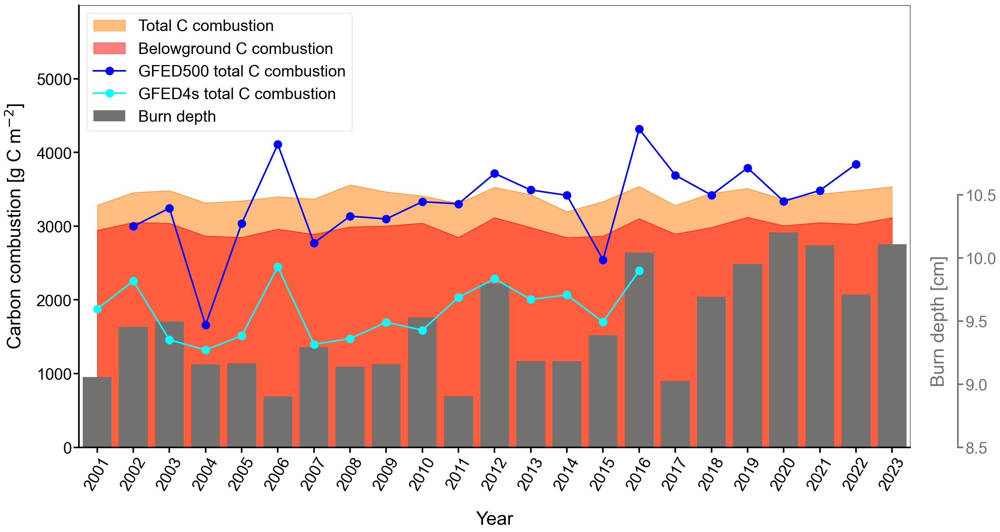

In [33]:
# Create the figure and primary axis
fig, ax = plt.subplots(1, 1, figsize=(28, 15))

timeseries[['Emissions_Average_All', 'BGCC_Average_All']].plot.area(stacked=False, ax=ax, color=['#ff7f00', 'red'])
ax1 = ax.twinx()
timeseries[['GFED500_Emissions_Average', 'GFED4s_Emissions_Average']].plot.line(fontsize=20, marker='o', ax=ax1, lw=3, ms=15, color=['blue', 'cyan'])
ax2 = ax.twinx()
ax2.bar(timeseries.index, timeseries['Depth_All'], color='#737170', alpha=1, edgecolor='none', label='Burning depth')

# Customize the primary axis (ax)
ax.set_xlabel('Year', size=35, labelpad=35)
ax.set_ylabel('Carbon combustion [g C m$^{-2}$]', size=35, labelpad=20, color='black')
ax.set_xticks(timeseries.index)
ax.tick_params(labelsize=30, size=10, width=3)
ax.set_xticklabels(timeseries.index, rotation=60)
ax.set_ylim(0, 5999)
ax.set_xlim(2000.5, 2023.5)
ax1.set_ylim(0, 5999)
ax1.set_xlim(2000.5, 2023.5)
ax1.tick_params(axis='y', colors='none')
ax1.legend_.remove()

ax2.tick_params(axis='y', colors='none')
ax2.set_ylim(8.5, 12)
# Create the second secondary y-axis (ax3) linked to ax2
ax3 = ax2.twinx()  # Create ax3 as a twin of ax2
ax3.set_ylim(ax2.get_ylim())  # Synchronize the y-axis limits with ax2
ax3.set_yticks(np.arange(8.5, 11, 0.5))
# ax3.set_ylabel('Burning depth [cm]', size=35, labelpad=25, color='black')  # Add label
ax3.tick_params(axis='y', labelsize=30, size=10, width=3, colors='#737170')  # Customize ticks
ax3.spines['right'].set_position(('outward', 90))  # Move ax3 to the right
ax3.spines['right'].set_bounds(ax2.get_ylim()[0], 10.5)
ax3.spines['right'].set_color('#737170')
ax3.spines['right'].set_linewidth(3)
ax3_title_y = (ax3.get_yticks()[0] + ax3.get_yticks()[-1]) / 2  # Midpoint between lower bound and cropped spine at 11
ax3.text(1.035, ax3_title_y, 'Burn depth [cm]', fontsize=35, color='#737170', rotation=90,
         va='center', ha='center', transform=ax3.get_yaxis_transform())
ax3.spines[['bottom', 'left']].set_linewidth(3)
# Set z-order to ensure the primary axis is on top
ax1.set_zorder(ax2.get_zorder() + 1)
ax.set_frame_on(False)

# Add legends
handles, labels = [], []
for a in fig.get_axes():
    [handles.append(i) for i in a.get_legend_handles_labels()[0]]
    [labels.append(i) for i in a.get_legend_handles_labels()[1]]
labels = ['Total C combustion', 'Belowground C combustion', 
          'GFED500 total C combustion', 'GFED4s total C combustion', 'Burn depth']
ax.legend(handles, labels, fontsize=30, loc="upper left")

plt.savefig(f'{local_path}/Plots/Emissions_Depth_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

In [333]:
import pymannkendall as mk
# np.apply_along_axis(lambda x: (mk.original_test(x).p, mk.original_test(x).slope*1e-4), 0, timeseries)

In [335]:
timeseries[['Emissions_Average_All', 'BGCC_Average_All', 'Depth_All', 'GFED500_Emissions_Average']].apply(
    lambda x: (mk.original_test(x).p, mk.original_test(x).slope)
)

,Emissions_Average_All,BGCC_Average_All,Depth_All,GFED500_Emissions_Average
0,0.267327,0.113051,0.002187,0.005997
1,4.167789,4.471176,0.039562,40.316541


### 2) Only BA 

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# timeseries.iloc[:, :2].plot.bar(figsize=(30, 15), fontsize=20, 
#                 # marker="o", lw=4, ms=10,
#                                 grid=True, ax=ax,
#                                )

ax.bar(timeseries.index, timeseries.iloc[:, 0], width=0.7, color='firebrick', edgecolor='firebrick', label='Total burned area')
ax.bar(timeseries.index, timeseries.iloc[:, 1], width=0.5, color='b', edgecolor='b', label='Peat fires area')
ax.set_ylabel('Burned area [Mha]', size=30, labelpad=20);
ax.set_xlabel('Year', size=30, labelpad=20);
timeseries.iloc[:, 3].plot.line(fontsize=25, 
                ax=ax, lw=4, ms=10, secondary_y=True, color='b',
                               marker="o",
                               linestyle="-",
                               )

ax.right_ax.tick_params('y', colors='mediumblue')
ax.right_ax.set_ylabel('Fraction of peat fires [%]', size=30, labelpad=25, color='mediumblue');
ax.set_xticks(timeseries.index);
ax.tick_params(labelsize = 25, size=10, width=3)
ax.right_ax.tick_params(labelsize = 25, size=10, width=3)
ax.set_xticklabels(timeseries.index, rotation=45);
ax.spines[['bottom', 'left', 'right']].set_linewidth(3)
ax.spines[['right']].set_color('b')
ax.set_ylim(0)
ax.right_ax.set_ylim(0, 55)
# ax.set_xticklabels(timeseries.index.strftime('%Y'), rotation=45, ha='right')
ax.right_ax.set_ylim(0)
lines, labels = [], []
for a in fig.get_axes():
    [lines.append(i) for i in a.get_legend_handles_labels()[0]]
    [labels.append(i) for i in a.get_legend_handles_labels()[1]]
labels = ['Total burned area', 'Peat fires area', '% of peat fires']
ax.legend(lines, labels, fontsize=27, loc="upper left")
# ax.grid(axis="both")
# # Ensure grid is in the background
# ax.set_axisbelow(True)
plt.savefig(f'{local_path}/Plots/PeatFire_Siberia_Barplot_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

In [261]:
timeseries['PeatFire_Area'] / timeseries['BA_Area']

2001    0.397092
2002    0.333754
2003    0.326355
2004    0.395607
2005    0.404605
2006    0.254171
2007    0.370715
2008    0.211646
2009    0.292247
2010    0.333653
2011    0.256672
2012    0.327989
2013    0.324364
2014    0.275967
2015    0.280164
2016    0.259958
2017    0.338869
2018    0.391987
2019    0.365275
2020    0.436510
2021    0.362542
2022    0.281755
2023    0.359332
dtype: float64

### 3) BA with CWD

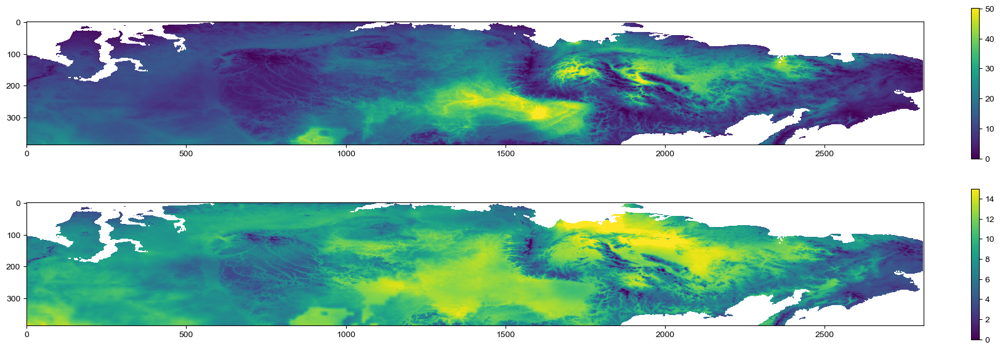

In [5]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
fig, axes = plt.subplots(2, 1, figsize=(20, 7))
cwd_average = rio.open(f"{local_path}/PeatFire/BG_CC/data/TerraClimate_LongTermMean_Siberia.tif").read(6) * 0.1
cwd_std = rio.open(f"{local_path}/PeatFire/BG_CC/data/TerraClimate_LongTermSTD_Siberia.tif").read(6) * 0.1
c = axes[0].imshow(cwd_average, vmax=50.3)
plt.colorbar(c, fraction=0.01)
c = axes[1].imshow(cwd_std, vmax=15)
plt.colorbar(c, fraction=0.01)

In [6]:
cwd_average = np.nanmean(cwd_average)
cwd_std = np.nanmean(cwd_std)

In [11]:
agg_df = pd.read_csv('/media/amin/DISK6T/PhD/Landsat_BA/Siberia/PeatFire/Submission/Data_Path_Analysis.csv')
agg_df

,Zone,Year,Tmax,Tmax_Anomaly,Tmin,Tmin_Anomaly,VPD,VPD_Anomaly,Radiation,Radiation_Anomaly,...,FFMC_Anomaly,DC,DC_Anomaly,LST_Anomaly,LST_Persistence,LST,BA,PeatFire,PeatFraction,BGCC
0,West,2001,15.460921,0.717237,7.721429,1.314844,0.427337,-0.111357,161.577046,-0.623416,...,0.137377,212.93121,-0.409492,-0.242408,0.298185,5.663478,0.068770,0.030328,52.059692,2973.621338
1,West,2002,13.939023,-0.529959,6.695208,0.372270,0.393497,-0.666226,157.178667,-1.073149,...,-0.851254,188.48373,-0.791529,-0.942335,0.184730,4.586659,0.095347,0.037319,46.956143,2972.577212
2,West,2003,16.385411,1.474856,7.811785,1.397835,0.494982,0.997788,175.004411,0.749530,...,0.569700,281.40585,0.660549,0.157769,0.355035,6.131234,0.530817,0.282051,60.947063,3344.284400
3,West,2004,14.755966,0.139526,6.615253,0.298833,0.444012,0.162049,169.625016,0.199488,...,0.227941,278.88507,0.621158,-0.572498,0.205657,5.142255,1.023064,0.457433,52.677414,2995.093350
4,West,2005,15.962402,1.128201,7.694738,1.290328,0.460492,0.432277,171.102808,0.350592,...,0.411397,253.28954,0.221180,0.312786,0.320598,6.352209,1.210485,0.499349,49.148890,3053.135544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,All,2019,16.228734,1.634989,6.057314,1.773032,0.521774,1.098375,179.386531,0.673467,...,0.682298,355.40048,0.534650,0.424944,0.372824,5.497944,7.433626,2.718919,62.916199,3090.126847
88,All,2020,16.544927,1.917330,6.523327,2.215995,0.617640,2.733249,177.938304,0.523689,...,1.070675,361.36258,0.612719,0.958453,0.489684,6.209343,9.287784,4.057666,69.534954,2991.915004
89,All,2021,15.752463,1.209705,5.730877,1.462743,0.503183,0.781346,173.472267,0.061805,...,0.692149,360.62410,0.603049,0.108199,0.332477,5.001931,10.574772,3.836113,62.613572,3043.505631
90,All,2022,15.345247,0.846085,5.357078,1.107433,0.474494,0.292087,171.179045,-0.175363,...,0.107360,318.25452,0.048250,0.267626,0.329481,5.245822,1.707494,0.483232,53.730011,3027.396954


In [183]:
agg_df.loc[agg_df.Zone == 'All'][['Year', 'CWD']].set_index('Year')

,CWD
Year,
2001,19.864073
2002,13.752000
2003,19.609321
2004,11.972696
2005,14.993319
2006,15.949100
2007,11.424109
2008,12.601323
2009,17.255635


/tmp/ipykernel_1616492/435727459.py:46: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(ax2.get_yticklabels(), color='b');


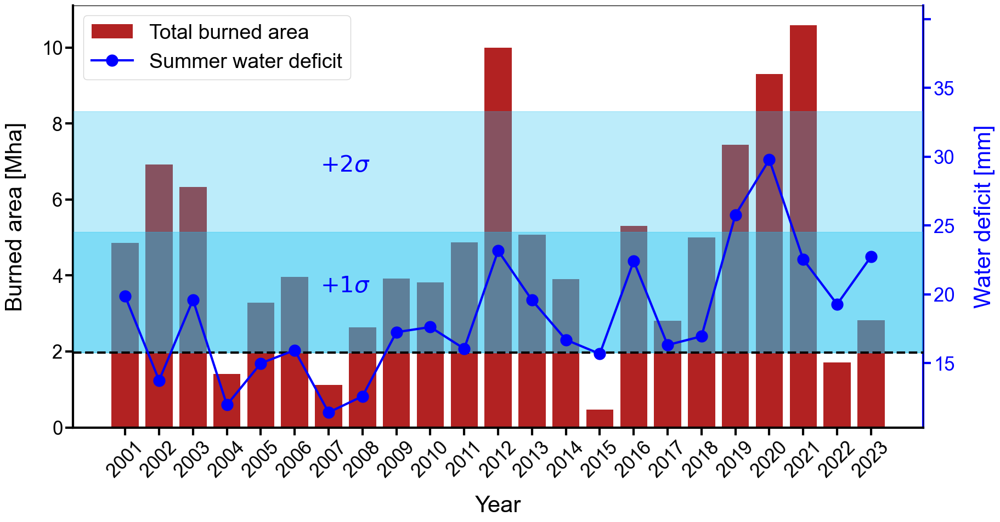

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

ax.bar(timeseries.index, timeseries['BA_Area'], 
                lw=2, label='Total burned area', width=0.8,
               # edgecolor='black', 
       color='firebrick',
       zorder=2
                )
# ax.bar(timeseries.index, timeseries['PeatFire_Area'], 
#                 lw=1, label='Peat fires', 
# #                hatch='x', color='none', width=0.8,
#                width=0.6,
#                edgecolor='black'#, color='#ff7f00'
#                 )
ax.set_ylabel('Burned area [Mha]', size=30, labelpad=20);
ax.set_xlabel('Year', size=30, labelpad=20);
ax2 = ax.twinx()
cwd = agg_df.loc[agg_df.Zone == 'All'][['Year', 'CWD']].set_index('Year')
cwd.plot.line(fontsize=20, 
                marker='o', ax=ax2, lw=3, ms=15, 
              # secondary_y=True, 
              color=['b'],
              zorder=5
             )
confidence = [[r"$+1\sigma$", 1, 0.4],
             [r"$+2\sigma$", 2, 0.3],
             # [r"$+3\sigma$", 3, 0.2]
             ]
xlim = ax.get_xlim()
## we are NOT using just the 23 years average and std but the long term stats 
# cwd_average = np.mean(cwd.values)
# cwd_std = np.std(cwd.values)
ax2.plot(np.arange(xlim[0], xlim[1]+0.1, 0.1), np.repeat(cwd_average, np.arange(xlim[0], xlim[1]+0.1, 0.1).shape[0]), color='k', lw=3, linestyle='--', label='Mean')
for l, val, t in confidence:
    lower = cwd_average - val*cwd_std
    upper = cwd_average + val*cwd_std
    ax2.fill_between(np.arange(xlim[0], xlim[1]+0.1, 0.1), cwd_average, upper, alpha=t, color='#23c3f1', label=l, zorder=1)
    ax2.text(2007.5, cwd_average + (val-0.5)*cwd_std, l, fontsize=30, ha='center', color='blue')
    
# ax.right_ax.tick_params('y', colors='black')
ax2.set_ylabel('Water deficit [mm]', size=30, labelpad=25, color='b');
ax.set_xticks(timeseries.index);
ax.tick_params(labelsize = 25, size=10, width=3)
ax2.tick_params(labelsize = 25, size=10, width=3, color='b')
ax.set_xticklabels(timeseries.index, rotation=45, fontsize=25);
ax2.set_yticklabels(ax2.get_yticklabels(), color='b');
ax2.set_ylim(None, 41)
ax2.set_xlim(xlim)
lines, labels = [], []
for a in fig.get_axes():
    [lines.append(i) for i in a.get_legend_handles_labels()[0]]
    [labels.append(i) for i in a.get_legend_handles_labels()[1]]
labels = ['Total burned area', 'Summer water deficit']
ax.legend(lines, labels, fontsize=27, loc="upper left")
ax2.get_legend().remove()
ax.spines[['bottom', 'left', 'right']].set_linewidth(3)
ax.spines[['right']].set_color('b')
# ax.set_zorder(ax2.get_zorder() + 1)
plt.savefig(f'{local_path}/Plots/BA_Siberia_Barplot_CWD_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 3) Comparison of BA with other products

In [17]:
ts = pd.read_csv(f'{local_path}/../Comparisons/Siberia_Intercomparison_2001-2023.csv', index_col='Unnamed: 0') * 1e-10
ts.drop(columns=['GFED4s', 'FireCCIS311', 'C3SBA11']).loc[2002:2022].mean()

FireCCISFDL    4.756427
FireCCI51      3.349989
MCD64A1        2.856616
GFED500        3.589483
dtype: float64

In [474]:
timeseries['GFED500_BA']

2001          NaN
2002     4.829696
2003     3.901349
2004     0.545879
2005     1.515822
2006     1.945521
2007     0.509252
2008     1.437901
2009     1.926747
2010     2.494575
2011     1.931108
2012     7.739847
2013     4.395495
2014     3.448135
2015     0.414228
2016     4.684317
2017     2.663025
2018     4.754299
2019     6.650157
2020     7.568607
2021    10.466176
2022     1.556998
2023          NaN
Name: GFED500_BA, dtype: float64

In [14]:
ts['GFED5'] = timeseries[['GFED5_BA']]
ts

,FireCCISFDL,C3SBA11,FireCCI51,MCD64A1,FireCCIS311,GFED4s,GFED500,GFED5
2001,4.865083,NaN,3.289290,2.945629,NaN,3.232503,NaN,NaN
2002,6.916036,NaN,4.679408,4.307737,NaN,4.466864,4.829696,7.553655
2003,6.329011,NaN,3.666472,3.526545,NaN,3.310743,3.901350,6.370076
2004,1.408848,NaN,0.763289,0.453157,NaN,0.384456,0.545879,1.842358
2005,3.283144,NaN,1.636107,1.155916,NaN,1.515105,1.515822,3.546523
2006,3.970615,NaN,1.932556,1.616254,NaN,1.782884,1.945520,3.841346
2007,1.117684,NaN,0.465444,0.446984,NaN,0.473058,0.509252,1.487274
2008,2.637241,NaN,1.237700,1.242881,NaN,1.692221,1.437901,2.705031
2009,3.916118,NaN,2.022004,1.573296,NaN,1.657652,1.926747,4.336288
2010,3.820003,NaN,2.578196,2.243235,NaN,2.244239,2.494575,4.073049


(2000.5, 2023.5)

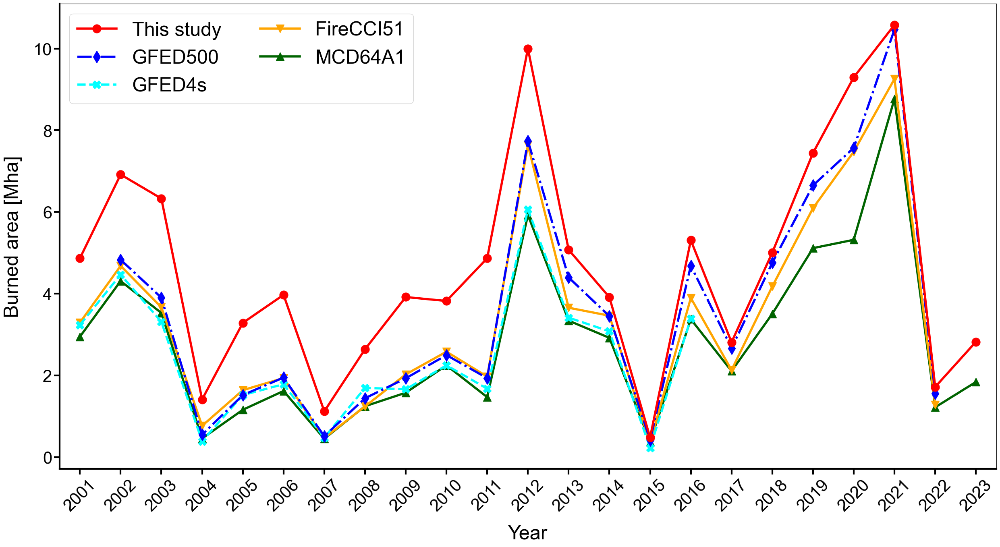

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(30, 15))
content = pd.DataFrame({'Layer': ['FireCCISFDL', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1'],
                       'Color': ['red', 'blue', 'cyan', 'orange', 'darkgreen'],
                       'Label': ['This study', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1'],
                       'Marker': ['o', 'd', 'X', 'v', '^'],
                       'MS': [15, 15, 15, 15, 15],
                       'LW': [4, 4, 4, 4, 4],
                        'Line': ['-', '-.', '--', '-', '-']
        })

for i, elements in content.iterrows():
    ts.loc[:, elements['Layer']].plot(ax=ax,
        color=elements['Color'], linestyle=elements['Line'],
        lw=elements['LW'], ms=elements['MS'], marker=elements['Marker']
    )
    # ax.bar(ts.index + i * 0.1-0.35, ts.loc[:, elements['Layer']], 0.1, 
    #        label=elements['Layer'], color=elements['Color'])
    # ax.plot(ts.index + i * 0.14-0.40, ts.loc[:, elements['Layer']], 
    #        label=elements['Layer'], color=elements['Color'],
    #        lw=0, ms=elements['MS'], marker=elements['Marker'])


ax.set_ylabel('Burned area [Mha]', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=20);
# ax.set_xticks(np.arange(2000, 2021, 5));
ax.set_xticks(ts.index);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(ax.get_xticks(), rotation=45);
# ax.set_ylim(None, 250)
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, content.Label, fontsize=35, loc="upper left", ncol=2, 
          # framealpha=1
         )

# for y in ts.index:
#     if y % 2 == 0:
#         ax.axvspan(y - 0.5, y + 0.5, color='grey', alpha=0.2)
#     else:
#         ax.axvspan(y - 0.5, y + 0.5, color='white', alpha=0.2)

for i, line in enumerate(lines, -len(lines)):
    line.set_zorder(abs(i))
# ax.set_ylim(None, 3.4)
ax.spines[['bottom', 'left']].set_linewidth(3)
ax.set_xlim(2000.5, 2023.5)
plt.savefig(f'{local_path}/Plots/BA_Intercomparison-LinePlot_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 4) Comparison with Descals

In [20]:
ts = pd.read_csv(f'{local_path}/../Comparisons/Siberia_Intercomparison_Arctic_2001-2023.csv', index_col='Unnamed: 0') * 1e-10

In [21]:
a = ts.drop(columns=['FireCCIS311', 'C3SBA11', 'FireCCISFDL']).values.transpose()
np.nanmean((ts.FireCCISFDL.values - a) / a * 100, axis=1)

array([43.18251738, 72.3942864 , 97.67929382, 48.95819962, 69.14945716])

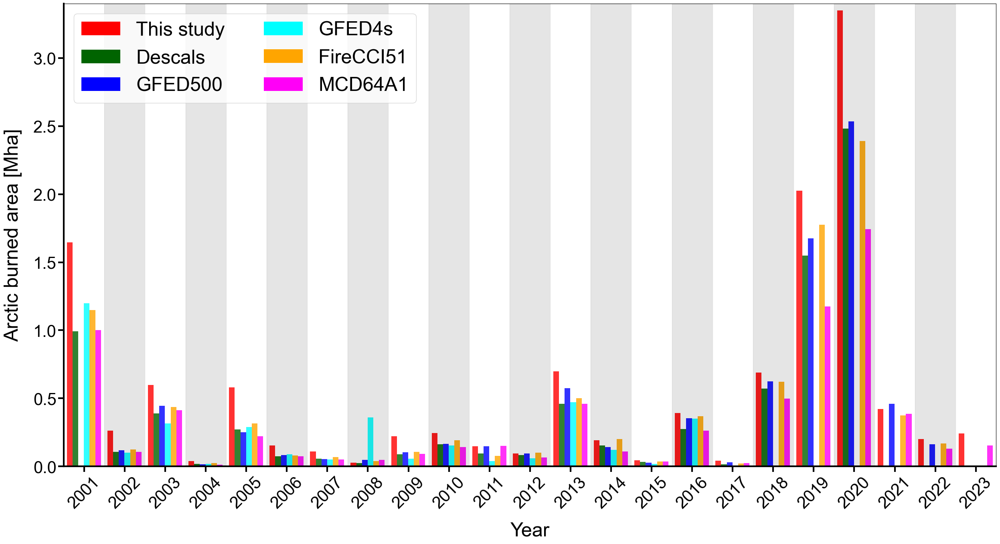

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(30, 15))
ts = pd.read_csv(f'{local_path}/../Comparisons/Siberia_Intercomparison_Arctic_2001-2023.csv', index_col='Unnamed: 0') * 1e-10
# content = pd.DataFrame({'Layer': ['FireCCISFDL', 'Descals', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1', 'FireCCIS311', 'C3SBA11'],
#                        'Color': ['red', '#50de3a', 'blue', 'cyan', 'orange', 'purple', 'darkgreen', '#ff00f7'],
#                        'Label': ['This study', 'Descals', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1', 'FireCCIS311', 'C3SBA11'],
#                        'Marker': ['o', 's', 'd', 'X', 'v', '^', '*', 'P'],
#                        'MS': [15, 10, 10, 10, 10, 10, 10, 10],
#                        'LW': [3, 2, 2, 2, 2, 2, 2, 2]
#         })
content = pd.DataFrame({'Layer': ['FireCCISFDL', 'Descals', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1'],
                       'Color': ['red', 'darkgreen', 'blue', 'cyan', 'orange', '#ff00f7'],
                       'Label': ['This study', 'Descals', 'GFED500', 'GFED4s', 'FireCCI51', 'MCD64A1'],
                       'Marker': ['o', '*', 'd', 'X', 'v', '^'],
                       'MS': [15, 15, 15, 15, 15, 15],
                       'LW': [4, 4, 4, 4, 4, 4],
                        'Line': ['-', ':', '-.', '--', '-', '-']
        })

for i, elements in content.iterrows():
    # ts.loc[:, elements['Layer']].plot(ax=ax,
    #     color=elements['Color'],
    #     lw=elements['LW'], ms=elements['MS'], marker=elements['Marker']
    # )
    ax.bar(ts.index + i * 0.14-0.355, ts.loc[:, elements['Layer']], 0.14, 
           label=elements['Label'], color=elements['Color'])
    # ax.plot(ts.index + i * 0.123-0.43, ts.loc[:, elements['Layer']],  
    #        label=elements['Layer'], color=elements['Color'],
    #        lw=0, ms=elements['MS'], marker=elements['Marker']
    #        )


ax.set_ylabel('Arctic burned area [Mha]', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=20);
# ax.set_xticks(np.arange(2000, 2021, 5));
ax.set_xticks(ts.index);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(ax.get_xticks(), rotation=45);
# ax.set_ylim(None, 250)
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, fontsize=35, loc="upper left", ncol=2, 
          # framealpha=1
         )

for y in ts.index:
    if y % 2 == 0:
        ax.axvspan(y - 0.5, y + 0.5, color='grey', alpha=0.2)
    else:
        ax.axvspan(y - 0.5, y + 0.5, color='white', alpha=0.2)

# for i, line in enumerate(lines, -len(lines)):
#     line.set_zorder(abs(i))
ax.set_ylim(None, 3.4)
ax.set_xlim(2000.5, 2023.5)
ax.spines[['bottom', 'left']].set_linewidth(3)

plt.savefig(f'{local_path}/Plots/BA_Intercomparison-BarPlot_Arctic_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

In [23]:
ts.drop(columns=['GFED4s', 'FireCCIS311', 'C3SBA11']).loc[2002:2022].mean()

FireCCISFDL    0.501736
FireCCI51      0.381947
MCD64A1        0.295080
GFED500        0.385972
Descals        0.363679
dtype: float64

### 4) Comparison of Emissions

In [24]:
Years = list(range(2001, 2024, 1))
co2 = xr.open_dataset(f'{local_path}/Data/MOPPIT/GlobalFireCO2_2000_2021.nc').sel(
                lat=slice(58, 74), lon=slice(63, 180))
co = xr.open_dataset(f'{local_path}/Data/MOPPIT/LMDzPYVAR_GlobalCO_200001-202112.nc').sel(
                lat=slice(58, 74), lon=slice(63, 180), sector=1)
area_co = co.area
data = np.full((len(Years), 14), np.nan)
for i, year in enumerate(Years):
    print(year)
    # gfed5 = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED5_PEAT-C_MEAN_025D_{year}.tif').read(1), 1e+20)
    # bgcc = np.ma.masked_array(rio.open(f'{local_path}/PeatFire/Summaries/BGCC-gCm2_Burned_MEAN_025D_PEAT_{year}.tif').read(1), gfed5.mask)
    # add_mask = bgcc == -9999
    # bgcc.mask[add_mask] = True
    # gfed5.mask[add_mask] = True
    # data[i, 0] = bgcc.mean()
    # data[i, 1] = gfed5.mean()
    data[i, 0] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BGCC-MgC_SUM_025D_ALL_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C  =  Tg C
    data[i, 1] = data[i, 0] + np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/AGCC-MgC_SUM_025D_ALL_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C  =  Tg C
    data[i, 2] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/BGCC-MgC_SUM_025D_PEAT_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6 + np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/AGCC-MgC_SUM_025D_PEAT_{year}.tif').read(1), 
                                     -9999).sum() * 1e-6  ## Mt C  =  Tg C
    try:    
        data[i, 3] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED500_BG-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
        data[i, 4] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED500_ALL-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFED500 is not available')
    try:
        data[i, 5] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED4s_PEAT-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
        data[i, 6] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED4s_ALL-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFED4s is not available')
    try:    
        data[i, 7] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED5_PEAT-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
        data[i, 8] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFED5_ALL-C_SUM_025D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFED5 is not available')
    try:    
        data[i, 9] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/GFAS_ALL-C_SUM_01D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('GFAS is not available')
    try:    
        data[i, 10] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/QFEDv26_ALL-C_SUM_01D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('QFED is not available')
    try:    
        data[i, 11] = np.ma.masked_values(rio.open(f'{local_path}/PeatFire/Summaries/FINN_ALL-C_SUM_01D_{year}.tif').read(1), 
                                     1e+20).sum() * 1e-6
    except:
        print('FINN is not available')
    try:        
        data[i, 12] = co2.sel(year=year).sum(dim='month').Fire_CO2_flux.sum() * 1e-9
        data[i, 13] = (co.sel(time=slice(year*100+1, year*100+12)).sum(dim='time').CO_flux * area_co).sum() * 1e-9
    except:
        print('MOPPIT is not available')
    
emissions = pd.DataFrame(data, columns=[
                                        'BGCC',
                                        'Emissions',
                                        'PeatFire_Emissions',
                                        'GFED500_BG',
                                        'GFED500_All',
                                        'GFED4s_PEAT',
                                        'GFED4s_All',
                                        'GFED5_PEAT',
                                        'GFED5_All',
                                        'GFAS_All',
                                        'QFED_All',
                                        'FINN_All',
                                        'MOPPIT_CO2', 'MOPPIT_CO'
                                        ], index=Years)
emissions['MOPPIT'] = emissions['MOPPIT_CO2'] * (1 + 0.01*44/16) + emissions['MOPPIT_CO']   ### ration of 1% of CH4:CO2 ppmv/ppmv https://doi.org/10.5194/acp-21-8557-2021


2001
GFED500 is not available
GFED5 is not available
GFAS is not available
FINN is not available
2002
GFAS is not available
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
GFED4s is not available
2018
GFED4s is not available
2019
GFED4s is not available
2020
GFED4s is not available
2021
GFED4s is not available
GFED5 is not available
2022
GFED4s is not available
GFED5 is not available
MOPPIT is not available
2023
GFED500 is not available
GFED4s is not available
GFED5 is not available
MOPPIT is not available


#### Total Emissions

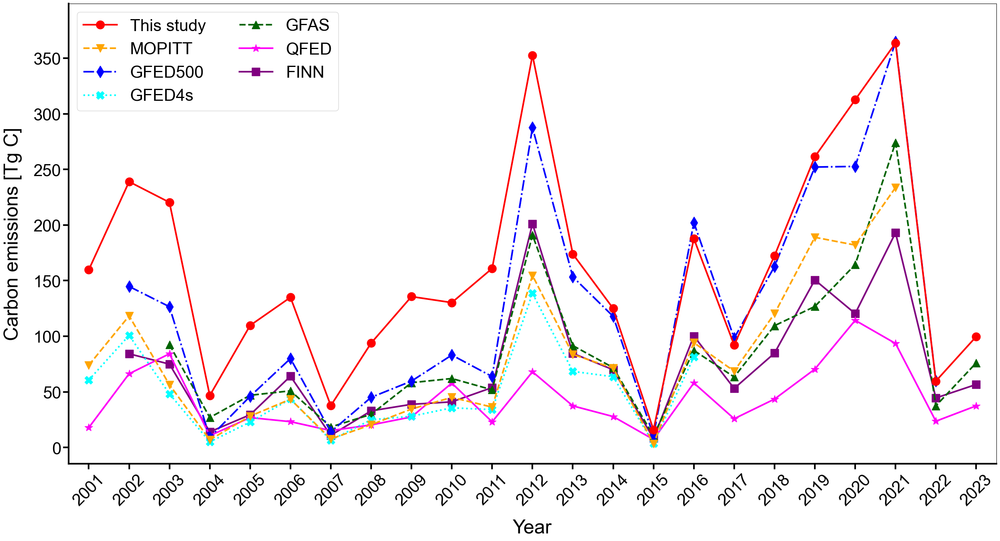

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(30, 15))
content = pd.DataFrame({'Layer': ['Emissions', 'MOPPIT', 'GFED500_All', 'GFED5_All', 'GFED4s_All', 'GFAS_All', 'QFED_All', 'FINN_All'],
                       'Color': ['red', 'orange', 'blue', '#ff00f7', 'cyan', '#50de3a', 'darkgreen', 'purple'],
                       'Label': ['This study', 'MOPITT', 'GFED500', 'GFED5 Beta', 'GFED4s', 'GFAS', 'QFED', 'FINN'],
                       'Marker': ['o', 'v', 'd', 'P', 'X', '^', '*', 's'],
                       'MS': [15, 15, 15, 15, 15, 15, 15, 15],
                       'LW': [3, 3, 3, 3, 3, 3, 3, 3],
                        'Line': ['-', '--', '-.', ':', '-', '--', '-', '-']
        })
content = pd.DataFrame({'Layer': ['Emissions', 'MOPPIT', 'GFED500_All', 'GFED4s_All', 'GFAS_All', 'QFED_All', 'FINN_All'],
                       'Color': ['red', 'orange', 'blue', 'cyan', 'darkgreen', '#ff00f7', 'purple'],
                       'Label': ['This study', 'MOPITT', 'GFED500', 'GFED4s', 'GFAS', 'QFED', 'FINN'],
                       'Marker': ['o', 'v', 'd', 'X', '^', '*', 's'],
                       'MS': [15, 15, 15, 15, 15, 15, 15],
                       'LW': [3, 3, 3, 3, 3, 3, 3],
                        'Line': ['-', '--', '-.', ':', '--', '-', '-']
        })

for i, elements in content.iterrows():
    emissions.loc[:, elements['Layer']].plot(ax=ax,
        color=elements['Color'], linestyle=elements['Line'],
        lw=elements['LW'], ms=elements['MS'], marker=elements['Marker']
    )
    # ax.bar(emissions.index + i * 0.1-0.35, emissions.loc[:, elements['Layer']], 0.1, 
    #        label=elements['Layer'], color=elements['Color'])


ax.set_ylabel('Carbon emissions [Tg C]', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=20);
# ax.set_xticks(np.arange(2000, 2021, 5));
ax.set_xticks(emissions.index);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(ax.get_xticks(), rotation=45);
# ax.set_ylim(None, 250)
## revert zorder
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, content.Label, fontsize=30, loc="upper left", ncol=2)

# for y in emissions.index:
#     if y % 2 == 0:
#         ax.axvspan(y - 0.5, y + 0.5, color='grey', alpha=0.2)
#     else:
#         ax.axvspan(y - 0.5, y + 0.5, color='white', alpha=0.2)
        
for i, line in enumerate(lines, -len(lines)):
    line.set_zorder(abs(i))
ax.set_ylim(None, 399)
ax.set_xlim(2000.5, 2023.5)
ax.spines[['bottom', 'left']].set_linewidth(3)
plt.savefig(f'{local_path}/Plots/BA_Emission_Comparison_Lineplot_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

#### Peat Fire emissions

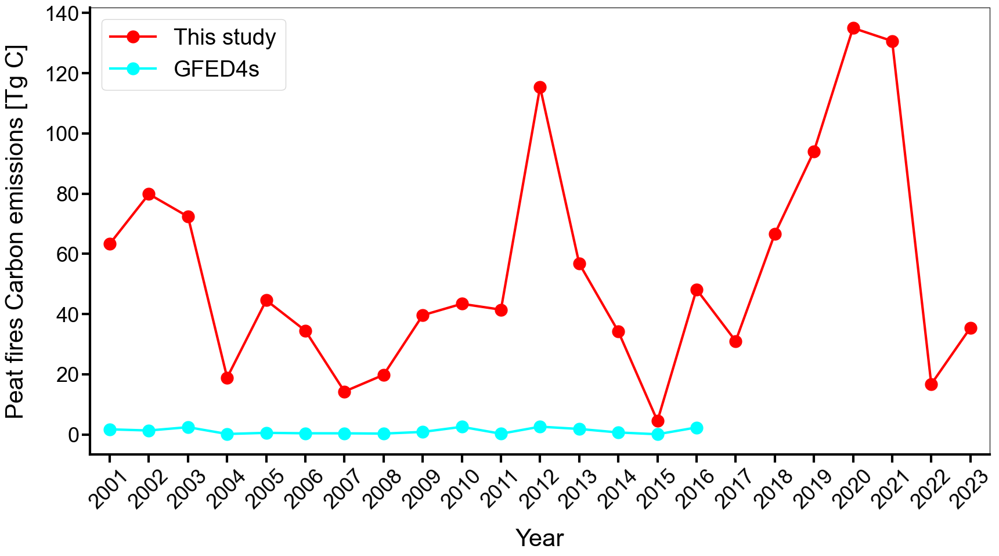

In [84]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
emissions.loc[:, ['PeatFire_Emissions', 'GFED4s_PEAT']].plot(ax=ax,
    color=['red', 'cyan'],
    lw=3, ms=15, marker='o'
).legend(fontsize=28, loc="upper left", labels=['This study', 'GFED4s'])
ax.set_ylabel('Peat fires Carbon emissions [Tg C]', size=30, labelpad=20);
ax.set_xlabel('Year', size=30, labelpad=20);
# ax.set_xticks(np.arange(2000, 2021, 5));
ax.set_xticks(emissions.index);
ax.tick_params(labelsize = 26, size=10, width=3)
ax.set_xticklabels(ax.get_xticks(), rotation=45);
ax.set_xlim(2000.5, 2023.5)
ax.spines[['bottom', 'left']].set_linewidth(3)
plt.savefig(f'{local_path}/Plots/PeatFire_Emissions_Comparison_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

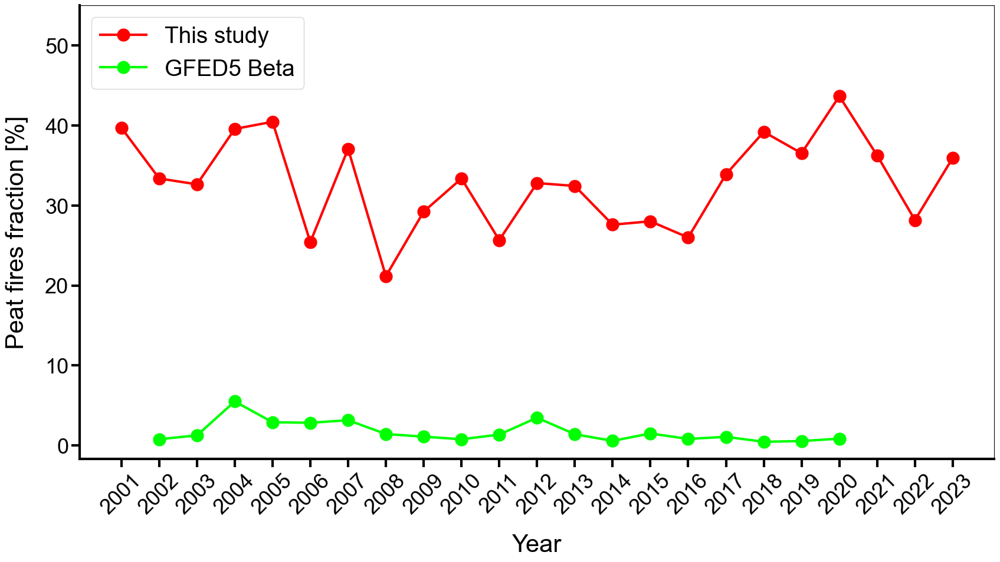

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ts = pd.DataFrame((timeseries['PeatFire_Area'] / timeseries['BA_Area'] * 100).rename('PeatFraction'))
ts.loc[int(GFED5_BA.PEAT_Fraction.index[0]):int(GFED5_BA.PEAT_Fraction.index[-1]), 'GFED5_PEAT'] = GFED5_BA.PEAT_Fraction.values
ts.plot(ax=ax,
    color=['red', 'lime'],
    lw=3, ms=15, marker='o').legend(fontsize=28, loc="upper left", labels=['This study', 'GFED5 Beta'])
ax.set_ylabel('Peat fires fraction [%]', size=30, labelpad=20);
ax.set_xlabel('Year', size=30, labelpad=20);
ax.set_xticks(ts.index);
ax.tick_params(labelsize = 26, size=10, width=3)
ax.set_xticklabels(ts.index, rotation=45);
ax.set_ylim(None, 55);
ax.spines[['bottom', 'left']].set_linewidth(3)
plt.savefig(f'{local_path}/Plots/PeatFire_Fraction_Comparison_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

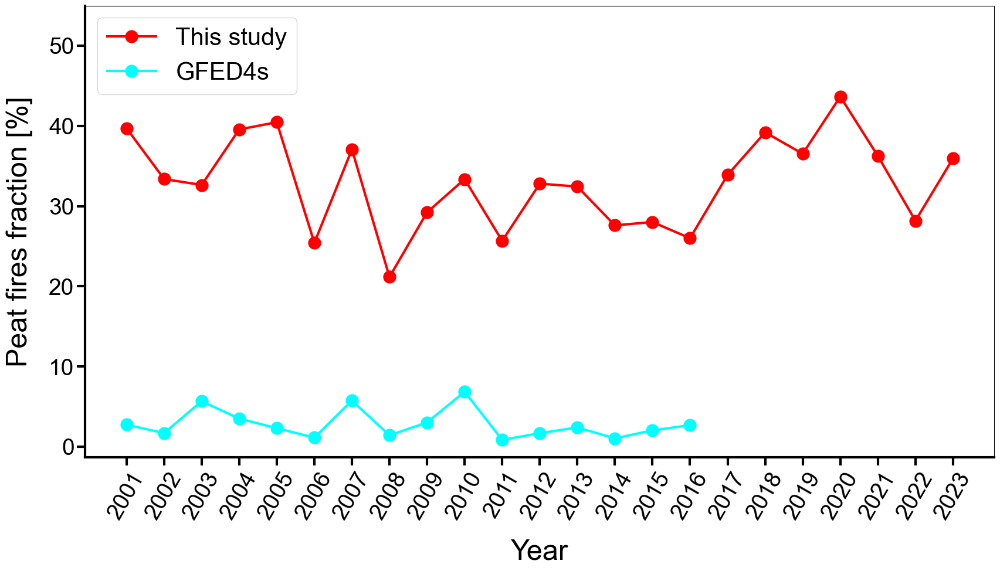

In [365]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
ts = pd.DataFrame((timeseries['PeatFire_Area'] / timeseries['BA_Area'] * 100).rename('PeatFraction'))
ts.loc[int(GFED4s_BA.PEAT_Fraction.index[0]):int(GFED4s_BA.PEAT_Fraction.index[-1]), 'GFED4s_PEAT'] = GFED4s_BA['PEAT_Fraction'].values
ts.plot(ax=ax,
    color=['red', 'cyan'],
    lw=3, ms=15, marker='o').legend(fontsize=30, loc="upper left", labels=['This study', 'GFED4s'])
ax.set_ylabel('Peat fires fraction [%]', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=20);
ax.set_xticks(ts.index);
ax.tick_params(labelsize = 28, size=10, width=3)
ax.set_xticklabels(ts.index, rotation=60);
ax.set_ylim(None, 55);
ax.spines[['bottom', 'left']].set_linewidth(3)
plt.savefig(f'{local_path}/Plots/PeatFire_Fraction_Comparison_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

#### BGCC

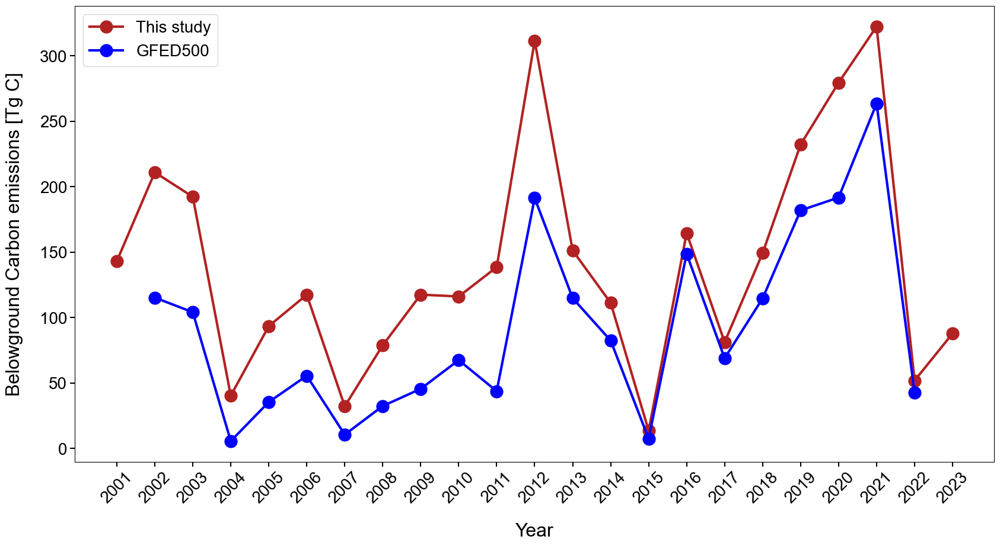

In [121]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
emissions.loc[:, ['BGCC', 'GFED500_BG']].plot(ax=ax,
    color=['firebrick', 'blue'],
    lw=3, ms=15, marker='o'
).legend(fontsize=20, loc="upper left", labels=['This study', 'GFED500'])
ax.set_ylabel('Belowground Carbon emissions [Tg C]', size=23, labelpad=20);
ax.set_xlabel('Year', size=23, labelpad=20);
ax.set_xticks(emissions.index);
ax.tick_params(labelsize = 20, size=6, width=1.5)
ax.set_xticklabels(emissions.index, rotation=45);
plt.savefig(f'{local_path}/Plots/BA_BGCC_Comparison_GFED500_Siberia_{Years[0]}-{Years[-1]}.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

In [65]:
b = timeseries[['BGCC_Average_PeatFires', 'BGCC_Average_All', 'BGCC_Sum_PeatFires', 'BGCC_Sum_All']]
b['diff'] = timeseries.BGCC_Average_PeatFires - timeseries.BGCC_Average_All
b[['BGCC_Sum_PeatFires', 'BGCC_Sum_All']].sum()

BGCC_Sum_PeatFires    1099.723506
BGCC_Sum_All          3237.829686
dtype: float64

In [73]:
b

,BGCC_Average_PeatFires,BGCC_Average_All,BGCC_Sum_PeatFires,BGCC_Sum_All,diff
2001,2964.118151,2941.519405,57.263304,143.107360,22.598746
2002,3078.099950,3051.113701,71.050400,211.016128,26.986250
2003,3098.032098,3038.750726,63.990080,192.322880,59.281372
2004,2955.855230,2864.709583,16.474477,40.359400,91.145647
2005,2875.444308,2847.680250,38.196736,93.493440,27.764057
2006,2988.384998,2959.077504,30.159232,117.493584,29.307494
2007,2998.782408,2888.929730,12.425227,32.289100,109.852678
2008,3001.741687,2989.053487,16.754536,78.828536,12.688199
2009,3022.497904,3001.989297,34.591672,117.561456,20.508607
2010,3065.825165,3040.252849,39.075596,116.137760,25.572316


## Polar Grid maps

In [2]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
extent = gpd.read_file(f"{local_path}/../Regions/Siberia.shp")
extent

,Id,Area,geometry
0,0,8.844,"POLYGON ((177.00000 62.00000, 177.00000 60.000..."


In [3]:
from shapely import box
gdf = gpd.read_file(f"{local_path}/../Regions/Ecoregions_Siberia.shp")
gdf = gpd.overlay(gdf, gpd.GeoDataFrame(geometry=[box(63, 58, 180, 74)], crs="EPSG:4326"), 
                         how='intersection')

In [8]:
np.unique(gdf.ECO_NAME), len(np.unique(gdf.ECO_NAME))

(array(['Cherskii-Kolyma mountain tundra', 'Chukchi Peninsula tundra',
        'East Siberian taiga', 'Kamchatka tundra',
        'Kamchatka-Kurile meadows and sparse forests',
        'Northeast Siberian coastal tundra', 'Northeast Siberian taiga',
        'Northwest Russian-Novaya Zemlya tundra',
        'Novosibirsk Islands Arctic desert', 'Okhotsk-Manchurian taiga',
        'Russian Bering tundra', 'Taimyr-Central Siberian tundra',
        'Trans-Baikal Bald Mountain tundra', 'West Siberian taiga',
        'Yamal-Gydan tundra'], dtype=object),
 15)

In [ ]:
import textwrap

fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
cols = np.array([
    "darkgreen",  # Green
    "forestgreen",  # Blue
    "mediumaquamarine",  # Yellow
    "olive",  # Cyan
    "lime",  # Purple
    "darkred",  # Lime
    "yellow",  # Teal
    "bisque",  # Gray
    "lightcoral",  # Maroon
    "rosybrown",   # Navy
    "#FF0000",  # Red
    "#FF00FF",  # Magenta
    "#FFA500",  # Orange
    "orchid",  # Pink
    "peru",  # Brown
])

    
m = Basemap(projection='stere', resolution='c',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

# Draw parallels and meridians
parallels = np.arange(50., 91., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=20);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=20);

gdf = gdf.to_crs(m.proj4string).sort_values('BIOME_NAME')
labels = gdf['ECO_NAME']
# labs0 = np.sort(gdf['ECO_NAME']).tolist()
# indices = [labs0.index(item) for item in labels if item in labs0]
handles = np.array([mpatches.Patch(edgecolor='none', linewidth=0, facecolor=c, label='') for c in cols])
gdf.plot(ax=ax, edgecolor='none', cmap=mplcol.ListedColormap(cols[np.argsort(labels)]), column='ECO_NAME', legend=False)
wrapped_labels = [textwrap.fill(label, width=35) for label in labels]

legend = plt.legend(
    handles, 
    wrapped_labels, 
    title="Ecoregions", 
    bbox_to_anchor=(0.5, -0.10),  # Position outside the plot (right side)
    loc="upper center",          # Anchor point for the legend
    borderaxespad=0.,           # Padding between legend and plot
    ncols=3,
    fontsize=20,
    mode=None,
)
plt.setp(legend.get_title(), fontsize=30)
legend._legend_box.sep = 20
ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# # Draw the box by connecting the corners using meridians and parallels
# # Bottom edge (parallels)
# lons_bottom = np.linspace(ll_lon, lr_lon, 100)
# lats_bottom = np.full_like(lons_bottom, ll_lat)
# m.plot(lons_bottom, lats_bottom, latlon=True, color='black', linewidth=2, zorder=5)

# # Top edge (parallels)
# lons_top = np.linspace(ul_lon, ur_lon, 100)
# lats_top = np.full_like(lons_top, ul_lat)
# m.plot(lons_top, lats_top, latlon=True, color='black', linewidth=2, zorder=5)

# # Left edge (meridians)
# lats_left = np.linspace(ll_lat, ul_lat, 100)
# lons_left = np.full_like(lats_left, ll_lon)
# m.plot(lons_left, lats_left, latlon=True, color='black', linewidth=2, zorder=5)

# # Right edge (meridians)
# lats_right = np.linspace(lr_lat, ur_lat, 100)
# lons_right = np.full_like(lats_right, lr_lon)
# m.plot(lons_right, lats_right, latlon=True, color='black', linewidth=2, zorder=5)

# m.fillcontinents(color='none', 
#                  lake_color='blue',
#                  zorder=0
#                 );
# m.drawmapboundary(fill_color='cornflowerblue')

plt.savefig(f'{local_path}/Plots/Polar_Ecoregions.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 1) Total BA

In [3]:
lyr = {"Bins": np.array([0, 0.01, 0.02, 0.05, 0.1, 0.15, 0.20, 0.25, 1]),
       # "Colors": ["#dacce3", "#aa6f9f", "#1965b0", "#7bafde", "#c9e0aa", "#f4a637", "#dc050c", '#870000'],
       "Colors": ["#dacce3", "#aa6f9f", '#a9e5e8', '#ffff8c', "#f4a637", '#d73027', '#a50026', '#870000']
      }
lyr['Labels'] = [f'{lyr["Bins"][i]} - {lyr["Bins"][i+1]}' for i in range(1, len(lyr["Bins"])-2)]
lyr['Labels'].insert(0, f'  ≤ {lyr["Bins"][1]}')
lyr['Labels'].insert(len(lyr['Labels']), f'  > {lyr["Bins"][-2]}')
lyr

{'Bins': array([0.  , 0.01, 0.02, 0.05, 0.1 , 0.15, 0.2 , 0.25, 1.  ]),
 'Colors': ['#dacce3',
  '#aa6f9f',
  '#a9e5e8',
  '#ffff8c',
  '#f4a637',
  '#d73027',
  '#a50026',
  '#870000'],
 'Labels': ['  ≤ 0.01',
  '0.01 - 0.02',
  '0.02 - 0.05',
  '0.05 - 0.1',
  '0.1 - 0.15',
  '0.15 - 0.2',
  '0.2 - 0.25',
  '  > 0.25']}

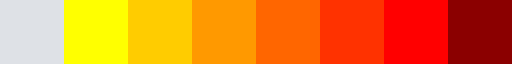

In [4]:
a = mpl.colormaps['autumn_r']
cmap = mplcol.ListedColormap(['#dee1e6', *a(np.linspace(0, 256, 6).astype(int)), '#8B0000'])
# cmap = colors.LinearSegmentedColormap.from_list("red_to_grey", ['#dee1e6', 'paleturquoise', 'greenyellow', 'yellow', 'orange', 'red', 'firebrick'], N=8)
norm = mplcol.BoundaryNorm(lyr["Bins"], cmap.N)
cmap

In [5]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-1][0:4], '%Y')
    ds.coords['time'] = time
    return ds

## labels 'Total burned area (x1000 $km^2$)' or 'Peat fires area (x1000 $km^2$)'
layer, variable, res, label = 'PeatFire', 'Area', '025', 'Peat fires [Mha]'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/{layer}_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')


In [8]:
ds.band_data.sum(dim=('time'))

<xarray.DataArray 'band_data' (y: 64, x: 468)>
dask.array<sum-aggregate, shape=(64, 468), dtype=float32, chunksize=(64, 468), chunktype=numpy.ndarray>
Coordinates:
  * x            (x) float64 63.12 63.38 63.62 63.88 ... 179.1 179.4 179.6 179.9
  * y            (y) float64 73.88 73.62 73.38 73.12 ... 58.88 58.62 58.38 58.12
    spatial_ref  int64 0

In [ ]:
ds.band_data.sum(dim=('time')).rio.write_crs(4326).rio.to_raster(f'{local_path}/PeatFire/Summaries/{layer}_SUM_{variable}_{res}D.tif')

In [ ]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-1][0:4], '%Y')
    ds.coords['time'] = time
    return ds

layer, variable, res = 'PeatFire', 'Area', '1'
if layer == 'BA':
    c = 1
    label = 'Total burned area [×1000 ha]'
else:
    c = 0
    label = 'Peat fires [×1000 ha]'
lyr = {"Bins": (np.array([[0, 0.01, 0.02, 0.05, 0.1, 0.15, 0.20, 0.25, 1],
                         [0, 0.025, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 3]])*1000).astype(int),
       # "Colors": ["#dacce3", "#aa6f9f", "#1965b0", "#7bafde", "#c9e0aa", "#f4a637", "#dc050c", '#870000'],
       # "Colors": ["#dacce3", "#aa6f9f", '#a9e5e8', '#ffff8c', "#f4a637", '#d73027', '#a50026', '#870000']
       # "Colors": ['#dee1e6', '#becf90', '#d6d627', 'yellow', '#fff000', 'orange', 'red', 'darkred']
        "Colors": ['#dee1e6', '#fffc9c', '#FFFF00', '#FFD700', '#FF8C00', '#FF4500', '#ff0000', '#8B0000']
      }
bins = lyr["Bins"][c]
lyr['Labels'] = [f'{bins[i]} - {bins[i+1]}' for i in range(1, len(bins)-2)]
lyr['Labels'].insert(0, f'  ≤ {bins[1]}')
lyr['Labels'].insert(len(lyr['Labels']), f'  > {bins[-2]}')
pal = mpl.colormaps['autumn_r']
cmap = mplcol.ListedColormap(['#dee1e6', *pal(np.linspace(0, 256, 6).astype(int)), '#8B0000'])
norm = mplcol.BoundaryNorm(bins, cmap.N)

ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/{layer}_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')
fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Define the Lambert Azimuthal Equal Area map centered on Siberia
m = Basemap(projection='stere', resolution='l',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
x, y = m(lon, lat)
data = ds.band_data.sum(dim=('time')) * 1e-7
data = data.where(data > bins[1])
c = m.pcolormesh(x, y, data, shading='auto', 
                 norm=norm, cmap=cmap
                 # cmap='hot',
                 # vmax=120, 
                 # vmin=1e2
                )

# lons = np.arange(-180, 180, ds.rio.transform()[0]) 
# lats = np.arange(90, -90, ds.rio.transform()[4])
# full_raster = np.full((lats.shape[0], lons.shape[0]), np.nan, np.float)
# full_raster[np.where(lats==ymax)[0][0]:np.where(lats==ymin)[0][0], np.where(lons==xmin)[0][0]:] = ds.band_data.sum(dim=('time'))
# lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
# x, y = m(lon, lat)
# # Plot the data on the map without transforming the pixels
# c = m.pcolormesh(x, y, full_raster * 1e-6, shading='auto', cmap='Spectral_r',
#                  # vmax=5e3, vmin=1e2
#                 )

## c = m.pcolormesh(x, y, full_raster+1, shading='auto', norm=LogNorm(), cmap='Spectral_r')

# full_raster2 = np.full((lats.shape[0], lons.shape[0]), np.nan, np.float)
# full_raster2[np.where(lats==ymax)[0][0]:np.where(lats==ymin)[0][0], np.where(lons==xmin)[0][0]:] = ds.band_data.isel(time=20)
# m.pcolormesh(x, y, full_raster2 * 1e-6, cmap="Greys_r", alpha=0.8)

ticks = bins[1:] - ((bins[1:] -  bins[:-1]) / 2)
cb = m.colorbar(c, "right", size="2.5%", pad='7%', 
                # extend='both'
                # extend='max',
                ticks=ticks
               )
cb.set_label(label, size=25, labelpad=23,
             # weight='bold'
            )
cb.ax.tick_params(labelsize=23, size=6, width=1.5)
cb.ax.set_yticklabels(lyr['Labels']) 
cb.ax.minorticks_off()
# Draw parallels and meridians
parallels = np.arange(50., 91., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=20);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=20);


arctic_circle_lat = 66.5
m.drawparallels([arctic_circle_lat], labels=[0, 0, 0, 0], color='blue',
               linewidth=2, 
                dashes=[4, 4],
                latmax=90, ## to avoid having another line in 80N
               )

arctic_circle_legend = Line2D([0], [0], color='blue', linewidth=3, linestyle='--')
# stud_area_legend = Line2D([0], [0], color='black', linewidth=1.5, linestyle='-')
stud_area_legend = mpatches.Patch(edgecolor='black', linewidth=2, facecolor='none', label='Study area')
plt.legend([stud_area_legend, arctic_circle_legend], ['Study area', 'Arctic Circle'], 
           loc='lower right', fontsize=25)


ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# Draw the box by connecting the corners using meridians and parallels
# Bottom edge (parallels)
lons_bottom = np.linspace(ll_lon, lr_lon, 100)
lats_bottom = np.full_like(lons_bottom, ll_lat)
m.plot(lons_bottom, lats_bottom, latlon=True, color='black', linewidth=2, zorder=5)

# Top edge (parallels)
lons_top = np.linspace(ul_lon, ur_lon, 100)
lats_top = np.full_like(lons_top, ul_lat)
m.plot(lons_top, lats_top, latlon=True, color='black', linewidth=2, zorder=5)

# Left edge (meridians)
lats_left = np.linspace(ll_lat, ul_lat, 100)
lons_left = np.full_like(lats_left, ll_lon)
m.plot(lons_left, lats_left, latlon=True, color='black', linewidth=2, zorder=5)

# Right edge (meridians)
lats_right = np.linspace(lr_lat, ur_lat, 100)
lons_right = np.full_like(lats_right, lr_lon)
m.plot(lons_right, lats_right, latlon=True, color='black', linewidth=2, zorder=5)

m.fillcontinents(color='#dee1e6', 
                 lake_color='white',
                 zorder=0
                )
m.drawmapboundary(fill_color='white')

# gdf = gpd.read_file(f"{local_path}/../Regions/Siberia_Land.shp")
# Convert the GeoPandas GeoDataFrame to the Basemap projection
gdf = gdf.to_crs(m.proj4string)
# gdf.plot(ax=ax, edgecolor='k', cmap='tab20b', alpha=0.2, column='BIOME_NAME')
# gdf.simplify(1).plot(ax=ax, edgecolor='k', facecolor='none')
# # Add labels from the GeoDataFrame
# for x, y, label in zip(gdf.geometry.centroid.x, gdf.geometry.centroid.y, gdf['ECO_NAME']):  # Replace 'NAME' with the appropriate column name
#     plt.text(x, y, label, fontsize=8, ha='right', va='center')

plt.savefig(f'{local_path}/Plots/Polar-Grid_{layer}_{variable}_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 2) Yearly pixel BA 

In [972]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-3][0:4], '%Y')
    ds.coords['time'] = time
    return ds

res = '0005-00025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/BA_Siberia_Lndst_20[0-9][0-9]_JD_{res}D.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')
ds

<xarray.Dataset>
Dimensions:      (x: 23400, y: 6400, time: 23)
Coordinates:
  * x            (x) float64 63.0 63.01 63.01 63.02 ... 180.0 180.0 180.0 180.0
  * y            (y) float64 74.0 74.0 73.99 73.99 ... 58.01 58.01 58.0 58.0
    spatial_ref  int64 0
  * time         (time) datetime64[ns] 2001-01-01 2002-01-01 ... 2023-01-01
Data variables:
    band_data    (time, y, x) float32 dask.array<chunksize=(1, 6400, 23400), meta=np.ndarray>

In [973]:
ds1 = ds.band_data.values

In [974]:
ds1[ds1 < 0] = 0
ds1[ds1 > 0] = 1

In [977]:
ds2 = ds1.astype(np.int8)
del ds1

In [978]:
mask = ds2.sum(0) == 0

In [979]:
## switch the order of the time dimension to take the last in argmax
burned_year = 2023 - ds2[::-1, :, :].argmax(0).astype(np.int16)
burned_year[mask] = 0

In [980]:
burned_year.max()

2023

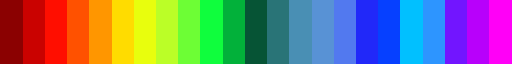

In [981]:
# Basis colors
basis_colors = [
    '#8b0101', '#ff0300', '#ff7f00', '#ffff00', '#acfe30', '#00ff3f',
    '#065535', '#478faf', '#6395ec', '#0900ff', '#00ebff', '#7e00ff', '#ff00f7'
]

# Create the custom colormap
cmap = mplcol.LinearSegmentedColormap.from_list('custom_colormap', basis_colors, N=23)
cmap

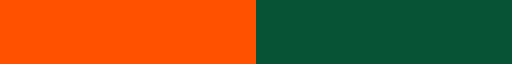

In [982]:
mplcol.LinearSegmentedColormap.from_list('custom_colormap', [cmap(23-20), cmap(23-12)], N=2)

full_raster created
meshgrid created
del arrays


/tmp/ipykernel_11663/3312957839.py:40: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap.reversed(),


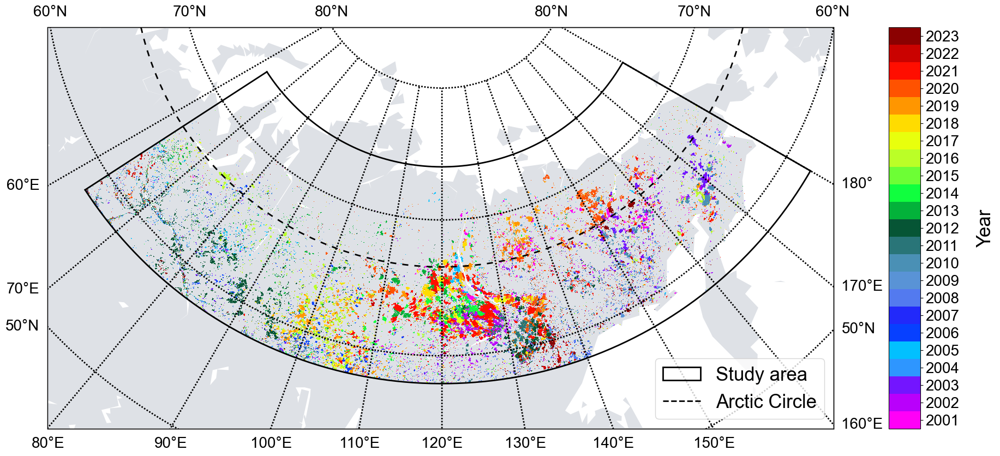

In [988]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-3][0:4], '%Y')
    ds.coords['time'] = time
    return ds

res = '0005-00025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/BA_Siberia_Lndst_20[0-9][0-9]_JD_{res}D.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')

fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Define the Lambert Azimuthal Equal Area map centered on Siberia
m = Basemap(projection='stere', resolution='c',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

print('full_raster created')
lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
print('meshgrid created')
x, y = m(lon, lat)
print('del arrays')
del lon, lat, lons, lats
# Plot the data on the map without transforming the pixels
burned_year = np.ma.masked_where(burned_year == 0, burned_year)

boundaries = np.arange(2001, 2025, 1)
norm = mplcol.BoundaryNorm(boundaries, cmap.reversed().N, clip=True)
ticks = (boundaries[:-1] + boundaries[1:]) / 2
tick_labels = [str(i) for i in range(2001, 2024)]
c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap.reversed(),
                 # vmax=2023, vmin=2001,
                 norm=norm
                )

cb = m.colorbar(c, "right", size="4%", pad='7%', 
                # extend='both',
                # ticks=ticks
               )

# Add desired ticks manually
cb.set_ticks(ticks, labels=tick_labels)  # Re-add only the desired ticks
cb.set_label('Year', size=25, labelpad=23)
cb.ax.tick_params(labelsize=20)
cb.ax.minorticks_off()

# Draw parallels and meridians
parallels = np.arange(50., 81., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=20);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=20);

arctic_circle_lat = 66.5
m.drawparallels([arctic_circle_lat], labels=[0, 0, 0, 0], color='k',
               linewidth=2,
                dashes=[4, 4],
                latmax=90 ## to avoid having another line in 80N
               )

ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# Draw the box by connecting the corners using meridians and parallels
# Bottom edge (parallels)
lons_bottom = np.linspace(ll_lon, lr_lon, 100)
lats_bottom = np.full_like(lons_bottom, ll_lat)
m.plot(lons_bottom, lats_bottom, latlon=True, color='black', linewidth=2, zorder=5)

# Top edge (parallels)
lons_top = np.linspace(ul_lon, ur_lon, 100)
lats_top = np.full_like(lons_top, ul_lat)
m.plot(lons_top, lats_top, latlon=True, color='black', linewidth=2, zorder=5)

# Left edge (meridians)
lats_left = np.linspace(ll_lat, ul_lat, 100)
lons_left = np.full_like(lats_left, ll_lon)
m.plot(lons_left, lats_left, latlon=True, color='black', linewidth=2, zorder=5)

# Right edge (meridians)
lats_right = np.linspace(lr_lat, ur_lat, 100)
lons_right = np.full_like(lats_right, lr_lon)
m.plot(lons_right, lats_right, latlon=True, color='black', linewidth=2, zorder=5)


m.fillcontinents(color='#dee1e6', 
                 lake_color='white',
                 zorder=0
                )
m.drawmapboundary(fill_color='white')

arctic_circle_legend = Line2D([0], [0], color='k', linewidth=2, linestyle='--')
# stud_area_legend = Line2D([0], [0], color='black', linewidth=1.5, linestyle='-')
stud_area_legend = mpatches.Patch(edgecolor='black', linewidth=2, facecolor='none', label='Study area')
plt.legend([stud_area_legend, arctic_circle_legend], ['Study area', 'Arctic Circle'], 
           loc='lower right', fontsize=25)

plt.savefig(f'{local_path}/Plots/Polar-Grid_BurnedYear_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 3) Hugelius maps

In [53]:
permaSOC = xr.open_dataset(f'{local_path}/../Ancillary/Higelius_Peat_properties/Histel_SOC_hg_per_sqm_WGS84.nc')
permaSOC['Histel_SOC_hg_per_sqm_WGS84.tif']

<xarray.DataArray 'Histel_SOC_hg_per_sqm_WGS84.tif' (lat: 813, lon: 3600)>
[2926800 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.7 ... 179.7 179.8 179.9
  * lat      (lat) float64 89.95 89.85 89.75 89.65 89.55 ... 9.05 8.95 8.85 8.75
Attributes:
    long_name:       Histel_SOC_hg_per_sqm_WGS84.tif
    esri_pe_string:  GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1...
    units:           Degree

### 4) Peat map fraction

In [24]:
res = '025'
ds = xr.open_dataset(f'{local_path}/PeatFire/Summaries/PeatMap_Area_025D_2001.tif').sum('band')
area = Global_Functions.get_pixel_area(f'{local_path}/PeatFire/Summaries/PeatMap_Area_{res}D_2001.tif', area_1d=False)
data = ds.band_data / area * 100
data

<xarray.DataArray 'band_data' (y: 64, x: 468)>
array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [31.41119976, 40.74800014, 60.68929837, ...,  0.        ,
         0.        ,  0.        ],
       [57.949399  , 44.37430008, 30.59169959, ...,  0.        ,
         0.        ,  0.        ],
       [33.58359919, 26.89000004, 16.91450003, ...,  0.        ,
         0.        ,  0.        ]])
Coordinates:
  * x            (x) float64 63.12 63.38 63.62 63.88 ... 179.1 179.4 179.6 179.9
  * y            (y) float64 73.88 73.62 73.38 73.12 ... 58.88 58.62 58.38 58.12
    spatial_ref  int64 ...

In [23]:
data.rio.write_crs(4326).rio.to_raster(f'{local_path}/PeatFire/Summaries/PeatMap_Fraction_{res}D.tif')

### 5) Fires of 2020 vs 2012, 2021

In [65]:
np.append(np.delete(np.arange(2001, 2024), [11, 19, 20]), 0)

array([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2013, 2014, 2015, 2016, 2017, 2018, 2019, 2022, 2023,    0])

/tmp/ipykernel_3363778/3960977262.py:24: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, data, shading='auto',


full_raster created
meshgrid created
del arrays


/tmp/ipykernel_3363778/3960977262.py:113: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap2,


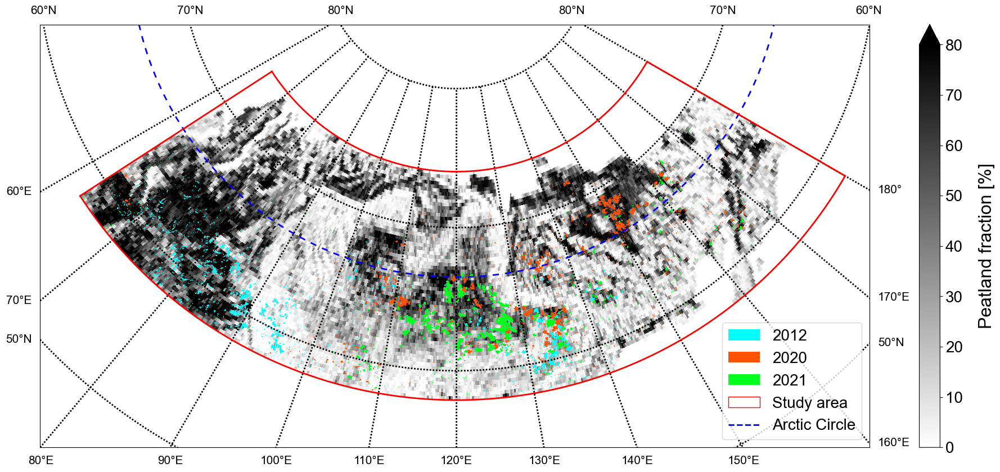

In [75]:
ds = xr.open_dataset(f'{local_path}/PeatFire/Summaries/PeatMap_Area_025D_2001.tif').sum('band')
area = Global_Functions.get_pixel_area(f'{local_path}/PeatFire/Summaries/PeatMap_Area_025D_2001.tif', area_1d=False)
data = ds.band_data / area * 100
fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Define the Lambert Azimuthal Equal Area map centered on Siberia
m = Basemap(projection='stere', resolution='l',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
x, y = m(lon, lat)

c = m.pcolormesh(x, y, data, shading='auto', 
                 cmap='gray_r',
                 vmax=80, vmin=0
                )


cb = m.colorbar(c, "right", size="2.5%", pad='6%', 
                extend='max'
               )
cb.set_label('Peatland fraction [%]', size=23, labelpad=20)
cb.ax.tick_params(labelsize=20)

# Draw parallels and meridians
parallels = np.arange(50., 91., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=15);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=15);


arctic_circle_lat = 66.5
m.drawparallels([arctic_circle_lat], labels=[0, 0, 0, 0], color='blue',
               linewidth=2,
                dashes=[4, 4],
                latmax=90 ## to avoid having another line in 80N
               )


ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# Draw the box by connecting the corners using meridians and parallels
# Bottom edge (parallels)
lons_bottom = np.linspace(ll_lon, lr_lon, 100)
lats_bottom = np.full_like(lons_bottom, ll_lat)
m.plot(lons_bottom, lats_bottom, latlon=True, color='red', linewidth=2, zorder=5)

# Top edge (parallels)
lons_top = np.linspace(ul_lon, ur_lon, 100)
lats_top = np.full_like(lons_top, ul_lat)
m.plot(lons_top, lats_top, latlon=True, color='red', linewidth=2, zorder=5)

# Left edge (meridians)
lats_left = np.linspace(ll_lat, ul_lat, 100)
lons_left = np.full_like(lats_left, ll_lon)
m.plot(lons_left, lats_left, latlon=True, color='red', linewidth=2, zorder=5)

# Right edge (meridians)
lats_right = np.linspace(lr_lat, ur_lat, 100)
lons_right = np.full_like(lats_right, lr_lon)
m.plot(lons_right, lats_right, latlon=True, color='red', linewidth=2, zorder=5)

arctic_circle_legend = Line2D([0], [0], color='blue', linewidth=2, linestyle='--')
# stud_area_legend = Line2D([0], [0], color='red', linewidth=1.5, linestyle='-')
stud_area_legend = mpatches.Patch(edgecolor='red', facecolor='none', label='Study area')



def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-3][0:4], '%Y')
    ds.coords['time'] = time
    return ds

res = '0005-00025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/BA_Siberia_Lndst_20[0-9][0-9]_JD_{res}D.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')


xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

print('full_raster created')
lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
print('meshgrid created')
x, y = m(lon, lat)
print('del arrays')
del lon, lat, lons, lats
# # Plot the data on the map without transforming the pixels
masked = np.append(np.delete(np.arange(2001, 2024), [11, 19, 20]), 0)
burned_year = np.ma.masked_where(np.isin(burned_year, masked), burned_year)

boundaries = np.array([2012, 2020, 2021, 2022])
cmap2 = mplcol.LinearSegmentedColormap.from_list('custom2', ['#00ffff', cmap(23-20), '#00ff1e'], N=3)
norm = mplcol.BoundaryNorm(boundaries, cmap2.N, clip=True)
c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap2,
                 norm=norm
                )

custom_patches = [
    mpatches.Patch(edgecolor='none', facecolor='#00ffff', label='2012'),
    mpatches.Patch(edgecolor='none', facecolor=cmap(23-20), label='2020'),
    mpatches.Patch(edgecolor='none', facecolor='#00ff1e', label='2021')
]

plt.legend([*custom_patches, stud_area_legend, arctic_circle_legend], ['2012', '2020', '2021', 'Study area', 'Arctic Circle'], 
           loc='lower right', fontsize=20)

plt.savefig(f'{local_path}/Plots/Polar-Grid_Peatland-LargeFires.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

/tmp/ipykernel_3363778/2181083007.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, data, shading='auto',


full_raster created
meshgrid created
del arrays


/tmp/ipykernel_3363778/2181083007.py:110: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap2,


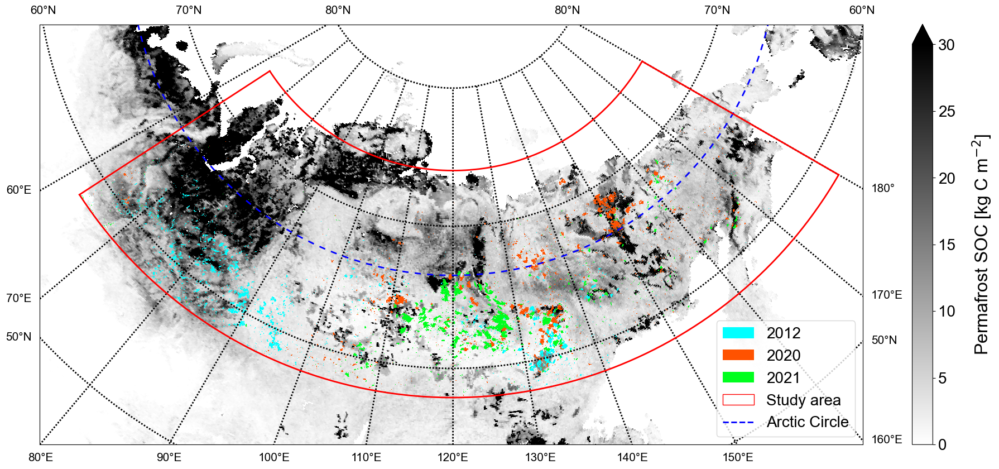

In [77]:
ds = xr.open_dataset(f'{local_path}/../Ancillary/Higelius_Peat_properties/Histel_SOC_hg_per_sqm_WGS84.nc')

fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Define the Lambert Azimuthal Equal Area map centered on Siberia
m = Basemap(projection='stere', resolution='l',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
x, y = m(lon, lat)
data = ds['Histel_SOC_hg_per_sqm_WGS84.tif'].values * 1e-1   ## hg to kg
c = m.pcolormesh(x, y, data, shading='auto', 
                 cmap='gray_r',
                 vmax=30, vmin=0
                )

cb = m.colorbar(c, "right", size="2.5%", pad='6%', 
                extend='max'
               )
cb.set_label('Permafrost SOC [kg C m$^{-2}$]', size=23, labelpad=20)
cb.ax.tick_params(labelsize=20)

# Draw parallels and meridians
parallels = np.arange(50., 91., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=15);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=15);


arctic_circle_lat = 66.5
m.drawparallels([arctic_circle_lat], labels=[0, 0, 0, 0], color='blue',
               linewidth=2,
                dashes=[4, 4],
                latmax=90 ## to avoid having another line in 80N
               )


ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# Draw the box by connecting the corners using meridians and parallels
# Bottom edge (parallels)
lons_bottom = np.linspace(ll_lon, lr_lon, 100)
lats_bottom = np.full_like(lons_bottom, ll_lat)
m.plot(lons_bottom, lats_bottom, latlon=True, color='red', linewidth=2, zorder=5)

# Top edge (parallels)
lons_top = np.linspace(ul_lon, ur_lon, 100)
lats_top = np.full_like(lons_top, ul_lat)
m.plot(lons_top, lats_top, latlon=True, color='red', linewidth=2, zorder=5)

# Left edge (meridians)
lats_left = np.linspace(ll_lat, ul_lat, 100)
lons_left = np.full_like(lats_left, ll_lon)
m.plot(lons_left, lats_left, latlon=True, color='red', linewidth=2, zorder=5)

# Right edge (meridians)
lats_right = np.linspace(lr_lat, ur_lat, 100)
lons_right = np.full_like(lats_right, lr_lon)
m.plot(lons_right, lats_right, latlon=True, color='red', linewidth=2, zorder=5)

arctic_circle_legend = Line2D([0], [0], color='blue', linewidth=2, linestyle='--')
# stud_area_legend = Line2D([0], [0], color='red', linewidth=1.5, linestyle='-')
stud_area_legend = mpatches.Patch(edgecolor='red', facecolor='none', label='Study area')


def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-3][0:4], '%Y')
    ds.coords['time'] = time
    return ds

res = '0005-00025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/BA_Siberia_Lndst_20[0-9][0-9]_JD_{res}D.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')


xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

print('full_raster created')
lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
print('meshgrid created')
x, y = m(lon, lat)
print('del arrays')
del lon, lat, lons, lats
# # Plot the data on the map without transforming the pixels
masked = np.append(np.delete(np.arange(2001, 2024), [11, 19, 20]), 0)
burned_year = np.ma.masked_where(np.isin(burned_year, masked), burned_year)

boundaries = np.array([2012, 2020, 2021, 2022])
cmap2 = mplcol.LinearSegmentedColormap.from_list('custom2', ['#00ffff', cmap(23-20), '#00ff1e'], N=3)
norm = mplcol.BoundaryNorm(boundaries, cmap2.N, clip=True)
c = m.pcolormesh(x, y, burned_year, shading='auto', cmap=cmap2,
                 norm=norm
                )

custom_patches = [
    mpatches.Patch(edgecolor='none', facecolor='#00ffff', label='2012'),
    mpatches.Patch(edgecolor='none', facecolor=cmap(23-20), label='2020'),
    mpatches.Patch(edgecolor='none', facecolor='#00ff1e', label='2021')
]

plt.legend([*custom_patches, stud_area_legend, arctic_circle_legend], ['2012', '2020', '2021', 'Study area', 'Arctic Circle'], 
           loc='lower right', fontsize=20)

plt.savefig(f'{local_path}/Plots/Polar-Grid_Permafrost-SOC-LargeFires.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 6) PEATMAP

/tmp/ipykernel_2396406/365527088.py:27: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  c = m.pcolormesh(x, y, data, shading='auto', cmap=cmap3,


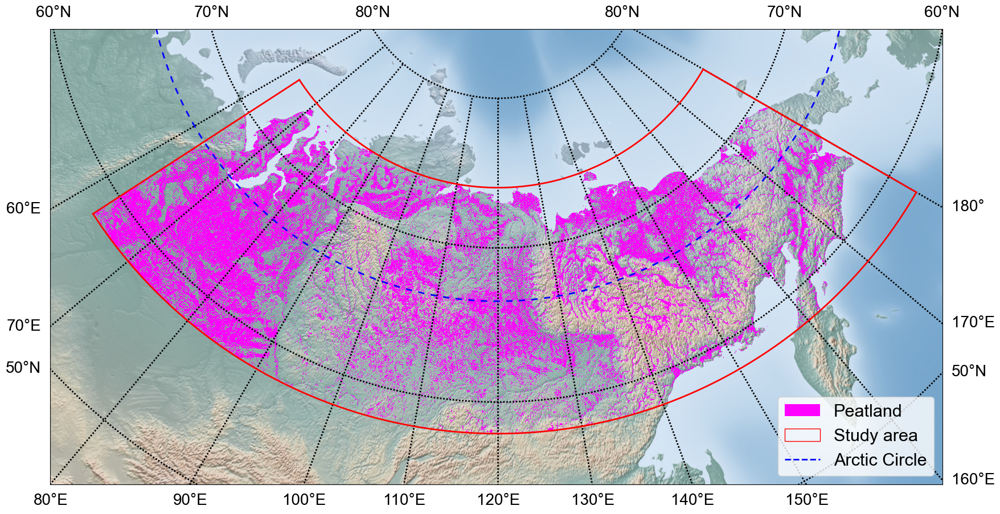

In [15]:
res = '0005-00025'
ds = xr.open_dataset(f'{local_path}/PeatFire/Summaries/PeatMap_Siberia_{res}D.tif')
data = ds['band_data'].values[0]
data[data > 1] = 0
fig = plt.figure(figsize=(20, 10))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Define the Lambert Azimuthal Equal Area map centered on Siberia
m = Basemap(projection='stere', resolution='l',
        lat_0=90, lon_0=120, 
        llcrnrlon=80, urcrnrlon=200, llcrnrlat=45, urcrnrlat=60,
        rsphere=(6378137.00, 6356752.3142),
        area_thresh=1000., ax=ax)

xmin = ds.rio.transform()[2]
xmax = ds.rio.transform()[2] + ds.rio.width * ds.rio.transform()[0]
ymax = ds.rio.transform()[5]
ymin = ds.rio.transform()[5] + ds.rio.height * ds.rio.transform()[4]
lons = ds.rio.transform()[2] + np.arange(ds.rio.width ) * ds.rio.transform()[0]
lats = ds.rio.transform()[5] + np.arange(ds.rio.height) * ds.rio.transform()[4]

lon, lat = np.meshgrid(lons + ds.rio.transform()[0]/2, lats + ds.rio.transform()[4]/2)
x, y = m(lon, lat)
boundaries = np.array([0, 1])
cmap3 = mplcol.LinearSegmentedColormap.from_list('custom3', ['none', 'magenta'], N=2)
norm = mplcol.BoundaryNorm(boundaries, cmap3.N, clip=True)
c = m.pcolormesh(x, y, data, shading='auto', cmap=cmap3,
                 norm=norm
                )

# Draw parallels and meridians
parallels = np.arange(50., 91., 10.)
m.drawparallels(parallels, labels=[1, 1, 1, 0], linewidth=2, fontsize=20);
meridians = np.arange(60., 181., 10.)
m.drawmeridians(meridians, labels=[1, 1, 0, 1], linewidth=2, fontsize=20);


arctic_circle_lat = 66.5
m.drawparallels([arctic_circle_lat], labels=[0, 0, 0, 0], color='blue',
               linewidth=2,
                dashes=[4, 4],
                latmax=90 ## to avoid having another line in 80N
               )


ll_lon, ll_lat = 63, 58  # lower left corner
ul_lon, ul_lat = 63, 74  # upper left corner
lr_lon, lr_lat = 180, 58  # lower right corner
ur_lon, ur_lat = 180, 74  # upper right corner

# Draw the box by connecting the corners using meridians and parallels
# Bottom edge (parallels)
lons_bottom = np.linspace(ll_lon, lr_lon, 100)
lats_bottom = np.full_like(lons_bottom, ll_lat)
m.plot(lons_bottom, lats_bottom, latlon=True, color='red', linewidth=2, zorder=5)

# Top edge (parallels)
lons_top = np.linspace(ul_lon, ur_lon, 100)
lats_top = np.full_like(lons_top, ul_lat)
m.plot(lons_top, lats_top, latlon=True, color='red', linewidth=2, zorder=5)

# Left edge (meridians)
lats_left = np.linspace(ll_lat, ul_lat, 100)
lons_left = np.full_like(lats_left, ll_lon)
m.plot(lons_left, lats_left, latlon=True, color='red', linewidth=2, zorder=5)

# Right edge (meridians)
lats_right = np.linspace(lr_lat, ur_lat, 100)
lons_right = np.full_like(lats_right, lr_lon)
m.plot(lons_right, lats_right, latlon=True, color='red', linewidth=2, zorder=5)

arctic_circle_legend = Line2D([0], [0], color='blue', linewidth=2, linestyle='--')
# stud_area_legend = Line2D([0], [0], color='red', linewidth=1.5, linestyle='-')
stud_area_legend = mpatches.Patch(edgecolor='red', facecolor='none', label='Study area')
custom_patches = [
    mpatches.Patch(edgecolor='none', facecolor='magenta', label='Peatland')
]

plt.legend([*custom_patches, stud_area_legend, arctic_circle_legend], ['Peatland', 'Study area', 'Arctic Circle'], 
           loc='lower right', fontsize=22)
# m.fillcontinents(color='#dee1e6', 
#                  lake_color='white',
#                  zorder=0
#                 )
# m.drawmapboundary(fill_color='white')
m.shadedrelief()
    
plt.savefig(f'{local_path}/Plots/Polar-Grid_PeatMap_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

## Patch aggregation

### 2) Aggregate yearly patches

In [87]:
local_path = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/Landsat_BA'
zone, dataset, cutoff = 'Siberia', 'Lndst', 16
for year in np.arange(2023, 2000, -1)[:]:
    if year <= 2023:
        df = pd.DataFrame()
        files = glob.glob(f'{local_path}/{zone}/ByTile/**/Patches/Tabular/BAMT_BA_{zone}_{dataset}_Patch-Stats-{cutoff}_{year}_*.csv')
        print(year, len(files))
        for i, f in enumerate(files):
            new_df = pd.read_csv(f)
            new_df['YEAR'] = year
            df = pd.concat([df, new_df], ignore_index=True)
    cols = ["BOUNDS"]
    df = df.iloc[df[cols].drop_duplicates(keep='first').index].sort_values('AREA', ascending=False)
    # df.set_index('ID').to_csv(f"{local_path}/{zone}/PeatFire/BG_CC/Patch_stats/BAMT_{zone}_{dataset}_Yearly_Patch_Stats_{cutoff}_{year}.csv", index_label='ID') 
## Further elimination of some repllicates is done manually

2023 289
2022 289
2021 289
2020 289
2019 289
2018 289
2017 289
2016 289
2015 289
2014 289
2013 289
2012 289
2011 289
2010 289
2009 289
2008 289
2007 289
2006 289
2005 289
2004 289
2003 289
2002 289
2001 289


In [68]:
cols = ["BOUNDS"]
dup = np.array([i[1] for i in df[cols][df[cols].duplicated()].iterrows()])
df.iloc[np.isin(np.array([i[1] for i in df[cols].iterrows()]), dup).all(1)].sort_values(['AREA', 'BOUNDS'], ascending=False)

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR
13208,TILE-70N147E_00010,"[149.22225, 68.1205, 152.03925, 69.41575]",4.051104e+09,1,151,222,72,202.0,195.053543,61.890339,9.451480e+08,2020
13351,TILE-70N150E_00023,"[149.22225, 68.1205, 152.03925, 69.41575]",4.051104e+09,1,151,222,72,202.0,195.053543,61.890339,9.451480e+08,2020
20238,TILE-66N108E_00035,"[110.44125, 64.1235, 112.5515, 64.81575]",3.238603e+09,1,175,245,71,234.0,230.178499,42.934875,0.000000e+00,2020
20274,TILE-66N111E_00007,"[110.44125, 64.1235, 112.5515, 64.81575]",3.238603e+09,1,175,245,71,234.0,230.178499,42.934875,0.000000e+00,2020
1175,TILE-68N150E_00129,"[149.895, 66.5515, 151.71025, 67.3465]",2.521383e+09,1,179,220,42,204.0,205.059857,44.161365,0.000000e+00,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
18079,TILE-68N126E_00325,"[128.246, 67.63675, 128.24725, 67.63725]",1.480428e+03,0,191,191,1,191.0,191.000000,0.000000,0.000000e+00,2020
18035,TILE-68N126E_00281,"[128.246, 67.63675, 128.24725, 67.63725]",1.480424e+03,0,141,157,17,141.0,147.400000,0.000000,0.000000e+00,2020
1807,TILE-68N171E_00003,"[172.1185, 67.63875, 172.12325, 67.6405]",1.480249e+03,0,201,202,2,201.0,201.400000,0.000000,0.000000e+00,2020
11753,TILE-64N120E_01096,"[122.19200000000001, 62.80225, 122.194, 62.803]",1.421504e+03,0,157,157,1,157.0,157.000000,0.000000,0.000000e+00,2020


In [86]:
df2 = df.iloc[df[cols].drop_duplicates(keep='first').index]
df2.sort_values('AREA', ascending=False).head(40)

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR
9413,TILE-64N126E_00013,"[124.97725, 61.882, 129.1125, 63.84175]",1.493824e+10,1,156,227,72,214.0,210.438654,26.682996,0.000000e+00,2021
9240,TILE-64N123E_00030,"[124.97725, 61.882, 129.0, 63.84175]",1.490257e+10,1,156,227,72,214.0,210.470947,26.610766,0.000000e+00,2021
7339,TILE-64N129E_00014,"[126.0, 61.882, 129.1125, 63.84175]",1.418559e+10,1,156,227,72,214.0,209.936682,25.741440,0.000000e+00,2021
12338,TILE-68N117E_00003,"[117.80875, 64.628, 119.568, 66.276]",5.984282e+09,0,174,279,106,218.0,224.466020,44.379573,9.372418e+08,2021
8163,TILE-64N111E_00002,"[111.6655, 62.975, 113.851, 63.62675]",3.365747e+09,0,173,254,82,210.0,207.248476,29.481298,0.000000e+00,2021
12593,TILE-68N120E_00240,"[120.0, 65.045, 121.62225, 66.07575]",3.277633e+09,0,197,268,72,217.0,223.910085,47.490120,6.612883e+08,2021
5891,TILE-64N132E_00087,"[133.5225, 62.192, 135.00975, 62.824]",3.002981e+09,1,176,235,60,201.0,201.150611,8.758513,0.000000e+00,2021
9195,TILE-64N120E_00261,"[119.64925, 61.40475, 121.05775, 62.268]",2.579675e+09,1,173,228,56,198.0,199.929116,22.691957,0.000000e+00,2021
9312,TILE-64N123E_00102,"[124.3585, 61.8995, 125.788, 62.62975]",2.428105e+09,0,177,229,53,217.0,210.681240,28.596277,0.000000e+00,2021
14761,TILE-66N126E_00001,"[125.28575, 65.02325, 126.75225, 65.89125]",2.084427e+09,1,178,225,48,219.0,219.236681,26.514288,0.000000e+00,2021


### 3) Check peat samples labelling

In [17]:
import rasterstats as rs

In [31]:
labs_path = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/Landsat_BA/Siberia/Samples_PF/labeling/peat'
local_path = '/media/amin/STORAGE/STORAGE/OneDrive/PhD/Landsat_BA/Siberia'
zone, dataset = 'Siberia', 'Lndst'
cutoff = 16
grid = gpd.read_file(f'{local_path}/../Regions/Tiles_Siberia.shp')

for f in glob.glob(f'{labs_path}/**/*.shp', recursive=True)[:1]:
    year = os.path.splitext(f)[0][-4:]
    points = gpd.read_file(f)
    points.drop(columns=['Id'], inplace=True)
    if 'nonpeat' in f:
        points['class'] = 1
    else:
        points['class'] = 0
    points = gpd.overlay(points, grid, how='intersection').drop(columns=['PROJ', 'Samples', 'NBR'])
    for i in points.index:
        tile = 'TILE-' + points.TILE[i]
        tif = f"{local_path}/ByTile/{tile}/Patches/TIF/BAMT_BA_{zone}_{dataset}_Patches-{cutoff}_{year}_{tile}.tif"
        points.loc[[i], 'patch'] = rs.point_query(points.loc[[i]], tif)
        csv = pd.read_csv(f"{local_path}/ByTile/{tile}/Patches/Tabular/BAMT_BA_{zone}_{dataset}_Patch-Stats-{cutoff}_{year}_{tile}.csv")
        # csv['patch'] = np.int()
    
gdf

## Yearly patch analysis 

### 1) Northern Fires: threshold 1000 ha

In [ ]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
theshold = 1000 * 1e4
Years = np.arange(2001, 2024)
df = pd.DataFrame([])
AREA_stats = {}
for year in Years[:]:
    print(year)
    new = pd.read_csv(f'{local_path}/PeatFire/BG_CC/Patch_stats/BAMT_Siberia_Lndst_Yearly_Patch_Stats_16_{year}.csv')
    new = new.query('AREA >= @theshold')
    new['YEAR'] = year
    df = pd.concat([df, new], ignore_index=True)
    AREA_stats[str(year)] = {}
    AREA_stats[str(year)]['hist'] = np.histogram(new.AREA, bins=np.logspace(np.log10(1e4), np.log10(1e8), base=10, num=500))

In [183]:
df.sort_values('AREA', ascending=False).head(30)

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR
10304,TILE-64N126E_00013,"[124.97725, 61.882, 129.1125, 63.84175]",1.493824e+10,1,156,227,72,214.0,210.438654,26.682996,0.000000e+00,2021
508,TILE-64N123E_00146,"[122.70975, 62.1265, 127.44925, 63.4275]",9.173597e+09,1,175,277,103,226.0,220.373364,31.575050,0.000000e+00,2002
509,TILE-64N126E_00041,"[123.0, 62.1265, 127.44925, 63.4275]",8.943704e+09,1,175,277,103,226.0,220.211088,31.143521,0.000000e+00,2002
510,TILE-64N120E_00007,"[122.70975, 62.433, 126.0, 63.4275]",7.505520e+09,1,136,240,105,225.0,218.985807,32.595067,0.000000e+00,2002
8598,TILE-66N114E_00003,"[116.58925, 64.2075, 118.96375, 65.25325]",6.211931e+09,1,166,241,76,200.0,199.347889,37.803400,0.000000e+00,2018
10305,TILE-68N117E_00003,"[117.80875, 64.628, 119.568, 66.276]",5.984282e+09,0,174,279,106,218.0,224.466020,44.379573,9.372418e+08,2021
7381,TILE-64N123E_00040,"[123.8275, 62.6855, 126.90325, 63.67025]",5.432911e+09,1,192,252,61,208.0,212.179936,26.346706,0.000000e+00,2014
5086,TILE-62N129E_00024,"[131.704, 61.20375, 133.9575, 61.9475]",4.544519e+09,1,115,158,44,140.0,139.344481,8.861262,0.000000e+00,2011
511,TILE-62N126E_00033,"[126.16625, 61.342, 128.786, 61.84]",4.325270e+09,0,137,253,117,221.0,212.129943,6.515044,0.000000e+00,2002
4731,TILE-64N165E_00017,"[166.529, 62.48025, 168.6385, 63.1785]",4.150857e+09,1,184,231,48,210.0,207.919610,37.387035,3.211088e+08,2010


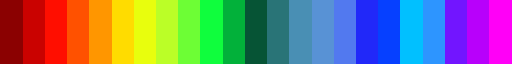

In [319]:
# Basis colors
basis_colors = [
    '#8b0101', '#ff0300', '#ff7f00', '#ffff00', '#acfe30', '#00ff3f',
    '#065535', '#478faf', '#6395ec', '#0900ff', '#00ebff', '#7e00ff', '#ff00f7'
]

# Create the custom colormap
cmap = mplcol.LinearSegmentedColormap.from_list('custom_colormap', basis_colors, N=23)
boundaries = np.arange(2001, 2025, 1)
norm = mplcol.BoundaryNorm(boundaries, cmap.N, clip=True)
cmap

In [320]:
df['TOP'] = df.BOUNDS.apply(lambda x: ast.literal_eval(x)[-1])

In [67]:
df.BOUNDS.apply(lambda x: ast.literal_eval(x)[-1]).min()

58.01675

In [321]:
counts_large = df.groupby('YEAR').aggregate({'YEAR':'count'}).rename(columns={'YEAR': 'COUNT'}).sort_values(by='COUNT', ascending=False) 
counts_large

,COUNT
YEAR,
2012,982
2020,774
2003,731
2011,712
2009,650
2005,627
2006,620
2013,601
2002,594


In [ ]:
counts_large.sum()

COUNT    11354
dtype: int64

In [69]:
df.query('TOP > 66.5').groupby('YEAR').aggregate({'YEAR':'count'})

,YEAR
YEAR,
2001,119
2002,65
2003,38
2004,14
2005,93
2006,26
2007,25
2008,7
2009,56


In [68]:
df.query('TOP > 66.5').aggregate({'YEAR':'count'})

YEAR    1184
dtype: int64

In [96]:
df.query('TOP > 66.5').groupby('YEAR').aggregate({'YEAR':'count'}) / df.query('TOP > 66.5').aggregate({'YEAR':'count'}) * 100

,YEAR
YEAR,
2001,10.050676
2002,5.489865
2003,3.209459
2004,1.182432
2005,7.854730
2006,2.195946
2007,2.111486
2008,0.591216
2009,4.729730


In [507]:
df.query('TOP > 66.5').groupby('YEAR').aggregate({'YEAR':'count'}) / df.query('TOP <= 66.5').groupby('YEAR').aggregate({'YEAR':'count'})

,YEAR
YEAR,
2001,0.313539
2002,0.115450
2003,0.057641
2004,0.039660
2005,0.184801
2006,0.048232
2007,0.105263
2008,0.015982
2009,0.087827


In [94]:
def custom_agg(x):
    return np.quantile(x, 0.75)

In [204]:
df.groupby('YEAR').aggregate({'TOP': custom_agg})

,TOP
YEAR,
2001,66.377500
2002,64.178750
2003,64.728500
2004,62.657250
2005,65.185125
2006,63.350813
2007,65.334250
2008,62.112000
2009,63.711687


In [70]:
boundaries = np.arange(2001, 2025, 1)
norm = mplcol.BoundaryNorm(boundaries, cmap.N, clip=True)
cmap(norm(boundaries[:-1]))

array([[0.54509804, 0.00392157, 0.00392157, 1.        ],
       [0.79322638, 0.00819964, 0.00178253, 1.        ],
       [1.        , 0.05597148, 0.        , 1.        ],
       [1.        , 0.32121212, 0.        , 1.        ],
       [1.        , 0.58930481, 0.        , 1.        ],
       [1.        , 0.8631016 , 0.        , 1.        ],
       [0.91122995, 0.99893048, 0.0513369 , 1.        ],
       [0.73368984, 0.99679144, 0.1540107 , 1.        ],
       [0.42923351, 0.99750446, 0.20962567, 1.        ],
       [0.06131907, 0.99964349, 0.24171123, 1.        ],
       [0.01069519, 0.6969697 , 0.22923351, 1.        ],
       [0.02352941, 0.33333333, 0.20784314, 1.        ],
       [0.16256684, 0.4573975 , 0.4688057 , 1.        ],
       [0.28841355, 0.56292335, 0.70802139, 1.        ],
       [0.3483066 , 0.57575758, 0.83850267, 1.        ],
       [0.32406417, 0.47807487, 0.93903743, 1.        ],
       [0.1315508 , 0.15935829, 0.97967914, 1.        ],
       [0.02566845, 0.2513369 ,

In [281]:
year_counts = df['YEAR'].value_counts().sort_index()
df['Frequency'] = df['YEAR'].map(year_counts) / year_counts.max()
df

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR,TOP,Frequency
0,TILE-64N126E_00039,"[127.26425, 62.523, 128.19225, 63.34]",2.031393e+09,0,188,246,59,205.0,206.646582,43.240630,0.0,2001,63.34000,0.517312
1,TILE-64N123E_00001,"[124.09575, 63.902, 125.5105, 64.41925]",1.688750e+09,0,185,246,62,205.0,211.014591,47.827867,0.0,2001,64.41925,0.517312
2,TILE-68N150E_00003,"[152.63875, 66.39125, 153.75325, 67.156]",1.549591e+09,1,185,231,47,206.0,205.868866,25.863623,0.0,2001,67.15600,0.517312
3,TILE-68N132E_00084,"[133.8755, 66.83775, 135.20325, 67.35775]",1.403954e+09,1,161,228,68,208.0,206.514602,19.034396,0.0,2001,67.35775,0.517312
4,TILE-66N156E_00011,"[156.6025, 64.18675, 157.6205, 64.7685]",1.199344e+09,0,199,218,20,216.0,213.523161,17.142477,0.0,2001,64.76850,0.517312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11349,TILE-62N075E_00066,"[77.78375, 60.47425, 77.85925, 60.51375]",1.037598e+07,0,134,135,2,134.0,134.482109,55.198974,0.0,2023,60.51375,0.345214
11350,TILE-64N063E_00005,"[65.1425, 63.891, 65.2975, 63.92575]",1.036334e+07,0,139,143,5,142.0,141.467025,56.019171,0.0,2023,63.92575,0.345214
11351,TILE-68N153E_00160,"[153.61325, 66.66175, 153.718, 66.72925]",1.027767e+07,0,212,239,28,226.0,225.500599,47.113232,0.0,2023,66.72925,0.345214
11352,TILE-62N120E_00260,"[120.80175, 60.272, 120.9135, 60.3055]",1.021572e+07,0,180,189,10,182.0,182.306059,50.116287,0.0,2023,60.30550,0.345214


#### 1.1) Violin plot

/tmp/ipykernel_2856134/2239077044.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(Years, rotation=45);


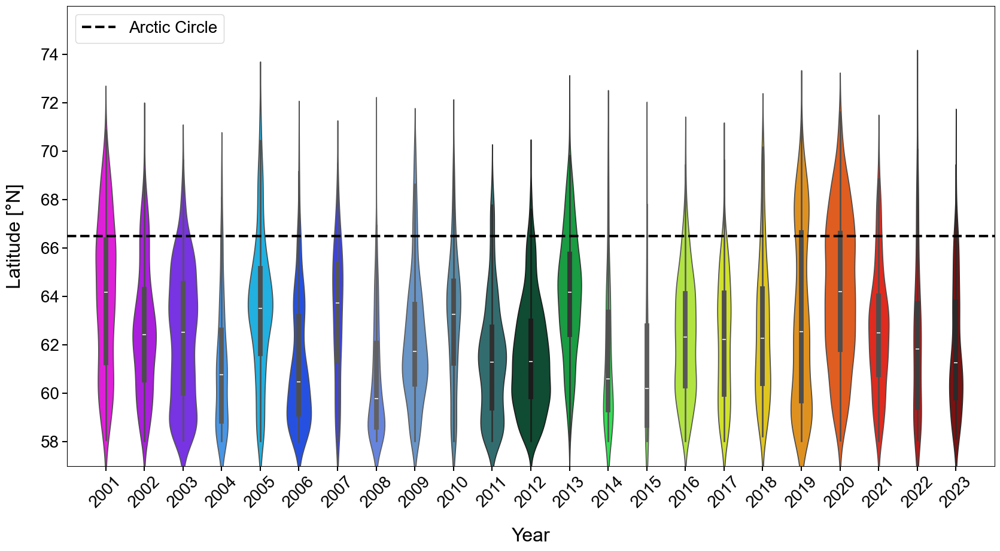

In [282]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
i = 0
for category, subset in df.groupby('YEAR'):
    sns.violinplot(
        x=subset['YEAR'],
        y=subset['TOP'],
        data=subset,
        width=subset['Frequency'].iloc[0],  # Use scaled width
        ax=ax,
        color=cmap.reversed()(norm(boundaries[i])),
    )
    # sns.stripplot(data=subset, x=subset['YEAR'], y=subset['TOP'], color="black", size=10, alpha=0.7)
    i += 1
ax.set_ylim(57, 75)
ax.set_xticklabels(Years, rotation=45);
ax.set_ylabel('Latitude [°N]', size=23, labelpad=20);
ax.set_xlabel('Year', size=23, labelpad=20);
ax.tick_params(labelsize = 20, size=6, width=1.5)
ax.set_ylim(57, 76)
ax.plot(np.arange(-1, 24), np.repeat(66.5, 25), color='k', lw=3, linestyle='--', label='Arctic Circle')
ax.set_xlim(-1, 23)
ax.legend(fontsize=20, loc="upper left")
ax.set_yticks(np.arange(58, 75, 2));
plt.savefig(f'{local_path}/Plots/Violinplot_North_LargeFires.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

### 2) Purcentage of overwintering

In [195]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
theshold = 1000 * 1e4
Years = np.arange(2001, 2024)
df = pd.DataFrame([])
AREA_stats = {}
for year in Years[:]:
    new = pd.read_csv(f'{local_path}/PeatFire/BG_CC/Patch_stats/BAMT_Siberia_Lndst_Yearly_Patch_Stats_16_{year}.csv')
    new = new.query('AREA >= @theshold')
    new['YEAR'] = year
    df = pd.concat([df, new], ignore_index=True)

In [196]:
df['TILE'] = df.ID.apply(lambda x: x.split('_')[0])
df['PATCH'] = df.ID.apply(lambda x: int(x.split('_')[1]))
df

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR,TILE,PATCH
0,TILE-64N126E_00039,"[127.26425, 62.523, 128.19225, 63.34]",2.031393e+09,0,188,246,59,205.0,206.646582,43.240630,0.0,2001,TILE-64N126E,39
1,TILE-64N123E_00001,"[124.09575, 63.902, 125.5105, 64.41925]",1.688750e+09,0,185,246,62,205.0,211.014591,47.827867,0.0,2001,TILE-64N123E,1
2,TILE-68N150E_00003,"[152.63875, 66.39125, 153.75325, 67.156]",1.549591e+09,1,185,231,47,206.0,205.868866,25.863623,0.0,2001,TILE-68N150E,3
3,TILE-68N132E_00084,"[133.8755, 66.83775, 135.20325, 67.35775]",1.403954e+09,1,161,228,68,208.0,206.514602,19.034396,0.0,2001,TILE-68N132E,84
4,TILE-66N156E_00011,"[156.6025, 64.18675, 157.6205, 64.7685]",1.199344e+09,0,199,218,20,216.0,213.523161,17.142477,0.0,2001,TILE-66N156E,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11347,TILE-62N075E_00066,"[77.78375, 60.47425, 77.85925, 60.51375]",1.037598e+07,0,134,135,2,134.0,134.482109,55.198974,0.0,2023,TILE-62N075E,66
11348,TILE-64N063E_00005,"[65.1425, 63.891, 65.2975, 63.92575]",1.036334e+07,0,139,143,5,142.0,141.467025,56.019171,0.0,2023,TILE-64N063E,5
11349,TILE-68N153E_00160,"[153.61325, 66.66175, 153.718, 66.72925]",1.027767e+07,0,212,239,28,226.0,225.500599,47.113232,0.0,2023,TILE-68N153E,160
11350,TILE-62N120E_00260,"[120.80175, 60.272, 120.9135, 60.3055]",1.021572e+07,0,180,189,10,182.0,182.306059,50.116287,0.0,2023,TILE-62N120E,260


In [221]:
def check_overwinter(tile, year, df_year, inputPath, maxdis=1000, maxdate='0630', res=0.00025, logfile=False):
    if not logfile:
        logfile = io.StringIO() 
    
    lat = int(tile[5:7])
    lon = int(tile[8:11])
    Patches = df_year.query('TILE == @tile').PATCH.values
    Global_Functions.print_and_log(logfile, f"\t\t*** Tile {tile}: {len(Patches)} potential patches ***")
    Ign = df_year.query('TILE == @tile').MIN_JD.values
    with rio.open(f'{inputPath}/ByTile/{tile}/Enhanced/Yearly/BAMT_BA_Siberia_Lndst_{year}_{tile}_JD_Correct_Patches.tif') as rs:
        JD = rs.read(1)
        profile = rs.profile    
    JD[JD < 0] = 0
    with rio.open(f"{inputPath}/ByTile/{tile}/Patches/TIF/BAMT_BA_Siberia_Lndst_Patches-16_{year}_{tile}.tif") as rs:
        labels = rs.read(1)    

    all_labels = np.unique(labels)
    masked_labels = [i for i in all_labels if i not in Patches]
    labels[np.isin(labels, masked_labels)] = 0
    JD[np.isin(labels, masked_labels)] = 0
    for p, d in zip(Patches, Ign):
        # print(p, d, JD[labels == p].min())
        labels[(labels == p) & (JD > maxign)] = 0       ### ideally JD != d but some time there multiple ignitions
    del JD
    distance = Global_Functions.create_buffer(lon, lat-1, maxdis/1000)[0] - lon
    k_lon = int(np.ceil(distance / res))
    k_lat = int(np.ceil(maxdis / 30))
    kernel = (2*k_lon, 2*k_lat)   ### (ncols, nrows) not as for numpy   ### you need to add 1 km in each side so 2*
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel)
    with rio.open(f"{inputPath}/PeatFire/ByTile/{tile}/Pixel/BA_Peatland_{tile}_{year-1}.tif") as rs:
        BA_prev = rs.read(1)    
    BA_prev[BA_prev != 0] = 1
    BA_prev = cv2.dilate(BA_prev, k, iterations=1)
    ids = np.unique(labels * BA_prev)[1:]     ## the first is 0
    over = [f'{tile}_{i:05}' for i in ids]

    with rio.open(f"{inputPath}/PeatMap/Resampled/ByTile/PeatMap_{tile}.tif") as rs:
        peat = rs.read(1)
        p = rs.profile
    val_old = np.array([0, 1, 2, 3, 4])
    val_new = np.array([0, 0, 1, 1, 0])
    masked_labels = [i for i in all_labels if i not in ids]
    labels[np.isin(labels, masked_labels)] = 0
    labels = cv2.dilate(labels, k, iterations=1)
    peat = Global_Functions.replace_numpy_list(peat, val_old, val_new).astype(np.int8)
    peat[BA_prev == 0] = 0
    # Global_Functions.write_rasterio(peat, f"{inputPath}/PeatMap/Trials_{tile}.tif", profile=p)
    ids = np.unique(labels * peat)[1:]   
    peatover = [f'{tile}_{i:05}' for i in ids]
    del BA_prev, labels, peat
   
    logs = {'tile': tile, 'text': logfile.getvalue()}
    results = {'overwintering': over, 'peat-over': peatover}
    return dict(logs, **results)


In [222]:
maxdate = '0630'
year = 2020
kwargs = dict(maxdis=1000, maxdate=maxdate, res=0.00025, logfile=False)
maxign = datetime.strptime(f'{year}{maxdate}', '%Y%m%d').timetuple().tm_yday   
df_year = df.query('YEAR == @year and MIN_JD <= @maxign')
check_overwinter('TILE-64N132E', year, df_year, local_path, **kwargs)

		*** Tile TILE-64N132E: 8 potential patches ***


{'tile': 'TILE-64N132E',
 'text': '\t\t*** Tile TILE-64N132E: 8 potential patches ***\n',
 'overwintering': ['TILE-64N132E_00031', 'TILE-64N132E_00143'],
 'peat-over': ['TILE-64N132E_00031', 'TILE-64N132E_00143']}

In [223]:
maxdate = '0630'
kwargs = dict(maxdis=1000, maxdate=maxdate, res=0.00025, logfile=False)
Years = range(2023, 2001, -1) ## in 2001 there no previous
os.makedirs(f'{local_path}/PeatFire/Logs', exist_ok=True)
LogFile = open(f'{local_path}/PeatFire/Logs/Logfile_Overwintering_Siberia.txt', 'w')
# LogFile = io.StringIO()
Global_Functions.print_and_log(LogFile, 
            f'{30 * "-"} LogFile of Overwintering fires identification {30 * "-"}\n\n')

time0 = datetime.now()
overall = []
for year in list(Years)[:]:
    time1 = datetime.now()
    maxign = datetime.strptime(f'{year}{maxdate}', '%Y%m%d').timetuple().tm_yday   
    df_year = df.query('YEAR == @year and MIN_JD <= @maxign')
    Tiles = np.unique(df_year.TILE) 
    Global_Functions.print_and_log(LogFile, f'''\n{10 * "#"} Processing of Year {year}: 
    {len(Tiles)} tiles with {len(df_year)} potential patches {10 * "#"}''')
    
    listdict = Parallel(n_jobs=16, verbose=100)(delayed(check_overwinter)
                            (tile, year, df_year, local_path, **kwargs) for tile in Tiles)
    listdict.sort(key=operator.itemgetter('tile'))
    [LogFile.write(listdict[i]['text']) for i in range(len(listdict))]
    overwintering = np.concatenate([listdict[i]['overwintering'] for i in range(len(listdict))])
    peatover = np.concatenate([listdict[i]['peat-over'] for i in range(len(listdict))])
    overall.append([overwintering, peatover])
    Global_Functions.print_and_log(LogFile, f"""\t\t+++ Number of overwintering: 
    {np.count_nonzero(overwintering)} out of {len(df.query('YEAR == @year'))} *** """)
    Global_Functions.print_and_log(LogFile, f"""\t\t+++ Number of peat-related overwintering: 
    {np.count_nonzero(peatover)} out of {len(df.query('YEAR == @year'))} *** """)
    time2 = datetime.now()
    delta = time2 - time1
    hours, minutes, seconds = Global_Functions.convert_timedelta(delta)
    Global_Functions.print_and_log(LogFile, '\n%s Year %s is processed in %s hours, %s minutes, %s seconds %s '
                                  %(10 *'#', year, hours, minutes, seconds, 10 * '#'))    
timef = datetime.now()
delta = timef - time0    
hours, minutes, seconds = Global_Functions.convert_timedelta(delta)
Global_Functions.print_and_log(LogFile, '\n\n%s FINISHED in %s hours, %s minutes, %s seconds %s'
                          %(20 *'-', hours, minutes, seconds, 20 * '-'))    
LogFile.close()

------------------------------ LogFile of Overwintering fires identification ------------------------------



########## Processing of Year 2023: 
    54 tiles with 178 potential patches ##########
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   1 tasks      | elapsed:   51.0s
[Parallel(n_jobs=16)]: Done   2 tasks      | elapsed:   56.4s
[Parallel(n_jobs=16)]: Done   3 tasks      | elapsed:   59.4s
[Parallel(n_jobs=16)]: Done   4 tasks      | elapsed:  1.0min
[Parallel(n_jobs=16)]: Done   5 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done   6 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done   7 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done   8 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done  10 tasks      | elapsed:  1.2min
[Parallel(n_jobs=16)]: Done  11 tasks      | elapsed:  1.4min
[Parallel(n_jobs=16)]: Done  12 tasks     

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N078E: 11 potential patches ***
		*** Tile TILE-62N153E: 1 potential patches ***
		*** Tile TILE-66N144E: 1 potential patches ***
		*** Tile TILE-60N099E: 1 potential patches ***
		*** Tile TILE-66N111E: 1 potential patches ***
		*** Tile TILE-60N090E: 2 potential patches ***
		*** Tile TILE-62N114E: 2 potential patches ***
		*** Tile TILE-62N156E: 1 potential patches ***
		*** Tile TILE-64N147E: 2 potential patches ***
		*** Tile TILE-68N141E: 2 potential patches ***
		*** Tile TILE-62N063E: 1 potential patches ***
		*** Tile TILE-62N165E: 8 potential patches ***
		*** Tile TILE-64N159E: 7 potential patches ***
		*** Tile TILE-66N105E: 8 potential patches ***
		*** Tile TILE-66N147E: 5 potential patches ***
		*** Tile TILE-68N111E: 1 potential patches ***
		*** Tile TILE-68N144E: 2 potential patches ***
		*** Tile TILE-70N138E: 7 potential patches ***
		*** Tile TILE-72N141E: 1 potential patches ***
		*** Tile TILE-60N132E: 1 potential patches ***
		*** Tile TILE-62N

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N132E: 1 potential patches ***
		*** Tile TILE-62N147E: 10 potential patches ***
		*** Tile TILE-64N153E: 7 potential patches ***
		*** Tile TILE-60N078E: 1 potential patches ***
		*** Tile TILE-64N108E: 5 potential patches ***
		*** Tile TILE-70N129E: 1 potential patches ***
		*** Tile TILE-60N078E: 1 potential patches ***
		*** Tile TILE-62N144E: 1 potential patches ***
		*** Tile TILE-64N132E: 6 potential patches ***
		*** Tile TILE-68N117E: 1 potential patches ***
		*** Tile TILE-60N096E: 2 potential patches ***
		*** Tile TILE-64N099E: 3 potential patches ***
		*** Tile TILE-64N162E: 7 potential patches ***
		*** Tile TILE-66N129E: 5 potential patches ***
		*** Tile TILE-66N165E: 4 potential patches ***
		*** Tile TILE-68N153E: 3 potential patches ***
		*** Tile TILE-70N135E: 3 potential patches ***
		*** Tile TILE-72N144E: 3 potential patches ***
		*** Tile TILE-60N141E: 2 potential patches ***
		*** Tile TILE-62N093E: 1 potential patches ***
		*** Tile TILE-66N

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N129E: 4 potential patches ***
		*** Tile TILE-64N063E: 5 potential patches ***
		*** Tile TILE-68N153E: 1 potential patches ***
		*** Tile TILE-62N069E: 1 potential patches ***
		*** Tile TILE-64N111E: 1 potential patches ***
		*** Tile TILE-70N171E: 1 potential patches ***
		*** Tile TILE-60N138E: 1 potential patches ***
		*** Tile TILE-62N105E: 3 potential patches ***
		*** Tile TILE-64N120E: 6 potential patches ***
		*** Tile TILE-66N135E: 7 potential patches ***
		*** Tile TILE-70N132E: 1 potential patches ***
		*** Tile TILE-60N105E: 1 potential patches ***
		*** Tile TILE-62N168E: 2 potential patches ***
		*** Tile TILE-64N138E: 1 potential patches ***
		*** Tile TILE-66N099E: 3 potential patches ***
		*** Tile TILE-66N150E: 2 potential patches ***
		*** Tile TILE-68N117E: 2 potential patches ***
		*** Tile TILE-68N165E: 2 potential patches ***
		*** Tile TILE-70N150E: 3 potential patches ***
		*** Tile TILE-60N093E: 2 potential patches ***
		*** Tile TILE-64N1

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-62N069E: 5 potential patches ***
		*** Tile TILE-62N159E: 2 potential patches ***
		*** Tile TILE-66N153E: 3 potential patches ***
		*** Tile TILE-60N126E: 1 potential patches ***
		*** Tile TILE-66N108E: 1 potential patches ***
		*** Tile TILE-60N066E: 7 potential patches ***
		*** Tile TILE-62N141E: 4 potential patches ***
		*** Tile TILE-64N123E: 5 potential patches ***
		*** Tile TILE-66N129E: 2 potential patches ***
		*** Tile TILE-68N144E: 1 potential patches ***
		*** Tile TILE-60N126E: 1 potential patches ***
		*** Tile TILE-62N144E: 1 potential patches ***
		*** Tile TILE-64N135E: 14 potential patches ***
		*** Tile TILE-66N126E: 6 potential patches ***
		*** Tile TILE-68N099E: 1 potential patches ***
		*** Tile TILE-68N156E: 2 potential patches ***
		*** Tile TILE-70N162E: 2 potential patches ***
		*** Tile TILE-60N111E: 2 potential patches ***
		*** Tile TILE-62N120E: 1 potential patches ***
		*** Tile TILE-66N147E: 1 potential patches ***
		*** Tile TILE-68N

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N087E: 1 potential patches ***
		*** Tile TILE-62N078E: 1 potential patches ***
		*** Tile TILE-64N135E: 1 potential patches ***
		*** Tile TILE-66N147E: 1 potential patches ***
		*** Tile TILE-60N129E: 5 potential patches ***
		*** Tile TILE-66N159E: 2 potential patches ***
		*** Tile TILE-60N081E: 1 potential patches ***
		*** Tile TILE-62N069E: 3 potential patches ***
		*** Tile TILE-62N165E: 3 potential patches ***
		*** Tile TILE-64N162E: 2 potential patches ***
		*** Tile TILE-66N123E: 1 potential patches ***
		*** Tile TILE-68N159E: 3 potential patches ***
		*** Tile TILE-60N135E: 3 potential patches ***
		*** Tile TILE-64N108E: 5 potential patches ***
		*** Tile TILE-64N174E: 1 potential patches ***
		*** Tile TILE-66N141E: 4 potential patches ***
		*** Tile TILE-68N120E: 3 potential patches ***
		*** Tile TILE-70N108E: 3 potential patches ***
		*** Tile TILE-70N153E: 1 potential patches ***
		*** Tile TILE-60N105E: 3 potential patches ***
		*** Tile TILE-64N1

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N069E: 2 potential patches ***
		*** Tile TILE-62N117E: 1 potential patches ***
		*** Tile TILE-64N147E: 2 potential patches ***
		*** Tile TILE-70N129E: 1 potential patches ***
		*** Tile TILE-60N132E: 2 potential patches ***
		*** Tile TILE-64N114E: 1 potential patches ***
		*** Tile TILE-72N135E: 1 potential patches ***
		*** Tile TILE-60N135E: 6 potential patches ***
		*** Tile TILE-62N111E: 2 potential patches ***
		*** Tile TILE-64N117E: 14 potential patches ***
		*** Tile TILE-66N111E: 2 potential patches ***
		*** Tile TILE-68N135E: 1 potential patches ***
		*** Tile TILE-60N099E: 6 potential patches ***
		*** Tile TILE-64N126E: 2 potential patches ***
		*** Tile TILE-66N108E: 9 potential patches ***
		*** Tile TILE-66N168E: 2 potential patches ***
		*** Tile TILE-68N147E: 7 potential patches ***
		*** Tile TILE-70N144E: 3 potential patches ***
		*** Tile TILE-60N108E: 3 potential patches ***
		*** Tile TILE-64N135E: 2 potential patches ***
		*** Tile TILE-68N

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N066E: 5 potential patches ***
		*** Tile TILE-64N066E: 3 potential patches ***
		*** Tile TILE-68N156E: 1 potential patches ***
		*** Tile TILE-60N138E: 4 potential patches ***
		*** Tile TILE-64N081E: 1 potential patches ***
		*** Tile TILE-68N162E: 1 potential patches ***
		*** Tile TILE-60N069E: 2 potential patches ***
		*** Tile TILE-60N150E: 1 potential patches ***
		*** Tile TILE-62N150E: 1 potential patches ***
		*** Tile TILE-64N144E: 1 potential patches ***
		*** Tile TILE-68N138E: 1 potential patches ***
		*** Tile TILE-60N132E: 3 potential patches ***
		*** Tile TILE-64N123E: 1 potential patches ***
		*** Tile TILE-64N168E: 6 potential patches ***
		*** Tile TILE-66N132E: 6 potential patches ***
		*** Tile TILE-66N177E: 1 potential patches ***
		*** Tile TILE-68N150E: 17 potential patches ***
		*** Tile TILE-70N123E: 2 potential patches ***
		*** Tile TILE-72N108E: 1 potential patches ***
		*** Tile TILE-60N099E: 4 potential patches ***
		*** Tile TILE-64N

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-62N063E: 3 potential patches ***
		*** Tile TILE-62N144E: 3 potential patches ***
		*** Tile TILE-64N168E: 3 potential patches ***
		*** Tile TILE-60N090E: 3 potential patches ***
		*** Tile TILE-66N117E: 1 potential patches ***
		*** Tile TILE-60N114E: 2 potential patches ***
		*** Tile TILE-62N129E: 3 potential patches ***
		*** Tile TILE-64N129E: 3 potential patches ***
		*** Tile TILE-66N126E: 4 potential patches ***
		*** Tile TILE-70N141E: 1 potential patches ***
		*** Tile TILE-62N066E: 1 potential patches ***
		*** Tile TILE-64N132E: 8 potential patches ***
		*** Tile TILE-66N117E: 1 potential patches ***
		*** Tile TILE-66N171E: 3 potential patches ***
		*** Tile TILE-68N141E: 3 potential patches ***
		*** Tile TILE-70N120E: 1 potential patches ***
		*** Tile TILE-72N111E: 4 potential patches ***
		*** Tile TILE-60N066E: 6 potential patches ***
		*** Tile TILE-64N129E: 2 potential patches ***
		*** Tile TILE-66N150E: 1 potential patches ***
		*** Tile TILE-68N1

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N141E: 1 potential patches ***
		*** Tile TILE-62N072E: 4 potential patches ***
		*** Tile TILE-64N141E: 3 potential patches ***
		*** Tile TILE-68N159E: 1 potential patches ***
		*** Tile TILE-60N135E: 7 potential patches ***
		*** Tile TILE-68N159E: 2 potential patches ***
		*** Tile TILE-60N132E: 8 potential patches ***
		*** Tile TILE-62N123E: 6 potential patches ***
		*** Tile TILE-64N126E: 2 potential patches ***
		*** Tile TILE-66N114E: 2 potential patches ***
		*** Tile TILE-68N147E: 1 potential patches ***
		*** Tile TILE-62N105E: 5 potential patches ***
		*** Tile TILE-64N129E: 2 potential patches ***
		*** Tile TILE-66N111E: 4 potential patches ***
		*** Tile TILE-68N105E: 6 potential patches ***
		*** Tile TILE-68N174E: 4 potential patches ***
		*** Tile TILE-70N165E: 1 potential patches ***
		*** Tile TILE-60N117E: 3 potential patches ***
		*** Tile TILE-62N165E: 2 potential patches ***
		*** Tile TILE-66N177E: 1 potential patches ***
		*** Tile TILE-70N1

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N063E: 9 potential patches ***
		*** Tile TILE-62N138E: 4 potential patches ***
		*** Tile TILE-64N156E: 2 potential patches ***
		*** Tile TILE-70N138E: 1 potential patches ***
		*** Tile TILE-62N105E: 1 potential patches ***
		*** Tile TILE-64N135E: 1 potential patches ***
		*** Tile TILE-60N063E: 4 potential patches ***
		*** Tile TILE-62N120E: 9 potential patches ***
		*** Tile TILE-64N135E: 11 potential patches ***
		*** Tile TILE-68N120E: 1 potential patches ***
		*** Tile TILE-60N081E: 1 potential patches ***
		*** Tile TILE-62N135E: 2 potential patches ***
		*** Tile TILE-64N150E: 6 potential patches ***
		*** Tile TILE-66N102E: 2 potential patches ***
		*** Tile TILE-66N153E: 6 potential patches ***
		*** Tile TILE-68N129E: 10 potential patches ***
		*** Tile TILE-70N129E: 7 potential patches ***
		*** Tile TILE-72N126E: 2 potential patches ***
		*** Tile TILE-60N120E: 1 potential patches ***
		*** Tile TILE-62N129E: 1 potential patches ***
		*** Tile TILE-66

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N135E: 5 potential patches ***
		*** Tile TILE-62N150E: 8 potential patches ***
		*** Tile TILE-66N141E: 4 potential patches ***
		*** Tile TILE-60N093E: 1 potential patches ***
		*** Tile TILE-62N141E: 1 potential patches ***
		*** Tile TILE-66N114E: 1 potential patches ***
		*** Tile TILE-60N129E: 6 potential patches ***
		*** Tile TILE-62N138E: 3 potential patches ***
		*** Tile TILE-64N105E: 2 potential patches ***
		*** Tile TILE-64N165E: 2 potential patches ***
		*** Tile TILE-66N141E: 4 potential patches ***
		*** Tile TILE-70N171E: 1 potential patches ***
		*** Tile TILE-62N126E: 1 potential patches ***
		*** Tile TILE-64N105E: 7 potential patches ***
		*** Tile TILE-64N153E: 12 potential patches ***
		*** Tile TILE-66N096E: 1 potential patches ***
		*** Tile TILE-66N135E: 15 potential patches ***
		*** Tile TILE-68N102E: 1 potential patches ***
		*** Tile TILE-68N138E: 5 potential patches ***
		*** Tile TILE-70N132E: 10 potential patches ***
		*** Tile TILE-7

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N150E: 1 potential patches ***
		*** Tile TILE-62N141E: 4 potential patches ***
		*** Tile TILE-66N138E: 1 potential patches ***
		*** Tile TILE-60N120E: 1 potential patches ***
		*** Tile TILE-64N144E: 1 potential patches ***
		*** Tile TILE-72N117E: 1 potential patches ***
		*** Tile TILE-60N120E: 7 potential patches ***
		*** Tile TILE-60N144E: 1 potential patches ***
		*** Tile TILE-62N126E: 6 potential patches ***
		*** Tile TILE-64N111E: 6 potential patches ***
		*** Tile TILE-64N171E: 1 potential patches ***
		*** Tile TILE-66N156E: 1 potential patches ***
		*** Tile TILE-60N093E: 2 potential patches ***
		*** Tile TILE-62N132E: 2 potential patches ***
		*** Tile TILE-64N156E: 5 potential patches ***
		*** Tile TILE-66N144E: 3 potential patches ***
		*** Tile TILE-68N135E: 9 potential patches ***
		*** Tile TILE-70N126E: 3 potential patches ***
		*** Tile TILE-72N114E: 1 potential patches ***
		*** Tile TILE-60N102E: 2 potential patches ***
		*** Tile TILE-62N1

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


		*** Tile TILE-60N081E: 4 potential patches ***
		*** Tile TILE-62N132E: 1 potential patches ***
		*** Tile TILE-66N156E: 3 potential patches ***
		*** Tile TILE-60N114E: 1 potential patches ***
		*** Tile TILE-64N105E: 1 potential patches ***
		*** Tile TILE-70N126E: 1 potential patches ***
		*** Tile TILE-60N105E: 2 potential patches ***
		*** Tile TILE-62N135E: 10 potential patches ***
		*** Tile TILE-64N159E: 3 potential patches ***
		*** Tile TILE-66N153E: 1 potential patches ***
		*** Tile TILE-60N063E: 1 potential patches ***
		*** Tile TILE-64N066E: 1 potential patches ***
		*** Tile TILE-64N141E: 1 potential patches ***
		*** Tile TILE-66N123E: 3 potential patches ***
		*** Tile TILE-66N162E: 2 potential patches ***
		*** Tile TILE-68N126E: 2 potential patches ***
		*** Tile TILE-68N162E: 10 potential patches ***
		*** Tile TILE-70N147E: 4 potential patches ***
		*** Tile TILE-60N078E: 1 potential patches ***
		*** Tile TILE-62N069E: 2 potential patches ***
		*** Tile TILE-66

/home/amin/anaconda3/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [224]:
df['Overwintering'] = 0
df['PeatOver'] = 0
for i, year in enumerate(list(Years)[:]):
    for j in range(len(overall[i][0])):
        df.loc[(df.YEAR == year) & (df.ID==overall[i][0][j]), "Overwintering"] = 1
    for j in range(len(overall[i][1])):
        df.loc[(df.YEAR == year) & (df.ID==overall[i][1][j]), "PeatOver"] = 1
df

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR,TILE,PATCH,Overwintering,PeatOver
0,TILE-64N126E_00039,"[127.26425, 62.523, 128.19225, 63.34]",2.031393e+09,0,188,246,59,205,206.646582,43.240630,0.0,2001,TILE-64N126E,39,0,0
1,TILE-64N123E_00001,"[124.09575, 63.902, 125.5105, 64.41925]",1.688750e+09,0,185,246,62,205,211.014591,47.827867,0.0,2001,TILE-64N123E,1,0,0
2,TILE-68N150E_00003,"[152.63875, 66.39125, 153.75325, 67.156]",1.549591e+09,1,185,231,47,206,205.868866,25.863623,0.0,2001,TILE-68N150E,3,0,0
3,TILE-68N132E_00084,"[133.8755, 66.83775, 135.20325, 67.35775]",1.403954e+09,1,161,228,68,208,206.514602,19.034396,0.0,2001,TILE-68N132E,84,0,0
4,TILE-66N156E_00011,"[156.6025, 64.18675, 157.6205, 64.7685]",1.199344e+09,0,199,218,20,216,213.523161,17.142477,0.0,2001,TILE-66N156E,11,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11347,TILE-62N075E_00066,"[77.78375, 60.47425, 77.85925, 60.51375]",1.037598e+07,0,134,135,2,134,134.482109,55.198974,0.0,2023,TILE-62N075E,66,0,0
11348,TILE-64N063E_00005,"[65.1425, 63.891, 65.2975, 63.92575]",1.036334e+07,0,139,143,5,142,141.467025,56.019171,0.0,2023,TILE-64N063E,5,0,0
11349,TILE-68N153E_00160,"[153.61325, 66.66175, 153.718, 66.72925]",1.027767e+07,0,212,239,28,226,225.500599,47.113232,0.0,2023,TILE-68N153E,160,0,0
11350,TILE-62N120E_00260,"[120.80175, 60.272, 120.9135, 60.3055]",1.021572e+07,0,180,189,10,182,182.306059,50.116287,0.0,2023,TILE-62N120E,260,0,0


In [231]:
# df.to_csv(f'{local_path}/PeatFire/BG_CC/Patch_stats/Siberia_Overwintering_LargeFires.csv', index=False)

In [201]:
df.query('Overwintering == 1 & YEAR == 2020').sort_values('TILE', ascending=True)

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR,TILE,PATCH,Overwintering
10287,TILE-60N063E_00047,"[63.3455, 58.048, 63.47725, 58.0925]",1.049012e+07,0,127,130,4,130,129.295931,3.925892,0.000000e+00,2020,TILE-60N063E,47,1
9631,TILE-64N132E_00031,"[134.47175, 63.4535, 134.8205, 63.59375]",1.415049e+08,0,180,222,43,198,196.922649,14.709081,0.000000e+00,2020,TILE-64N132E,31,1
9531,TILE-64N132E_00143,"[134.11875, 61.84775, 135.843, 62.6075]",2.391069e+09,1,170,271,102,212,212.143195,10.565367,0.000000e+00,2020,TILE-64N132E,143,1
9685,TILE-64N135E_00172,"[135.69525, 62.0715, 135.99125, 62.22075]",9.172548e+07,0,175,183,9,180,179.922561,30.656605,0.000000e+00,2020,TILE-64N135E,172,1
9872,TILE-64N150E_00032,"[152.2895, 62.6815, 152.45075, 62.78675]",3.467235e+07,0,165,174,10,167,167.349597,67.913097,1.984446e+07,2020,TILE-64N150E,32,1
9842,TILE-64N156E_00012,"[156.69525, 62.57525, 156.8835, 62.655]",3.933272e+07,0,175,183,9,178,178.273816,1.433560,0.000000e+00,2020,TILE-64N156E,12,1
9770,TILE-64N165E_00017,"[165.83875, 63.261, 166.06325, 63.3445]",5.581253e+07,0,173,184,12,181,180.036794,1.433698,0.000000e+00,2020,TILE-64N165E,17,1
9705,TILE-66N123E_00064,"[125.5425, 64.96375, 125.77025, 65.0705]",7.657721e+07,0,172,193,22,191,188.793455,21.457095,0.000000e+00,2020,TILE-66N123E,64,1
9694,TILE-66N126E_00061,"[126.20475, 65.388, 126.40675, 65.564]",8.167425e+07,0,175,193,19,183,185.084805,0.231944,0.000000e+00,2020,TILE-66N126E,61,1
9667,TILE-66N126E_00100,"[128.4645, 64.17475, 128.77125, 64.29325]",1.033771e+08,0,180,199,20,188,188.730139,8.526816,0.000000e+00,2020,TILE-66N126E,100,1


In [4]:
local_path = '/media/amin/DISK6T/PhD/Landsat_BA/Siberia'
df = pd.read_csv(f'{local_path}/PeatFire/BG_CC/Patch_stats/Siberia_Overwintering_LargeFires.csv')
df

,ID,BOUNDS,AREA,DUPPLICATED,MIN_JD,MAX_JD,DURATION,MED_JD,MEAN_JD,PEAT_FRACTION,PEAT_CONFIDENT,YEAR,TILE,PATCH,Overwintering,PeatOver,PEAT
0,TILE-64N126E_00039,"[127.26425, 62.523, 128.19225, 63.34]",2.031393e+09,0,188,246,59,205,206.646582,43.240630,0.0,2001,TILE-64N126E,39,0,0,8.783873e+08
1,TILE-64N123E_00001,"[124.09575, 63.902, 125.5105, 64.41925]",1.688750e+09,0,185,246,62,205,211.014591,47.827867,0.0,2001,TILE-64N123E,1,0,0,8.076929e+08
2,TILE-68N150E_00003,"[152.63875, 66.39125, 153.75325, 67.156]",1.549591e+09,1,185,231,47,206,205.868866,25.863623,0.0,2001,TILE-68N150E,3,0,0,4.007804e+08
3,TILE-68N132E_00084,"[133.8755, 66.83775, 135.20325, 67.35775]",1.403954e+09,1,161,228,68,208,206.514602,19.034396,0.0,2001,TILE-68N132E,84,0,0,2.672342e+08
4,TILE-66N156E_00011,"[156.6025, 64.18675, 157.6205, 64.7685]",1.199344e+09,0,199,218,20,216,213.523161,17.142477,0.0,2001,TILE-66N156E,11,0,0,2.055973e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11347,TILE-62N075E_00066,"[77.78375, 60.47425, 77.85925, 60.51375]",1.037598e+07,0,134,135,2,134,134.482109,55.198974,0.0,2023,TILE-62N075E,66,0,0,5.727433e+06
11348,TILE-64N063E_00005,"[65.1425, 63.891, 65.2975, 63.92575]",1.036334e+07,0,139,143,5,142,141.467025,56.019171,0.0,2023,TILE-64N063E,5,0,0,5.805460e+06
11349,TILE-68N153E_00160,"[153.61325, 66.66175, 153.718, 66.72925]",1.027767e+07,0,212,239,28,226,225.500599,47.113232,0.0,2023,TILE-68N153E,160,0,0,4.842143e+06
11350,TILE-62N120E_00260,"[120.80175, 60.272, 120.9135, 60.3055]",1.021572e+07,0,180,189,10,182,182.306059,50.116287,0.0,2023,TILE-62N120E,260,0,0,5.119742e+06


In [5]:
len(df.loc[df.Overwintering == 1]), len(df.loc[df.Overwintering == 1]) / len(df.loc[df.YEAR > 2001]) * 100, len(df.loc[df.YEAR == 2001])

(770, 7.100700848395427, 508)

In [436]:
df.loc[df.Overwintering == 1].groupby('YEAR').count().ID / df.groupby('YEAR').count().ID * 100

YEAR
2001          NaN
2002     3.040541
2003     3.830369
2004    19.108280
2005     5.263158
2006     6.290323
2007     3.088803
2008     5.140187
2009     9.846154
2010     9.014085
2011    17.837079
2012    10.386965
2013     6.322795
2014     4.435484
2015     7.317073
2016     0.366300
2017     4.105572
2018     4.591837
2019     5.555556
2020     6.201550
2021     9.356725
2022     2.525253
2023     5.899705
Name: ID, dtype: float64

In [227]:
df['PEAT'] = df['AREA'] * df['PEAT_FRACTION'] / 100
df.groupby('Overwintering').mean().PEAT_FRACTION

/tmp/ipykernel_6265/2397055199.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby('Overwintering').mean().PEAT_FRACTION


Overwintering
0    24.833526
1    31.236039
Name: PEAT_FRACTION, dtype: float64

In [33]:
m = [*list(range(20)), 21, 22]
stats.pearsonr(timeseries.BA_Area, large), stats.pearsonr(timeseries.BA_Area.values[m], large[m])

((0.7393273685735953, 5.562711260242276e-05),
 (0.8265391403660614, 2.129538143695081e-06))

In [15]:
a = df.groupby('YEAR').sum().AREA / timeseries.BA_Area * 1e-10 * 100
a.mean(), a

/tmp/ipykernel_6265/3895072506.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  a = df.groupby('YEAR').sum().AREA / timeseries.BA_Area * 1e-10 * 100


(88.95841030649946,
 YEAR
 2001    94.582857
 2002    94.965045
 2003    94.224832
 2004    79.237546
 2005    86.350832
 2006    90.539035
 2007    82.033031
 2008    90.122501
 2009    88.672653
 2010    91.994841
 2011    88.907658
 2012    92.449194
 2013    90.544800
 2014    93.395574
 2015    48.520823
 2016    93.271035
 2017    90.517112
 2018    91.806479
 2019    95.388497
 2020    94.053756
 2021    96.618456
 2022    90.246334
 2023    87.600545
 dtype: float64)

In [284]:
df.AREA.sum() / timeseries.BA_Area.sum() * 1e-10 * 100

92.20318156937498

### 3) Large fires and overwintering 

In [9]:
over = np.unique(df.query('Overwintering == 1').YEAR, return_counts=True)[1]
large = np.unique(df.YEAR, return_counts=True)[1]
areas_large = df.groupby('YEAR').AREA.sum() * 1e-10

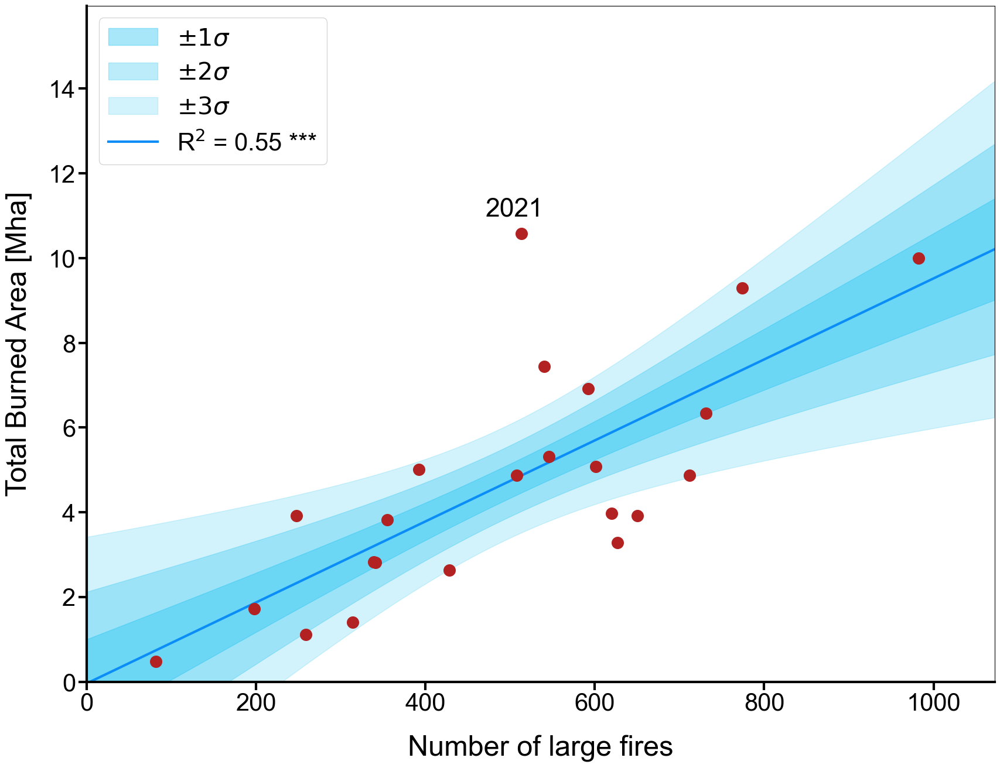

In [429]:
import statsmodels.api as sm
from adjustText import adjust_text

confidence = [[r"$\pm 1\sigma$", 0.3173, 0.4],
             [r"$\pm 2\sigma$", 0.0455, 0.3],
             [r"$\pm 3\sigma$",0.0027, 0.2]]
fig, ax = plt.subplots(1, 1, figsize=(20, 15))
x, y = large, timeseries.BA_Area 
ax.scatter(x, y, 
   marker='o', color='firebrick', edgecolor='firebrick', zorder=3, s=200)
x_edge = (x.max() - x.min()) * 0.1
ax.set_xlim(x.min()-x_edge, x.max()+x_edge)
x_curve = np.linspace(x.min()-x_edge, x.max()+x_edge, 100)  # More points for a smooth curve
model = sm.OLS(y, sm.add_constant(x)).fit()        
y_fit = model.predict(sm.add_constant(x))
# p_value = stats.chi2.sf(model.pearson_chi2, model.df_model)
p_value = model.pvalues[1]
slope = model.params.iloc[1]
intercept = model.params.iloc[0]
r2 = metrics.r2_score(y, y_fit)
# print(r2)
pos_int = intercept >= 0
sig = '***' * (p_value <= 0.001) + '**' * (0.001 < p_value <= 0.01) + '*' * (0.01 < p_value <= 0.05) + '' * (p_value > 0.05)

predictions = model.get_prediction(sm.add_constant(x_curve))
y_curve = predictions.predicted
for l, val, t in confidence:
    lower = predictions.conf_int(alpha=val)[:, 0] 
    upper = predictions.conf_int(alpha=val)[:, 1] 
    ax.fill_between(x_curve, lower, upper, alpha=t, color='#23c3f1', label=l)

texts = []
labelled = timeseries.loc[np.isin(timeseries.index, [2021])].index
for j, year in enumerate(labelled):
    # plt.annotate(year, (x[i], y[i]), textcoords="offset points", xytext=(0, 10), ha='center')
    texts.append(ax.text(x[j], y.loc[year], year, fontsize=32, ha='center'));

adjust_text(texts, ax=ax, expand=(0.1, 2), # expand text bounding boxes by 1.2 fold in x direction and 2 fold in y direction
            arrowprops=dict(arrowstyle='->', color='none'), # ensure the labeling is clear by adding arrows
            );
y_edge = (upper.max() - lower.min()) * 0.1
ax.set_ylim(min(lower.min(), y.min())-y_edge, max(y.max(), upper.max())+y_edge)
ax.set_ylim(ax.get_xlim()[0], None)
lab = 'R$^2$ = {:.2f} {}'.format(r2, sig, slope, " +" * pos_int, " -" * (not pos_int), abs(intercept))                                                        
ax.plot(x_curve, y_curve, color='#0a8df6', label=lab, lw=3)

ax.set_xlabel('Number of large fires', size=35, labelpad=25)
ax.set_ylabel('Total Burned Area [Mha]', size=35, labelpad=20)
# ax.tick_params(labelsize = 20, size=7, width=2)
log_loc = "upper left" * (slope > 0) + "upper right" * (slope < 0)
legend = ax.legend(frameon=True, loc=log_loc, fontsize=30)
legend._legend_box.sep = 10
ax.tick_params(labelsize = 30, size=10, width=3)
ax.spines[['bottom', 'left']].set_linewidth(3)

ax.set_xlim(0)
ax.set_ylim(0)

plt.savefig(f'{local_path}/Plots/BA_Large-Fires_Regression.jpeg', 
           dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

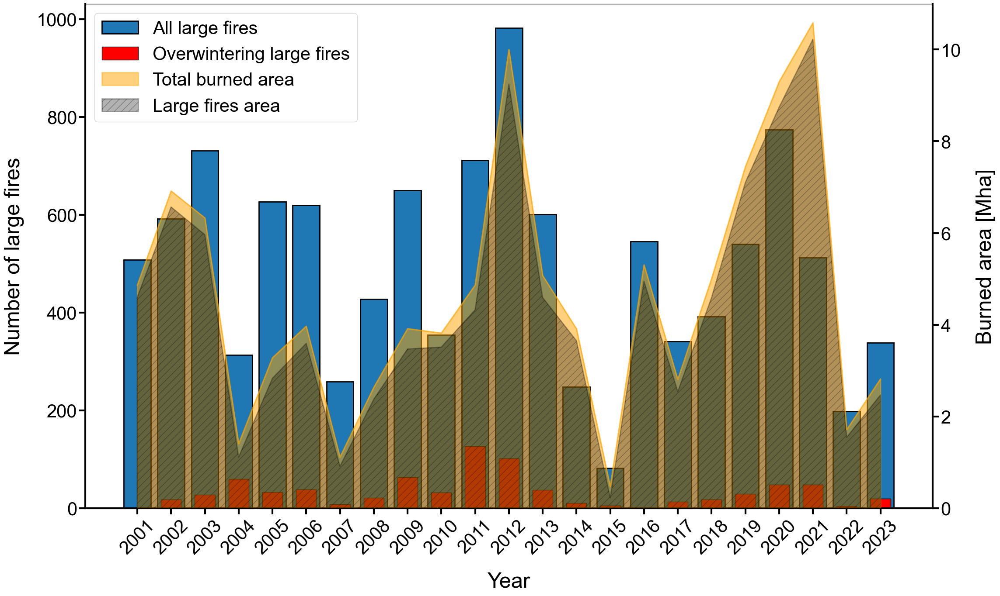

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(25, 15))
ax.bar(timeseries.index, large, 
                lw=2, label='All large fires', width=0.8,
               edgecolor='black'#, color='#4169E1'
                )
ax.bar(timeseries.index[1:], over, 
                lw=1, label='Overwintering large fires', 
                color='red',
               width=0.6,
               edgecolor='black'#, color='#ff7f00'
                )
ax.set_ylabel('Number of large fires', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=25);
timeseries.BA_Area.plot(
                kind='area', secondary_y=True, color=['orange'], linewidth=2, alpha=0.5)
ax.right_ax.fill_between(timeseries.index, areas_large, color='k', edgecolor='k', 
                         hatch='//', label='Large fires area', alpha=0.3, linewidth=2)
ax.right_ax.tick_params('y', colors='black')
ax.right_ax.set_ylabel('Burned area [Mha]', size=35, labelpad=25, color='black');
ax.set_xticks(timeseries.index);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.right_ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(timeseries.index, rotation=45);
ax.set_ylim(0)
# ax.right_ax.set_ylim(0)
handles, labels = [], []
for a in fig.get_axes():
    [handles.append(i) for i in a.get_legend_handles_labels()[0]]
    [labels.append(i) for i in a.get_legend_handles_labels()[1]]
labels = ['All large fires', 'Overwintering large fires', 'Total burned area', 'Large fires area']
ax.legend(handles, labels, fontsize=30, loc="upper left")
ax.right_ax.set_ylim(0, 10.99);
ax.spines[['bottom', 'left', 'right']].set_linewidth(3)


plt.savefig(f'{local_path}/Plots/BA_Overwintering-Large-Fires.jpeg', 
           dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

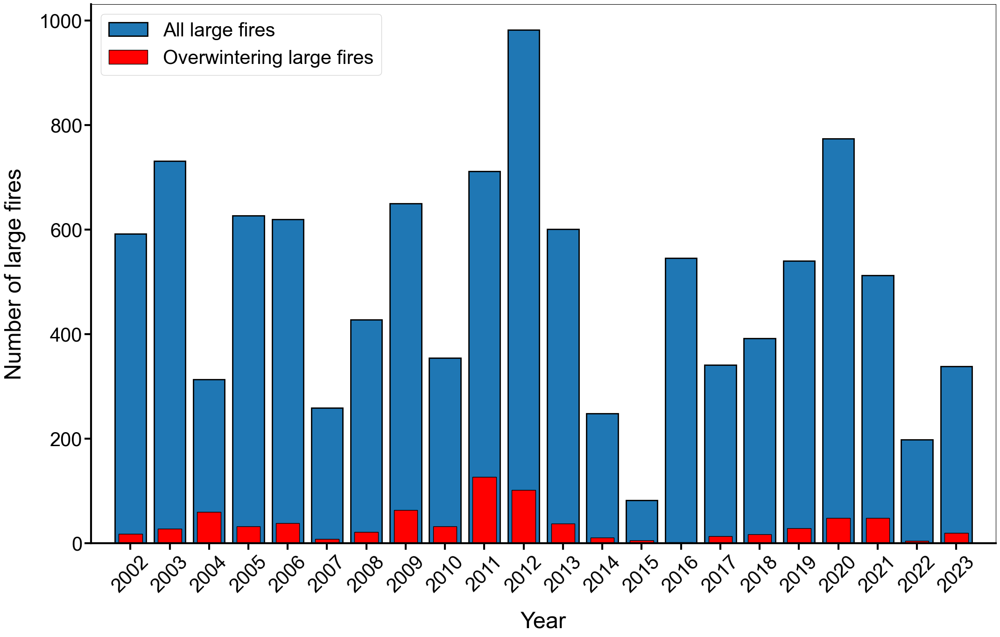

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(25, 15))
ax.bar(timeseries.index[1:], large[1:], 
                lw=2, label='All large fires', width=0.8,
               edgecolor='black'#, color='#4169E1'
                )
ax.bar(timeseries.index[1:], over, 
                lw=1, label='Overwintering large fires', 
                color='red',
               width=0.6,
               edgecolor='black'#, color='#ff7f00'
                )
ax.set_ylabel('Number of large fires', size=35, labelpad=20);
ax.set_xlabel('Year', size=35, labelpad=25);
ax.spines[['bottom', 'left']].set_linewidth(3)
ax.legend(fontsize=30, loc="upper left")
ax.set_xticks(timeseries.index[1:]);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(timeseries.index[1:], rotation=45);
ax.set_xlim(timeseries.index.min(), timeseries.index.max()+1);

plt.savefig(f'{local_path}/Plots/Overwintering-Large-Fires.jpeg', 
           dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

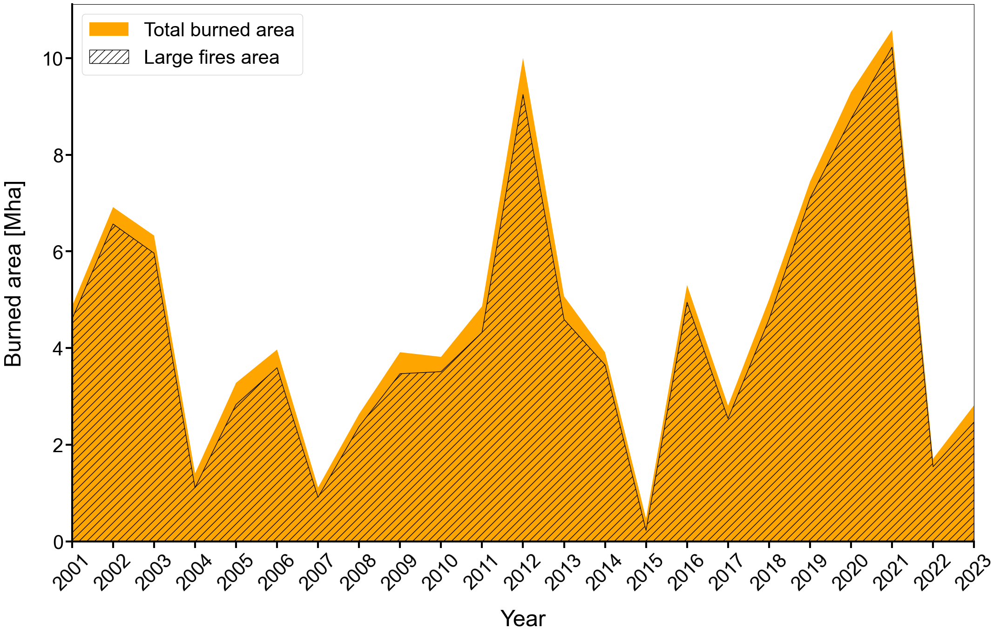

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(25, 15))
# timeseries.BA_Area.plot(
#                 kind='area', color=['orange'], linewidth=2, alpha=0.5)
ax.fill_between(timeseries.index, timeseries.BA_Area, color='orange', edgecolor='none', 
                         hatch='', label='Total burned area', alpha=1)
ax.fill_between(timeseries.index, areas_large, color='none', edgecolor='k', 
                         hatch='//', label='Large fires area', alpha=1, linewidth=1)

ax.tick_params('y', colors='black')
ax.set_ylabel('Burned area [Mha]', size=35, labelpad=25, color='black');
ax.set_xticks(timeseries.index);
ax.tick_params(labelsize = 30, size=10, width=3)
ax.set_xticklabels(timeseries.index, rotation=45);
ax.set_ylim(0)
ax.set_xlabel('Year', size=35, labelpad=25);
ax.spines[['bottom', 'left']].set_linewidth(3)
ax.legend(fontsize=30, loc="upper left")
ax.set_xlim(timeseries.index.min(), timeseries.index.max());

plt.savefig(f'{local_path}/Plots/Large-Fires_in_BA.jpeg', 
           dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

## Northern Fires: Yearly latitudinal

In [584]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-1][0:4], '%Y')
    ds.coords['time'] = time
    return ds

layer, variable, res = 'BA', 'Area', '025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/{layer}_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')

In [75]:
a = ds.band_data.sum('x').transpose()
arctic = a.where(a.y >= 66.5).sum('y')
## Contribution of arctic fires of each year
(arctic / a.sum('y') * 100).to_dataframe().drop(columns='spatial_ref')

,band_data
time,
2001-01-01,33.869545
2002-01-01,3.776277
2003-01-01,9.443862
2004-01-01,3.357957
2005-01-01,17.692259
2006-01-01,3.893839
2007-01-01,9.867237
2008-01-01,1.030781
2009-01-01,5.676975


In [346]:
## Contribution of each year to arctic fires
(arctic / a.where(a.y >= 66.5).sum() * 100).to_dataframe().drop(columns='spatial_ref')

,band_data
time,
2001-01-01,13.199086
2002-01-01,2.092018
2003-01-01,4.787732
2004-01-01,0.378951
2005-01-01,4.652834
2006-01-01,1.238454
2007-01-01,0.883403
2008-01-01,0.217751
2009-01-01,1.780808


#### 1.1) Grid plot

In [76]:
layer, variable, res = 'BA', 'Area', '1'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/{layer}_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')
ds_lat = ds.band_data.sum('x').transpose()
ds_lat['time'] = [datetime.utcfromtimestamp(x.astype('O') / 1e9).timetuple().tm_year for x in ds_lat.time.values]

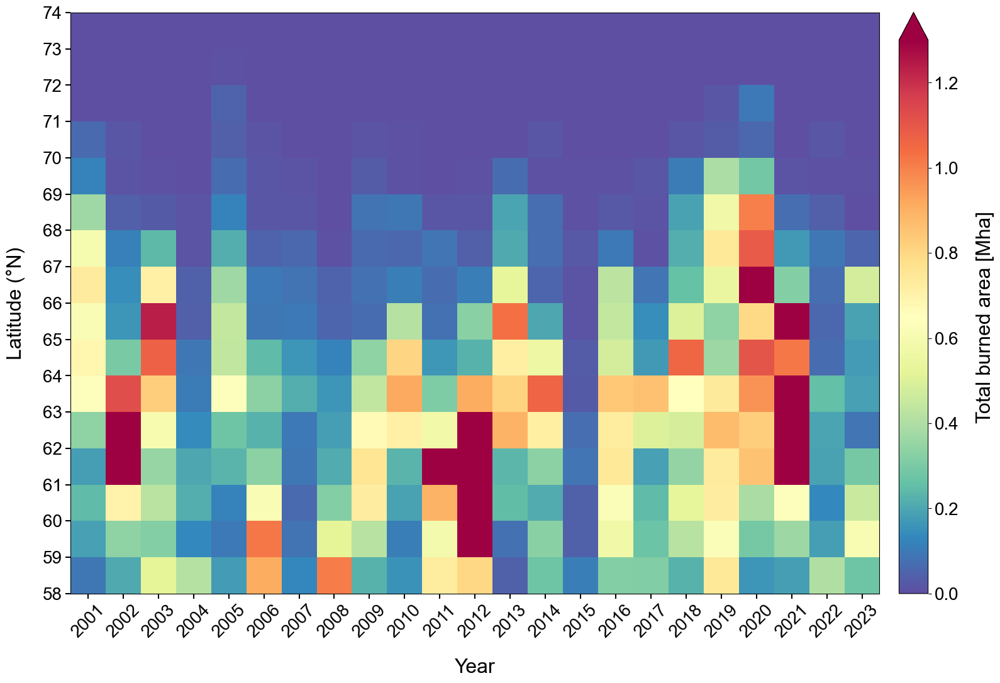

In [82]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
im = (ds_lat * 1e-10).plot(ax=ax, 
                 vmax=1.3, 
                 # vmax=7e9, 
                 cbar_kwargs={'pad': 0.02},
                 cmap='Spectral_r')
xticks = Years
# yticks = ds_lat.y.values-0.5
yticks = np.arange(58, 74.1, 1)
ax.set_xticks(xticks);
ax.set_yticks(yticks);
# ax.tick_params(labelsize = 10, size=8, width=2)
ax.set_xticklabels(xticks, rotation=45);
ax.set_title('');
ax.set_ylabel('Latitude (°N)', size=23, labelpad=20);
ax.set_xlabel('Year', size=23, labelpad=20);
cb = im.colorbar
cb.set_label('Total burned area [Mha]', size=23, labelpad=20)
cb.ax.tick_params(labelsize=20)
ax.tick_params(labelsize = 20, size=6, width=1.5)

plt.savefig(f'{local_path}/Plots/Grid_North{layer}_BurnedYear_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

#### 1.2) Violin plot

In [322]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-1][0:4], '%Y')
    ds.coords['time'] = time
    return ds

In [323]:
layer, variable, res = 'BA', 'Area', '025'
ds = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/{layer}_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')
ds_lat = ds.band_data.sum('x').transpose()
ds_lat['time'] = [datetime.utcfromtimestamp(x.astype('O') / 1e9).timetuple().tm_year for x in ds_lat.time.values]
df = ds_lat.to_dataframe().reset_index().drop(columns='spatial_ref')
df

,y,time,band_data
0,73.875,2001,0.000000e+00
1,73.875,2002,0.000000e+00
2,73.875,2003,0.000000e+00
3,73.875,2004,0.000000e+00
4,73.875,2005,0.000000e+00
...,...,...,...
1467,58.125,2019,1.492387e+09
1468,58.125,2020,3.583055e+08
1469,58.125,2021,4.252641e+08
1470,58.125,2022,1.028336e+09


In [41]:
df_expanded = pd.DataFrame()
for i in df.loc[df.band_data > 0].index:
    row = df.iloc[i]
    count = int(np.round(row['band_data'] * 1e-6, 0))
    df_expanded = pd.concat([df_expanded, pd.DataFrame([row] * count)])

In [42]:
# df_expanded = df_expanded.reset_index()
year_counts = df_expanded['time'].value_counts().sort_index()
df_expanded['Frequency'] = df_expanded['time'].map(year_counts) / year_counts.max()

/tmp/ipykernel_3082326/1490634226.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(Years, rotation=45);


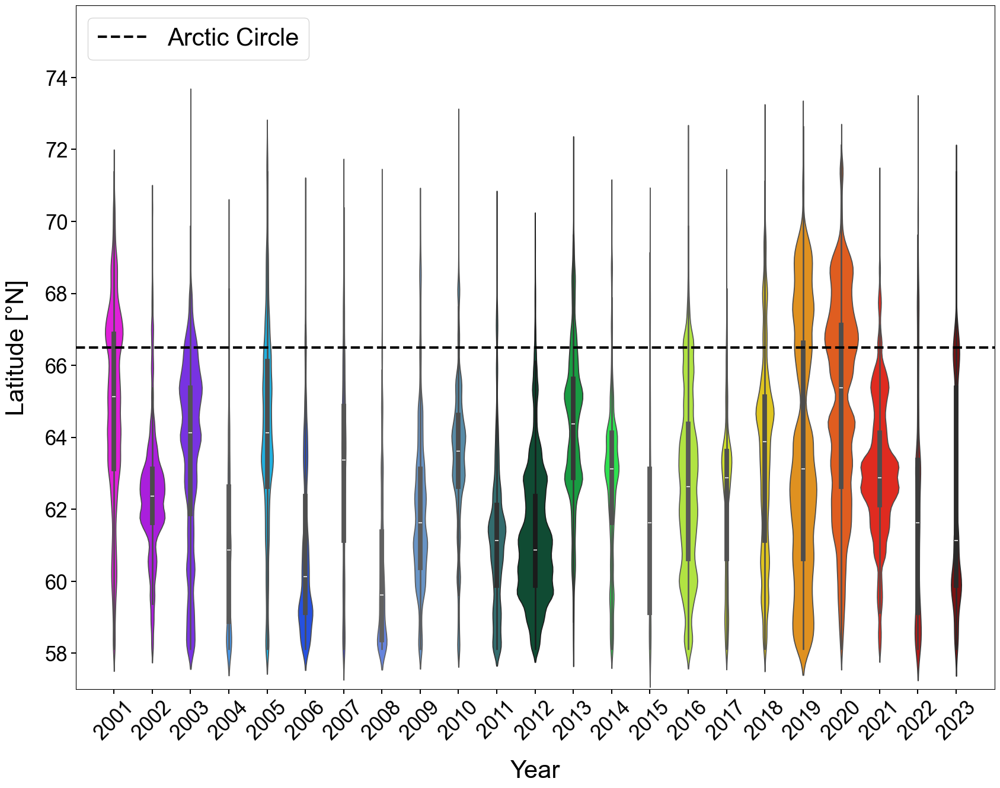

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(20, 15))
i = 0
for category, subset in df_expanded.groupby('time'):
    sns.violinplot(
        x=subset['time'],
        y=subset['y'],
        data=subset,
        width=subset['Frequency'].iloc[0],  # Use scaled width
        ax=ax,
        color=cmap.reversed()(norm(boundaries[i])),
    )
    # sns.stripplot(data=subset, x=subset['YEAR'], y=subset['TOP'], color="black", size=10, alpha=0.7)
    i += 1
ax.set_xticklabels(Years, rotation=45);
ax.set_ylabel('Latitude [°N]', size=30, labelpad=20);
ax.set_xlabel('Year', size=30, labelpad=20);
ax.tick_params(labelsize = 25, size=6, width=1.5)
ax.plot(np.arange(-1, 24), np.repeat(66.5, 25), color='k', lw=3, linestyle='--', label='Arctic Circle')
ax.set_ylim(57, 76)
ax.set_xlim(-1, 23)
ax.legend(fontsize=30, loc="upper left")
ax.set_yticks(np.arange(58, 75, 2));

plt.savefig(f'{local_path}/Plots/Violinplot_North{layer}_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

#### 1.3) Curve plots and histograms

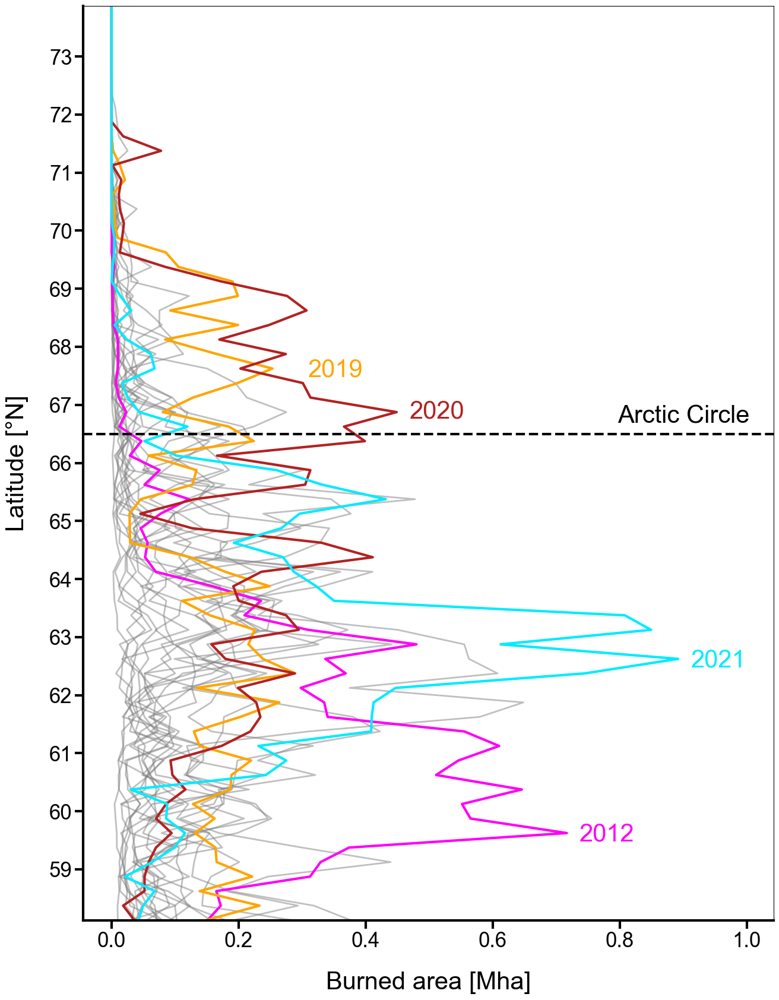

In [326]:
fig, ax = plt.subplots(1, 1, figsize=(15, 20))
a = df.copy()
a['band_data'] = df.band_data * 1e-10
cmap = plt.cm.Spectral_r
anomalous = {2012: ['#ff00f7', 59.6, 3, 1], 
              2019: ['orange', 67.6, 3, 1], 
              2020: ['firebrick', 66.88, 3, 1], 
              2021: ['#00ebff', 62.6, 3, 1],
              # 2011: 'blue'
            }

anomalous = {**{i: ['grey', None, 2, 0.5] for i in np.unique(a.time) if i not in anomalous.keys()},
             **anomalous }
for y, val in anomalous.items():
    a.loc[a.time == y].plot('band_data', 'y', color=val[0], ax=ax, lw=val[2], alpha=val[3])
    if val[1]:
        ax.text(a.loc[df.time == y].band_data.max()+2e-2, val[1], s=y, fontsize=30, ha='left', va='center', color=val[0])
ax.set_ylabel('Latitude [°N]', size=30, labelpad=25);
ax.set_xlabel('Burned area [Mha]', size=30, labelpad=25);
# Adjust x-axis labels
# plt.xticks(ticks=bin_centers[::2], labels=center_labels[::2], rotation=45)  # Show every other label
ax.set_yticks(ticks=np.arange(58, 74), rotation=0);
ax.get_legend().remove()
ax.tick_params(labelsize = 25, size=10, width=3)
ax.set_ylim(a.y.min(), a.y.max());
ax.set_xlim(None, a.band_data.max()+1.5e-1);
ax.plot(np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 5), 
        np.repeat(66.5, len(np.linspace(ax.get_xlim()[0], ax.get_xlim()[1], 5))), 
        color='k', lw=3, linestyle='--', label='Arctic Circle')
ax.text(0.9, 66.8, s='Arctic Circle', fontsize=30, ha='center', va='center', color='k')
ax.spines[['bottom', 'left']].set_linewidth(3)
plt.savefig(f'{local_path}/Plots/Latitudinal-plot_{layer}_{res}D.jpeg', 
               dpi= 500, bbox_inches='tight', pad_inches=1*1/2.54)

## Spatial correlation BA ~ PeatFire

In [35]:
def preprocessing(ds):
    time = datetime.strptime(ds.encoding['source'].split('_')[-1][0:4], '%Y')
    ds.coords['time'] = time
    return ds

layer, variable, res = 'BA', 'Area', '1'
BA = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/BA_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')
PF = xr.open_mfdataset(f'{local_path}/PeatFire/Summaries/PeatFire_{variable}_{res}D_*.tif', 
                          concat_dim='time', combine='nested', preprocess=preprocessing).sum('band')

In [527]:
stats.pearsonr(BA.band_data.values.flatten(), PF.band_data.values.flatten())

PearsonRResult(statistic=0.8705269409936153, pvalue=0.0)

In [528]:
stats.pearsonr(BA.band_data.sum('time').values.flatten(), PF.band_data.sum('time').values.flatten())

PearsonRResult(statistic=0.868363835282826, pvalue=0.0)